In [39]:
import scipy as sp
from pylab import *
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.pylab as pylabㅌ
import pandas as pd
import seaborn as sns
import random


from InitializeSpeciesPool import *
from LV import *
from VariousMetrics import *

sns.set_style("ticks")

params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}



session_name="results/test"
import pickle


# Function Definition

In [40]:
from scipy.integrate import odeint

'''

def gLV(y, t, I_simul, g_simul, k_simul):
    dydt = np.zeros_like(y)
    for i in range(len(y)):
        dydt[i] = g_simul[i]* y[i] * (1- np.sum(I_simul[i,:] * y)/k_simul[i])
    return dydt

def run_lotka_volterra_dynamics(y0, t, s_idx, I, g, k):
    
    s_idx=np.where(s_idx)[0].tolist()
    N=len(y0)
    y0_simul=y0[s_idx]
    I_simul=I[s_idx,:]
    I_simul=I_simul[:,s_idx]
    g_simul=g[s_idx]
    k_simul=k[s_idx]
    
    
    y = odeint(gLV, y0_simul, t, args=(I_simul, g_simul, k_simul))
    y_out=np.zeros(N)
    for i in range(y.shape[1]):
        y_out[s_idx[i]]=y[-1,i] 
    return y
'''
def gLV_env(y, t, beta, delta, migration_rate, I, g, k, p, q, varIdx):
    # p : species -> pH
    # q : pH -> species
    dydt = np.zeros(len(varIdx['env']) + len(varIdx['species']))
    
    growth_rate_multiplier = 1 - (np.matmul(I, y[varIdx['species']])) / k + np.matmul(q, y[varIdx['env']])
    
    dydt[varIdx['species']] = np.multiply(np.multiply(y[varIdx['species']], g), growth_rate_multiplier) + migration_rate #- death_rate * y[varIdx['species']]
    dydt[varIdx['env']] = delta * (-y[varIdx['env']]) + beta* np.matmul(p, y[varIdx['species']]) - delta * 0.0001 * y[varIdx['env']]**5
    
    return dydt

def run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=False):
    

    N=system_config['N']
    N_env=system_config['N_env']
    beta = system_config['beta']
    delta = system_config['delta']
    migration_rate = system_config['migration_rate']
    I = system_config['I']
    g = system_config['g']
    k = system_config['k']
    p = system_config['p']
    q = system_config['q']
                                   
    I=I[species_index,:]
    I=I[:,species_index]
    g=g[species_index]
    k=k[species_index]
    p=p[:,species_index] # p is N_env x N
    p=p[env_index,:]                               
    q=q[species_index,:] # q is N x N_Nev
    q=q[:,env_index]                             
    
    varIdx={'species' : np.arange(len(species_index)),
           'env' : np.arange(len(species_index),len(species_index)+len(env_index))}
    y0=np.concatenate((y0_species, y0_env))
    
    y = odeint(gLV_env, y0, t, args=(beta, delta, migration_rate, I, g, k, p, q, varIdx), atol=1e-12, rtol=1e-10)
    y_out={}
    y_out_species=np.zeros(N)
    y_out_env=np.zeros(N_env)

    for i in range(len(species_index)):
        y_out_species[species_index[i]]=y[-1,i]
        y_out['species']=y_out_species
    for i in range(len(env_index)):
        y_out_env[env_index[i]]=y[-1,len(species_index)+i]
        y_out['env']=y_out_env
    
    if to_plot:
        # Create plots
        fig, axs = plt.subplots(2, 1, figsize=(7, 6))  # 2 Rows, 1 Column

        # Plotting species data
        for i in range(len(species_index)):
            axs[0].plot(t, y[:, i], label=f'Species {i+1}')
        axs[0].set_title('Species Time Series')
        axs[0].set_xlabel('Time (log scale)')
        axs[0].set_ylabel('Value (log scale)')
        axs[0].set_xscale('log')
        axs[0].set_yscale('log')
        axs[0].axhline(y=1e-6, color='r', linestyle='dotted', linewidth=1)
        axs[0].set_ylim(1e-6, 100)

        axs[0].legend()

        # Plotting environmental data
        for i in range(len(env_index)):
            axs[1].plot(t, y[:, len(species_index)+i], label=f'Env Variable {i+1}')
        axs[1].set_title('Environmental Variables Time Series')
        axs[1].set_xlabel('Time (log scale)')
        axs[1].set_ylabel('Env Value')
        axs[1].set_xscale('log')
        axs[1].legend()

        
        plt.tight_layout()
        plt.show()
    print(y_out)
    return y_out


# PARAMETER DEFINITION

In [41]:
def uniform_distribution(u,o):
    return u+(2*o)*np.random.random()-o

def input_distribution(k):
    return np.random.exponential(k)

def custom_distribution(a, b):
    """
    Custom distribution sampling function.
    
    Parameters:
    a (float): Lower bound of the first range (-a to 0).
    b (float): Upper bound of the second range (0 to b).
    
    Returns:
    float: Sampled value from the custom distribution.
    """
    # Generate a random number between 0 and 1
    random_value = np.random.random()
    
    if random_value < 0.5:
        # If the value is less than 0.5, sample from the uniform distribution [-a, 0)
        return -a + a * np.random.random()
    else:
        # If the value is 0.5 or greater, sample from the uniform distribution [0, b)
        return b * np.random.random()


In [42]:
def one_hot_vector(n_species,i):
    # Create an array of length n_species with all values set to 0.001
    vector = np.full(n_species, 0.0001)
    
    # Set the ith element to 0.1
    vector[i] = 0.01
    
    return vector

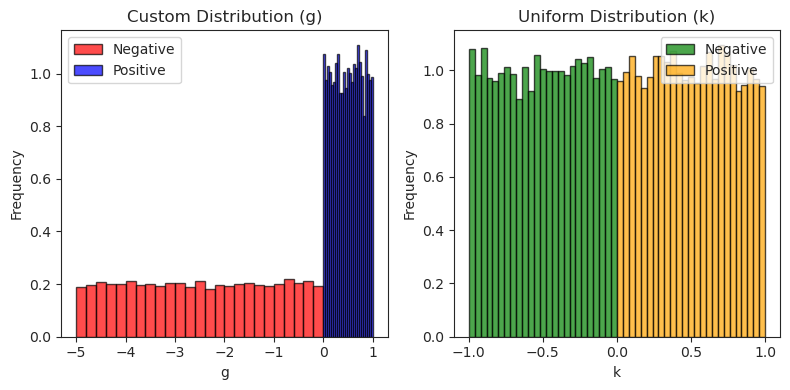

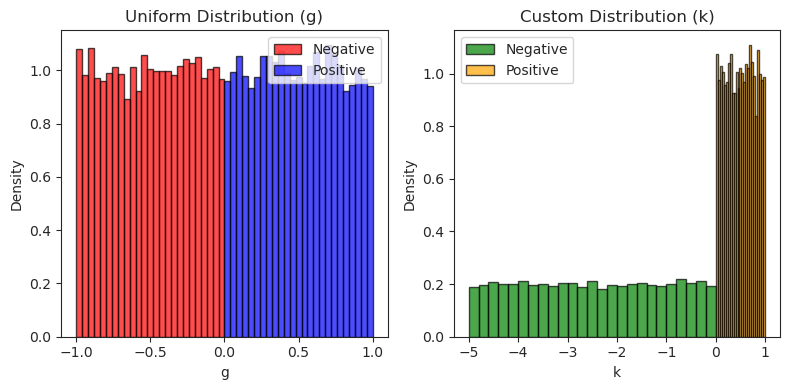

In [43]:
# Generate samples
num_samples = 20000
custom_samples = [custom_distribution(5, 1) for _ in range(num_samples)]
uniform_samples = np.random.uniform(-1, 1, num_samples)

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Custom distribution plot
custom_neg = [x for x in custom_samples if x < 0]
custom_pos = [x for x in custom_samples if x >= 0]

axs[0].hist(custom_neg, bins=25, color='red', edgecolor='black', alpha=0.7, label='Negative', density=True)
axs[0].hist(custom_pos, bins=25, color='blue', edgecolor='black', alpha=0.7, label='Positive', density=True)
axs[0].set_title('Custom Distribution (g)')
axs[0].set_xlabel('g')
axs[0].set_ylabel('Frequency')
axs[0].legend()

# Uniform distribution plot
uniform_neg = [x for x in uniform_samples if x < 0]
uniform_pos = [x for x in uniform_samples if x >= 0]

axs[1].hist(uniform_neg, bins=25, color='green', edgecolor='black', alpha=0.7, label='Negative', density=True)
axs[1].hist(uniform_pos, bins=25, color='orange', edgecolor='black', alpha=0.7, label='Positive', density=True)
axs[1].set_title('Uniform Distribution (k)')
axs[1].set_xlabel('k')
axs[1].set_ylabel('Frequency')
axs[1].legend()

# Show plots
plt.tight_layout()
plt.show()



# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Uniform distribution plot (g)
uniform_neg = [x for x in uniform_samples if x < 0]
uniform_pos = [x for x in uniform_samples if x >= 0]

axs[0].hist(uniform_neg, bins=25, color='red', edgecolor='black', alpha=0.7, label='Negative', density=True)
axs[0].hist(uniform_pos, bins=25, color='blue', edgecolor='black', alpha=0.7, label='Positive', density=True)
axs[0].set_title('Uniform Distribution (g)')
axs[0].set_xlabel('g')
axs[0].set_ylabel('Density')
axs[0].legend()

# Custom distribution plot (k)
custom_neg = [x for x in custom_samples if x < 0]
custom_pos = [x for x in custom_samples if x >= 0]

axs[1].hist(custom_neg, bins=25, color='green', edgecolor='black', alpha=0.7, label='Negative', density=True)
axs[1].hist(custom_pos, bins=25, color='orange', edgecolor='black', alpha=0.7, label='Positive', density=True)
axs[1].set_title('Custom Distribution (k)')
axs[1].set_xlabel('k')
axs[1].set_ylabel('Density')
axs[1].legend()

# Show plots
plt.tight_layout()
plt.show()

In [44]:
def plot_states_from_cfg(system_config):
    for i in range(12):
        y_out_list=[]
        y0_species=one_hot_vector(12,i)
        y0_env=[0]
        t=np.linspace(0, 2000, 10000)

        y_out = run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=True)

        y_out_list.append(y_out)
    #print(np.sum(y_out['species']), np.sum(y_out['env']) )
    num_datasets = len(y_out_list)

    # Prepare subplots
    fig, axs = plt.subplots(2, 1, figsize=(8, 8))

    # Data for plots
    species_matrix = np.array([y_out['species'] for y_out in y_out_list])
    env_data = np.array([y_out['env'][0] for y_out in y_out_list])  # Assuming env is a single-element array

    # Normalize species data
    species_matrix = np.maximum(species_matrix, 0)  # Removing negative values for normalization
    species_sums = np.sum(species_matrix, axis=1, keepdims=True)
    normalized_species = species_matrix / species_sums

    # Bar width
    bar_width = 0.8 / num_datasets  # Adjust bar width based on the number of datasets

    # Plotting species composition
    for i in range(normalized_species.shape[1]):  # Loop through each species
        axs[0].bar(np.arange(num_datasets) + i * bar_width, normalized_species[:, i], bar_width, label=f'Species {i+1}')

    axs[0].set_title('Normalized Species Composition')
    axs[0].set_xlabel('Dataset Index')
    axs[0].set_ylabel('Proportion')
    axs[0].legend()

    # Plotting environmental factors
    axs[1].bar(np.arange(num_datasets), env_data, color='red', width=0.8)
    axs[1].set_title('Environmental Variable')
    axs[1].set_xlabel('Dataset Index')
    axs[1].set_ylabel('Environmental Value')

    plt.tight_layout()
    plt.show()

{'species': array([ 1.56295195e-49,  1.01190847e-01,  1.53301322e-66,  6.01539283e-01,
        8.55062254e-01,  1.26462698e+00, -8.24369090e-31,  8.14742462e-53,
        3.33004562e-01, -3.56638927e-31,  5.41673865e-58,  2.54519231e-40]), 'env': array([-0.83705558])}
{'species': array([ 1.07723722e-48,  1.01190847e-01, -4.50509818e-65,  6.01539283e-01,
        8.55062254e-01,  1.26462698e+00, -7.17617322e-21, -1.77680319e-40,
        3.33004562e-01, -5.17366158e-30, -1.04997421e-54,  9.05726924e-32]), 'env': array([-0.83705558])}
{'species': array([ 5.59380837e-086,  1.01190847e-001, -2.27176810e-131,
        6.01539283e-001,  8.55062254e-001,  1.26462698e+000,
       -4.10308865e-029,  1.20652767e-075,  3.33004562e-001,
       -8.14583112e-039,  2.02512984e-104, -1.57469031e-047]), 'env': array([-0.83705558])}
{'species': array([-2.40411862e-47,  1.01190847e-01, -7.43867558e-32,  6.01539283e-01,
        8.55062254e-01,  1.26462698e+00, -3.19115399e-25, -1.54556449e-39,
        3.33004

/state/partition1/llgrid/pkg/anaconda/anaconda3-2023a-pytorch/lib/python3.9/site-packages/scipy/integrate/_odepack_py.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


{'species': array([-1.57899491e-32,  1.04545535e+00, -2.05157232e-79, -1.05536760e-48,
        1.14353964e-74, -1.15906258e-79,  4.53206514e-01,  3.04736052e-72,
        6.33133917e-01, -5.32697308e-50,  6.62099021e-02,  1.85712864e-68]), 'env': array([0.5600747])}
{'species': array([ 2.81706640e-001,  9.21355399e-001,  5.77830794e-001,
       -1.23872725e-190, -2.26542894e-139, -2.85705237e-101,
       -5.50778389e-140,  8.10281580e-093,  4.60342515e-001,
       -2.85733377e-143,  1.74666588e-020,  9.64336067e-025]), 'env': array([-0.56212188])}
{'species': array([ 2.81706640e-001,  9.21355399e-001,  5.77830794e-001,
       -8.51302892e-169, -8.64085334e-115, -1.55729585e-109,
        7.61896931e-123,  2.44248254e-128,  4.60342515e-001,
       -1.26736918e-176,  4.23634898e-026, -8.50711459e-021]), 'env': array([-0.56212188])}
{'species': array([ 2.81706640e-001,  9.21355399e-001,  5.77830794e-001,
       -8.51302892e-169, -8.64085334e-115, -1.55729585e-109,
        7.61896931e-123,  

/tmp/ipykernel_3795981/3651983801.py:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 1, figsize=(6, 6))


{'species': array([-1.88547289e-055,  7.21987843e-001, -2.27203948e-052,
        1.28401698e-076,  1.50939601e-092,  2.34244092e-085,
        2.86078426e-084,  9.62882446e-001,  1.00836368e+000,
        7.48347995e-114, -3.74632715e-100,  2.25349674e-097]), 'env': array([-0.68716352])}
{'species': array([ 2.20283023e-40,  7.21987843e-01,  1.22160437e-37,  1.19416354e-53,
       -3.33432035e-48, -7.44011058e-47, -1.90495598e-50,  9.62882446e-01,
        1.00836368e+00, -1.17233126e-63,  8.16210534e-52,  9.78287572e-54]), 'env': array([-0.68716352])}
{'species': array([ 2.28173239e-27,  7.21987843e-01, -4.80830312e-35, -1.18777396e-38,
       -1.06350262e-38, -2.54234826e-42, -4.12545566e-42,  9.62882446e-01,
        1.00836368e+00, -1.47673906e-40, -1.21963063e-41, -2.72441780e-43]), 'env': array([-0.68716352])}
{'species': array([ 1.32093534e-30,  7.21987843e-01,  1.71687597e-35, -7.05117390e-42,
       -1.31281320e-61, -7.81259086e-59, -6.89718813e-56,  9.62882446e-01,
        1.00836

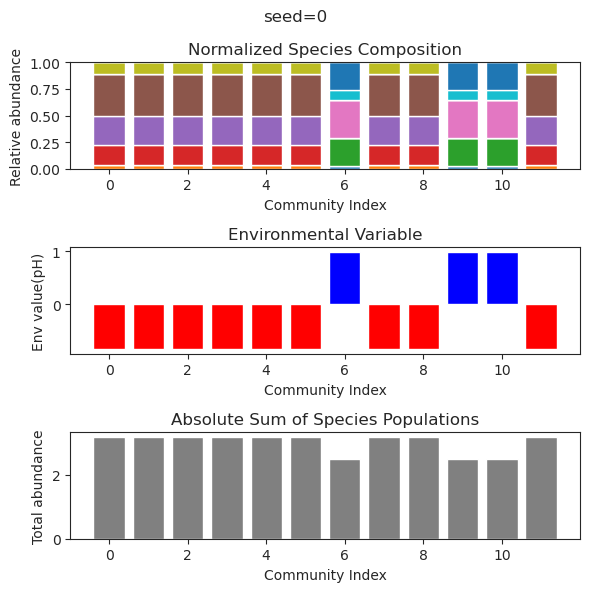

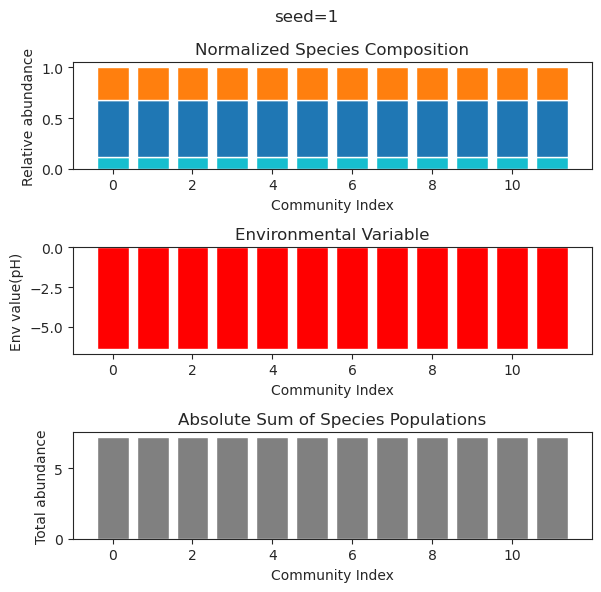

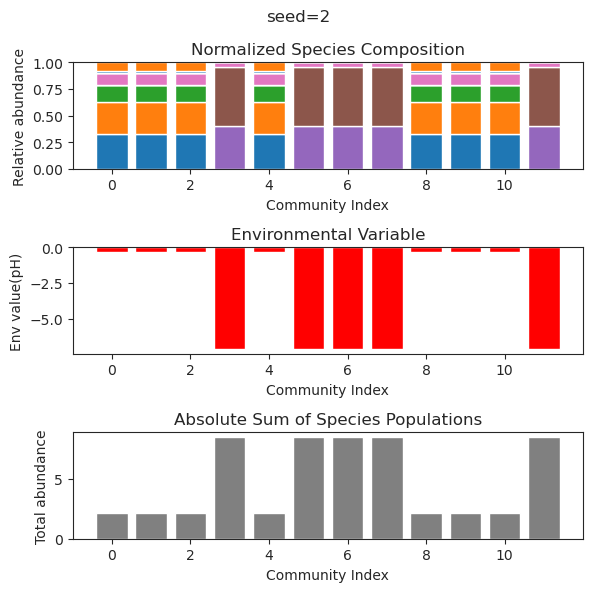

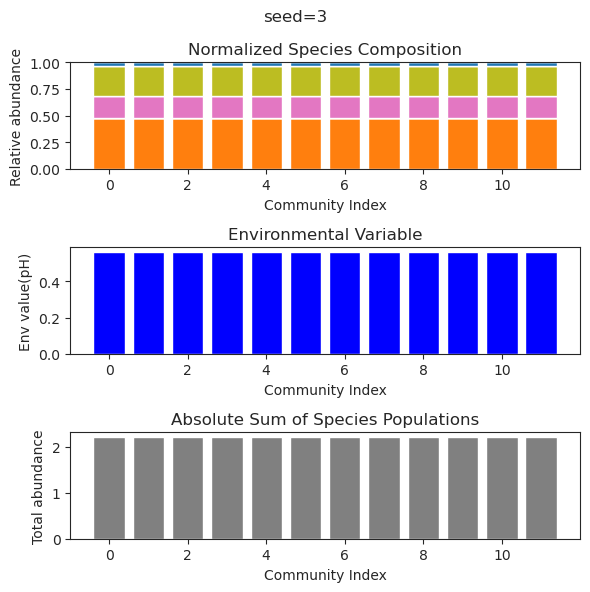

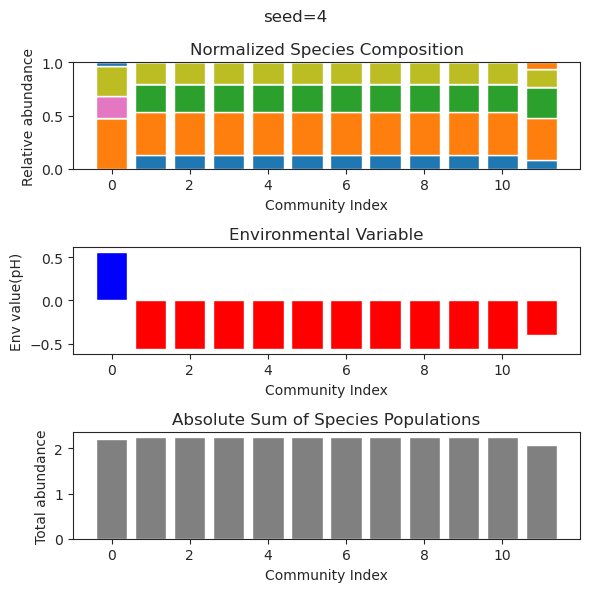

...

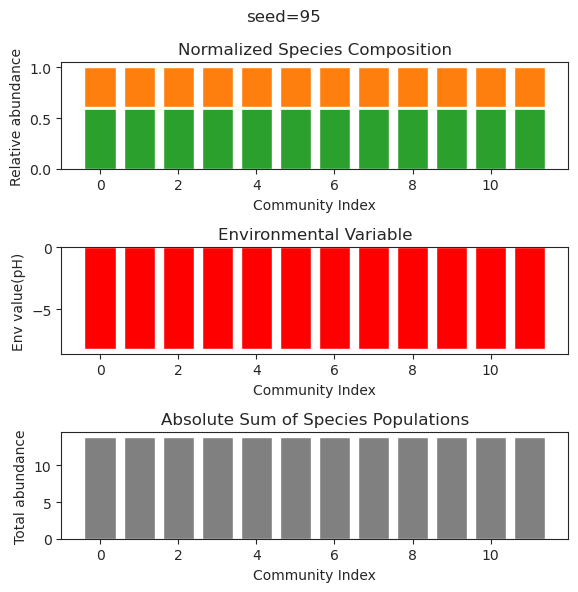

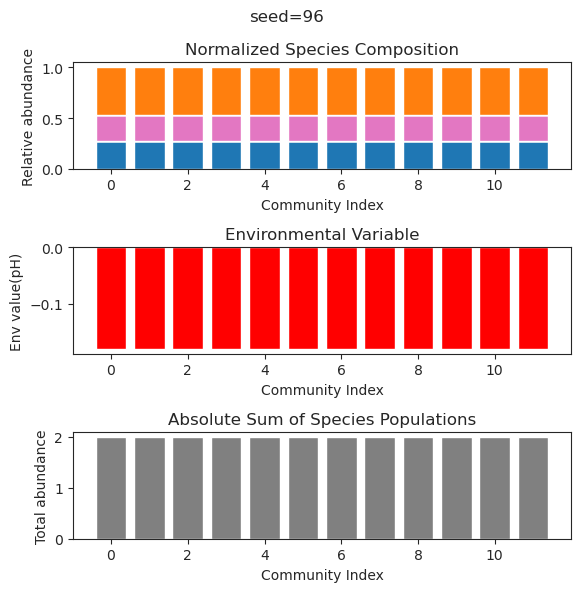

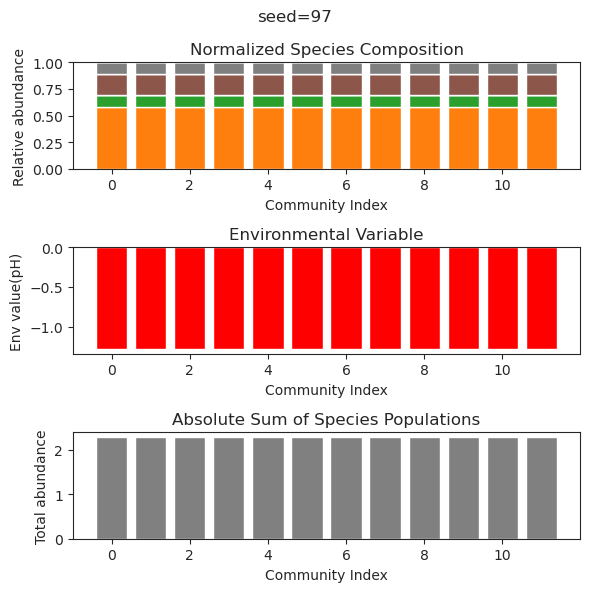

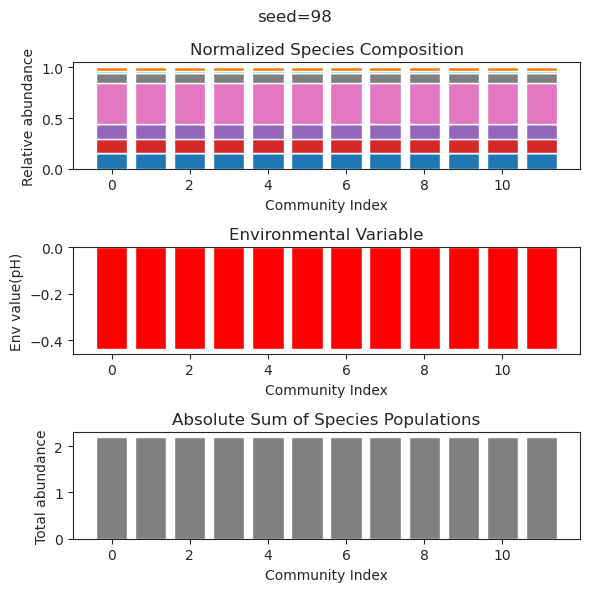

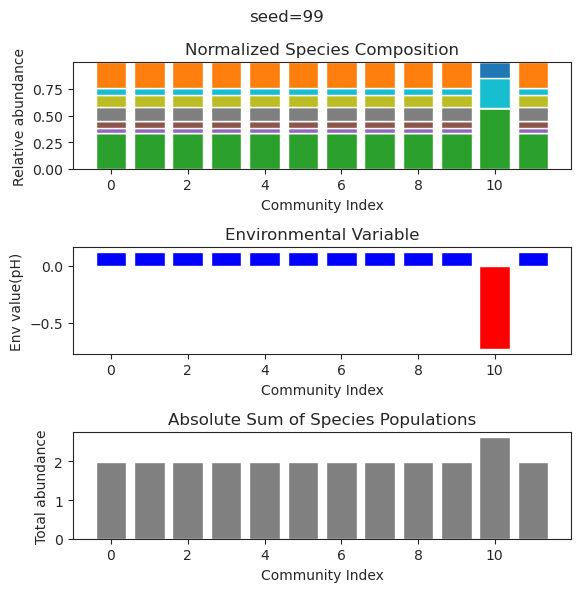

In [45]:
session_path='Results_ptailed/Session_Test1'
to_save={}
description=''
simulated_result={}

for seed_num in range(100):
    if not os.path.isdir(session_path):
        os.mkdir(session_path)
    # functions for uniform 

    f_I = lambda : uniform_distribution(0.5,0.5)
    f_g = lambda : np.ones(1)
    f_k = lambda : np.ones(1)
    f_p = lambda : custom_distribution(3,1)
    f_q = lambda : uniform_distribution(0,1)
    f_beta = lambda : np.ones(1)
    seed_num=seed_num
    to_plot=True

    np.random.seed(seed_num)

    N=12
    N_env=1


    I = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            I[i,j] = f_I()
    for i in range(N):
        I[i,i] =1

    g = np.zeros((N))
    for i in range(N):
        g[i] = f_g()

    k = np.zeros((N))
    for i in range(N):
        k[i] = f_k()   

    p = np.zeros((N_env, N))
    for i in range(N_env):
        for j in range(N):
            p[i,j] = f_p()

    #p[0,2]=-10

    q = np.zeros((N, N_env))
    for i in range(N):
        for j in range(N_env):
            q[i,j] = f_q()

    #q[2,0]=0.2



    beta = np.zeros(N_env)
    for i in range(N_env):
        beta[i]=f_beta()

    delta = 0.1 ## ln(100000)/24 ~= 0.5 per hour
    migration_rate=0#1e-7
    system_config = {
        'I': I,
        'g': g,
        'k': k,
        'p': p,
        'q': q,
        'beta': beta,
        'delta': delta,
        'migration_rate' : migration_rate,
        'N': N,
        'N_env': N_env,
        'seed_num':seed_num,
    } 

    file_path = f'{session_path}/system_config.json'

    label="test"
    sys
    ##

    y_out_list=[]
    system_config['beta'] = np.array([0.5])*delta

    for i in range(12):

        species_index=np.arange(0,12)
        env_index=np.array([0])
        y0_species=one_hot_vector(12,i)
        y0_env=[0]
        t=np.linspace(0, 2000, 10000)

        y_out = run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=False)

        y_out_list.append(y_out)

    num_datasets = len(y_out_list)

    # Prepare subplots
    fig, axs = plt.subplots(3, 1, figsize=(6, 6))

    # Data for plots
    species_matrix = np.array([y_out['species'] for y_out in y_out_list])
    env_data = np.array([y_out['env'][0] for y_out in y_out_list])  # Assuming env is a single-element array

    # Normalize species data
    species_matrix = np.maximum(species_matrix, 0)  # Removing negative values for normalization
    species_sums = np.sum(species_matrix, axis=1, keepdims=True)
    normalized_species = species_matrix / species_sums

    # Absolute sums of species data (sum across all species for each dataset)
    absolute_sums = np.sum(species_matrix, axis=1)
    simulated_result[seed_num]={'species':species_matrix, 'env' : env_data}

    if to_plot:
        plt.suptitle(f'seed={seed_num}')

        # Plotting species composition as stacked bars
        bottom_values = np.zeros(num_datasets)  # Initial bottom values are zeros
        for i in range(normalized_species.shape[1]):  # Loop through each species
            axs[0].bar(np.arange(num_datasets), normalized_species[:, i], bottom=bottom_values, label=f'Species {i+1}')
            bottom_values += normalized_species[:, i]  # Update bottom values for stacking

        axs[0].set_title('Normalized Species Composition')
        axs[0].set_xlabel('Community Index')
        axs[0].set_ylabel('Relative abundance')
        #axs[0].legend()

        # Plotting environmental factors
        colors = ['blue' if x > 0 else 'red' for x in env_data]  # Determine color based on sign of value
        axs[1].bar(np.arange(num_datasets), env_data, color=colors, width=0.8)
        axs[1].set_title('Environmental Variable')
        axs[1].set_xlabel('Community Index')
        axs[1].set_ylabel('Env value(pH)')

        # Plotting absolute sums of species data
        axs[2].bar(np.arange(num_datasets), absolute_sums, color='gray', width=0.8)
        axs[2].set_title('Absolute Sum of Species Populations')
        axs[2].set_xlabel('Community Index')
        axs[2].set_ylabel('Total abundance')

        plt.tight_layout()
        plt.savefig(session_path+f'/diagram_{seed_num}.png')

        #if to_plot:
        #    plt.savefig()


        #plt.show()
#simulated_result = {'a': 1, 'b': 2, 'c': 3}  # Your existing dictionary
#description = "This is a description of the simulated result."

# Combine both into a new dictionary
data_to_save = {
    'result': simulated_result,
    'description': description
}
# Serialize the combined data to a pickle file
with open(session_path+'/result_and_description.pkl', 'wb') as file:
    pickle.dump(data_to_save, file)


{'species': array([ 9.65876273e-034,  1.51558795e-066,  6.11026272e-060,
       -6.82453696e-105, -4.20868978e-079,  3.48298146e+000,
        2.63462331e-101,  2.99401395e+000,  5.18387629e-042,
       -3.41897030e-093,  3.17045163e-111,  1.74682188e-042,
        4.95920440e+000, -4.14528014e-039,  3.25045379e-087,
       -2.44937427e-107, -6.98866777e-107,  1.17737868e-076,
        3.53857131e-106,  6.53540334e-115, -1.23470950e-119,
        2.28093679e+000, -9.02398063e-074, -3.25725560e-119]), 'env': array([-6.94852287])}
{'species': array([ 1.90269295e-32, -6.21354394e-54,  5.48576337e-51, -1.30909970e-85,
        9.51430367e-66,  3.48298146e+00, -1.69993582e-85,  2.99401395e+00,
       -3.23590808e-42, -3.17212737e-49, -8.55153736e-52, -8.10296748e-35,
        4.95920440e+00,  3.39476128e-38,  9.37973619e-72,  1.26483196e-82,
       -1.43286897e-88, -6.59792218e-63,  3.39368696e-88, -3.82543512e-94,
       -9.13002010e-93,  2.28093679e+00,  3.25737139e-60, -6.71472151e-92]), 'env'

{'species': array([-9.21602445e-39, -1.66318918e-57, -1.69680987e-60,  4.11260985e-77,
       -3.64740166e-53,  3.48298146e+00, -1.81492804e-76,  2.99401395e+00,
       -1.17977058e-37, -5.73296131e-69, -5.40878644e-78, -2.74430524e-42,
        4.95920440e+00, -9.02221132e-40,  3.61718055e-63, -3.46445506e-78,
        3.38677156e-79, -4.73277339e-62, -1.65590622e-78,  1.35922546e-86,
       -8.27436394e-87,  2.28093679e+00,  6.68936463e-56,  2.19589486e-83]), 'env': array([-6.94852287])}
{'species': array([-1.77385891e-032,  2.80197270e-063, -3.73857084e-083,
        5.30430341e-105,  1.72057046e-071,  3.48298146e+000,
       -9.16468611e-099,  2.99401395e+000, -5.91914731e-040,
        1.15173684e-044, -2.62103440e-046, -1.79302319e-036,
        4.95920440e+000,  2.80535161e-039, -1.83447405e-082,
       -1.66309930e-107, -1.20354265e-106,  8.73932300e-073,
       -1.42264996e-110,  2.68134947e-115,  1.53278426e-117,
        2.28093679e+000, -9.31950266e-071, -1.46184925e-117]), 'env'

/tmp/ipykernel_3795981/3710125203.py:110: RuntimeWarning: invalid value encountered in divide
  normalized_species = species_matrix / species_sums


{'species': array([ 2.36561336e-43, -2.88615198e-71,  2.63143034e-61, -1.65801405e-62,
       -2.74140704e-25, -5.47727305e-74,  1.90439666e-68, -1.18101737e-67,
        4.94079843e+00, -1.91067298e-54,  9.79582602e-69,  9.82697975e-65,
        9.40617283e-01,  3.04384909e-32, -2.51334081e-68,  3.27441294e-66,
       -1.08808455e-73,  3.20266143e+00, -3.26630601e-44, -1.98260413e-59,
        4.78437959e+00,  1.27321642e-73,  7.08588599e-36,  6.72949563e-01]), 'env': array([-9.03464257])}
{'species': array([-5.48772831e-38,  3.70369805e-53,  1.05886008e-49,  9.56507977e-51,
       -1.11484761e-21,  4.76356363e-60,  6.11221093e-55, -2.78599975e-55,
        4.94079843e+00,  3.49848442e-45,  1.17037252e-52,  2.86030109e-50,
        9.40617283e-01, -1.61402954e-30,  8.04156556e-54,  4.73388078e-52,
       -1.80042234e-57,  3.20266143e+00, -1.06016375e-41, -8.69853529e-49,
        4.78437959e+00, -1.62807235e-54, -6.46685365e-34,  6.72949563e-01]), 'env': array([-9.03464257])}
{'species': ar

/tmp/ipykernel_3795981/3710125203.py:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(3, 1, figsize=(6, 6))


{'species': array([-6.91010594e-50, -1.27828186e-40, -1.90283973e-60,  6.63688622e-38,
        4.13257954e-68,  3.00386028e+00,  3.37419265e+00,  8.78429248e-51,
       -5.26318736e-40, -2.11227341e-49,  7.41529047e-56, -1.14155106e-53,
        2.96593704e+00, -4.92748076e-74,  4.02802849e-71,  3.20507445e-31,
        2.19101043e-71, -2.53362313e-39,  1.00960662e-74, -1.42511133e-49,
        8.82801579e-55,  8.94956341e-30,  2.48014790e+00,  1.31711234e+00]), 'env': array([-8.84842729])}
{'species': array([ 6.00588832e-064, -2.90688656e-041, -6.36918377e-077,
        5.53496509e-038, -8.93750697e-092,  3.00386028e+000,
        3.37419265e+000,  4.36734258e-058, -2.65102949e-043,
        3.40804450e-065,  6.32951758e-062,  1.11688667e-065,
        2.96593704e+000, -2.17163809e-102,  5.39478476e-095,
       -1.05377510e-035,  7.84848792e-096, -4.77121562e-047,
        5.83097365e-099, -1.40227208e-057,  3.42449412e-070,
        6.85316450e-032,  2.48014790e+000,  1.31711234e+000]), 'env'

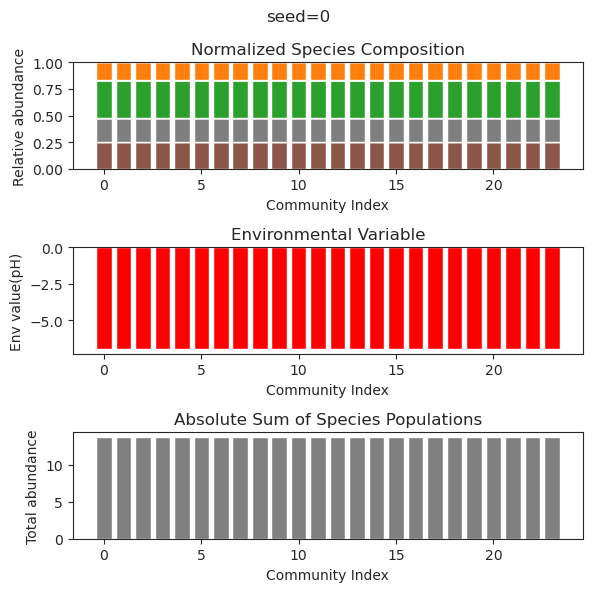

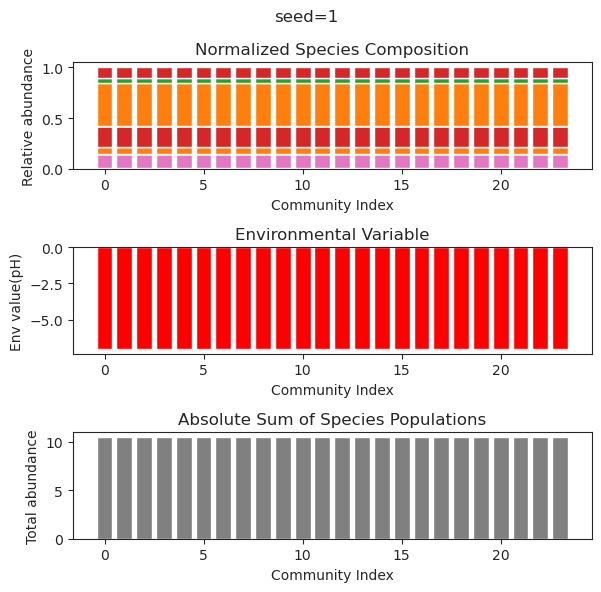

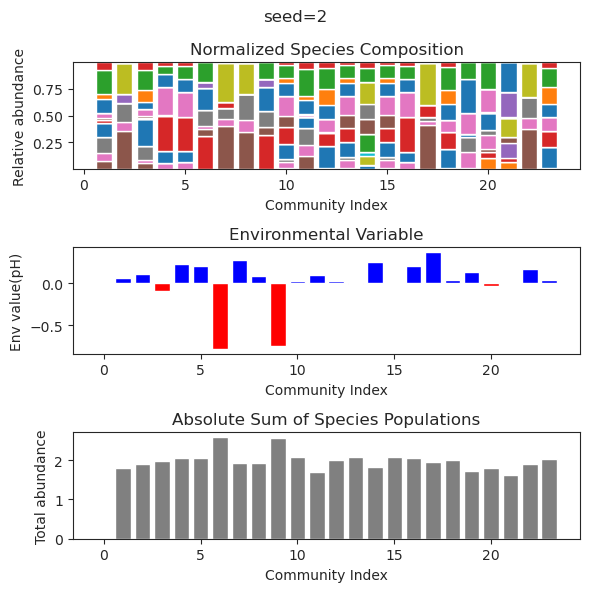

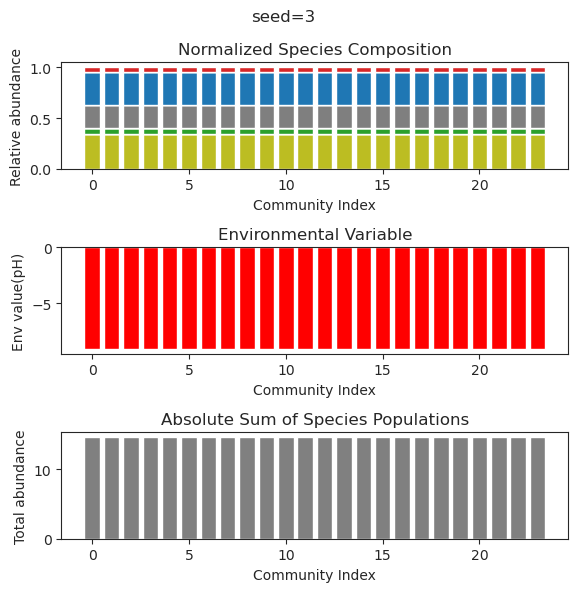

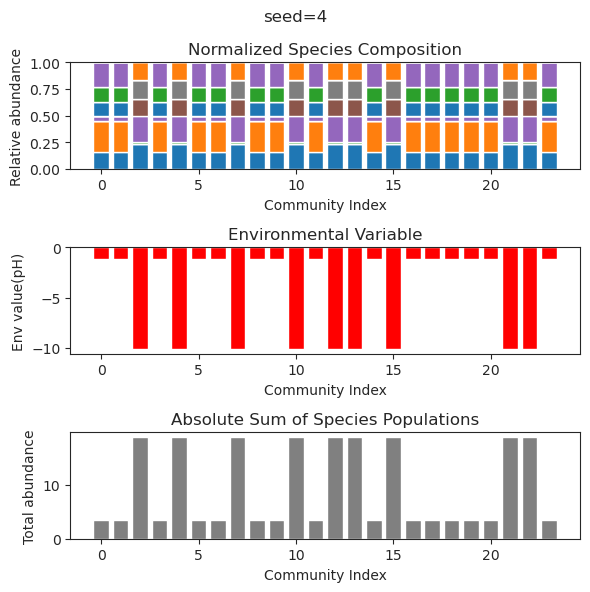

...

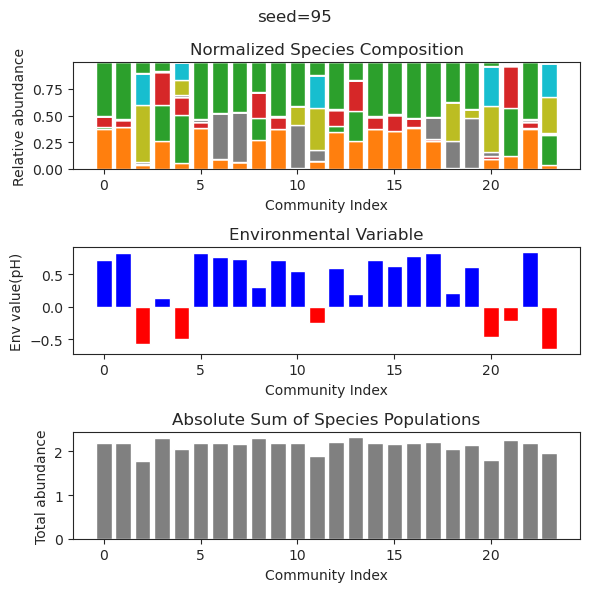

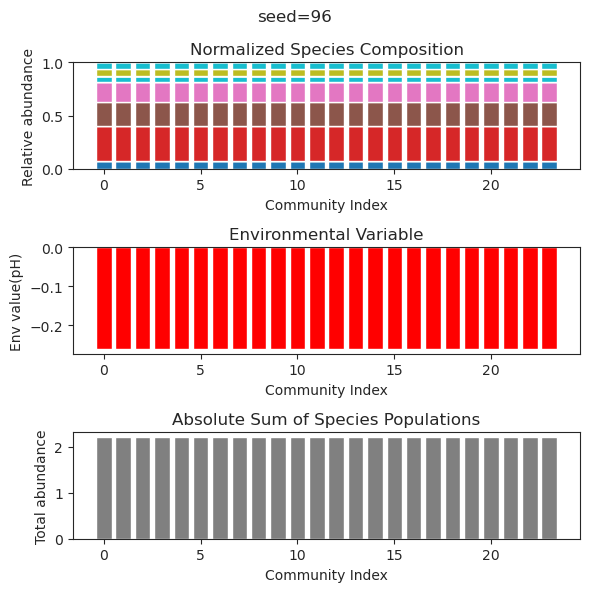

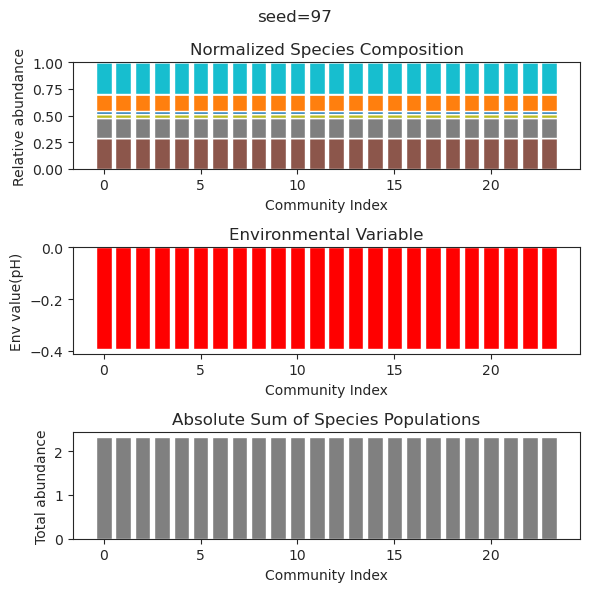

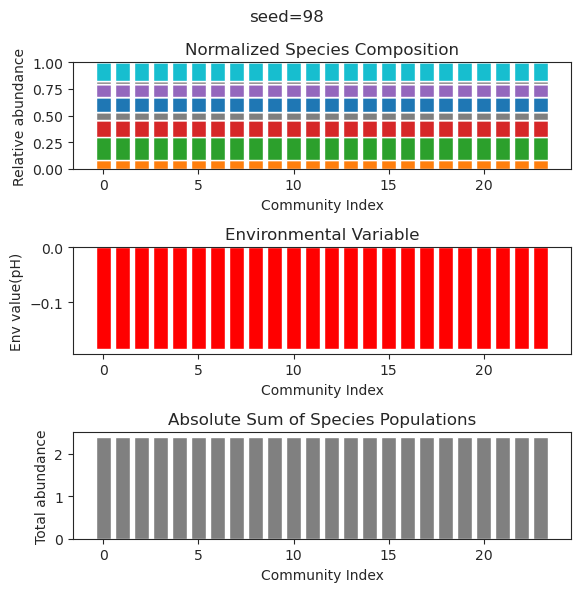

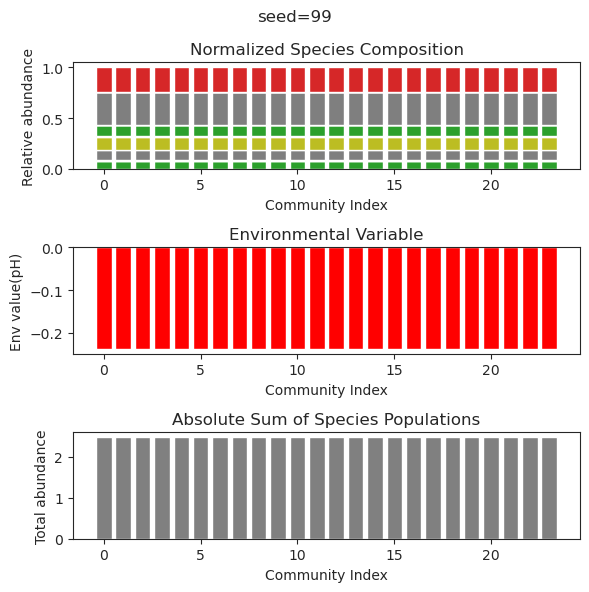

In [46]:
session_path='Results_ptailed/Session_Test2'
to_save={}
description=''
simulated_result={}

for seed_num in range(100):
    if not os.path.isdir(session_path):
        os.mkdir(session_path)
    # functions for uniform 

    f_I = lambda : uniform_distribution(0.5,0.5)
    f_g = lambda : np.ones(1)
    f_k = lambda : np.ones(1)
    f_p = lambda : custom_distribution(3,1)
    f_q = lambda : uniform_distribution(0,1)
    f_beta = lambda : np.ones(1)
    seed_num=seed_num
    to_plot=True

    np.random.seed(seed_num)

    N=24
    N_env=1


    I = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            I[i,j] = f_I()
    for i in range(N):
        I[i,i] =1

    g = np.zeros((N))
    for i in range(N):
        g[i] = f_g()

    k = np.zeros((N))
    for i in range(N):
        k[i] = f_k()   

    p = np.zeros((N_env, N))
    for i in range(N_env):
        for j in range(N):
            p[i,j] = f_p()

    #p[0,2]=-10

    q = np.zeros((N, N_env))
    for i in range(N):
        for j in range(N_env):
            q[i,j] = f_q()

    #q[2,0]=0.2



    beta = np.zeros(N_env)
    for i in range(N_env):
        beta[i]=f_beta()

    delta = 0.1 ## ln(100000)/24 ~= 0.5 per hour
    migration_rate=0#1e-7
    system_config = {
        'I': I,
        'g': g,
        'k': k,
        'p': p,
        'q': q,
        'beta': beta,
        'delta': delta,
        'migration_rate' : migration_rate,
        'N': N,
        'N_env': N_env,
        'seed_num':seed_num,
    } 

    file_path = f'{session_path}/system_config.json'

    label="test"
    sys
    ##

    y_out_list=[]
    system_config['beta'] = np.array([0.5])*delta

    for i in range(24):

        species_index=np.arange(0,24)
        env_index=np.array([0])
        y0_species=one_hot_vector(24,i)
        y0_env=[0]
        t=np.linspace(0, 2000, 10000)

        y_out = run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=False)

        y_out_list.append(y_out)

    num_datasets = len(y_out_list)

    # Prepare subplots
    fig, axs = plt.subplots(3, 1, figsize=(6, 6))

    # Data for plots
    species_matrix = np.array([y_out['species'] for y_out in y_out_list])
    env_data = np.array([y_out['env'][0] for y_out in y_out_list])  # Assuming env is a single-element array

    # Normalize species data
    species_matrix = np.maximum(species_matrix, 0)  # Removing negative values for normalization
    species_sums = np.sum(species_matrix, axis=1, keepdims=True)
    normalized_species = species_matrix / species_sums

    # Absolute sums of species data (sum across all species for each dataset)
    absolute_sums = np.sum(species_matrix, axis=1)
    simulated_result[seed_num]={'species':species_matrix, 'env' : env_data}

    if to_plot:
        plt.suptitle(f'seed={seed_num}')

        # Plotting species composition as stacked bars
        bottom_values = np.zeros(num_datasets)  # Initial bottom values are zeros
        for i in range(normalized_species.shape[1]):  # Loop through each species
            axs[0].bar(np.arange(num_datasets), normalized_species[:, i], bottom=bottom_values, label=f'Species {i+1}')
            bottom_values += normalized_species[:, i]  # Update bottom values for stacking

        axs[0].set_title('Normalized Species Composition')
        axs[0].set_xlabel('Community Index')
        axs[0].set_ylabel('Relative abundance')
        #axs[0].legend()

        # Plotting environmental factors
        colors = ['blue' if x > 0 else 'red' for x in env_data]  # Determine color based on sign of value
        axs[1].bar(np.arange(num_datasets), env_data, color=colors, width=0.8)
        axs[1].set_title('Environmental Variable')
        axs[1].set_xlabel('Community Index')
        axs[1].set_ylabel('Env value(pH)')

        # Plotting absolute sums of species data
        axs[2].bar(np.arange(num_datasets), absolute_sums, color='gray', width=0.8)
        axs[2].set_title('Absolute Sum of Species Populations')
        axs[2].set_xlabel('Community Index')
        axs[2].set_ylabel('Total abundance')

        plt.tight_layout()
        plt.savefig(session_path+f'/diagram_{seed_num}.png')

        #if to_plot:
        #    plt.savefig()


        #plt.show()
#simulated_result = {'a': 1, 'b': 2, 'c': 3}  # Your existing dictionary
#description = "This is a description of the simulated result."

# Combine both into a new dictionary
data_to_save = {
    'result': simulated_result,
    'description': description
}
# Serialize the combined data to a pickle file
with open(session_path+'/result_and_description.pkl', 'wb') as file:
    pickle.dump(data_to_save, file)

In [47]:
session_path='Results_ptailed/Session_Test3'
to_save={}
description=''
simulated_result={}

for seed_num in range(100):
    if not os.path.isdir(session_path):
        os.mkdir(session_path)
    # functions for uniform 

    f_I = lambda : uniform_distribution(0.5,0.5)
    f_g = lambda : np.ones(1)
    f_k = lambda : np.ones(1)
    f_p = lambda : custom_distribution(3,1)
    f_q = lambda : uniform_distribution(0,1)
    f_beta = lambda : np.ones(1)
    seed_num=seed_num
    to_plot=True

    np.random.seed(seed_num)

    N=12
    N_env=1


    I = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            I[i,j] = f_I()
    for i in range(N):
        I[i,i] =1

    g = np.zeros((N))
    for i in range(N):
        g[i] = f_g()

    k = np.zeros((N))
    for i in range(N):
        k[i] = f_k()   

    p = np.zeros((N_env, N))
    for i in range(N_env):
        for j in range(N):
            p[i,j] = f_p()

    #p[0,2]=-10

    q = np.zeros((N, N_env))
    for i in range(N):
        for j in range(N_env):
            q[i,j] = f_q()

    #q[2,0]=0.2



    beta = np.zeros(N_env)
    for i in range(N_env):
        beta[i]=f_beta()

    delta = 0.1 ## ln(100000)/24 ~= 0.5 per hour
    migration_rate=0#1e-7
    system_config = {
        'I': I,
        'g': g,
        'k': k,
        'p': p,
        'q': q,
        'beta': beta,
        'delta': delta,
        'migration_rate' : migration_rate,
        'N': N,
        'N_env': N_env,
        'seed_num':seed_num,
    } 

    file_path = f'{session_path}/system_config.json'

    label="test"
    sys
    ##

    y_out_list=[]
    system_config['beta'] = np.array([0])*delta

    for i in range(12):

        species_index=np.arange(0,12)
        env_index=np.array([0])
        y0_species=one_hot_vector(24,i)
        y0_env=[0]
        t=np.linspace(0, 2000, 10000)

        y_out = run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=False)

        y_out_list.append(y_out)

    num_datasets = len(y_out_list)

    # Prepare subplots
    fig, axs = plt.subplots(3, 1, figsize=(6, 6))

    # Data for plots
    species_matrix = np.array([y_out['species'] for y_out in y_out_list])
    env_data = np.array([y_out['env'][0] for y_out in y_out_list])  # Assuming env is a single-element array

    # Normalize species data
    species_matrix = np.maximum(species_matrix, 0)  # Removing negative values for normalization
    species_sums = np.sum(species_matrix, axis=1, keepdims=True)
    normalized_species = species_matrix / species_sums

    # Absolute sums of species data (sum across all species for each dataset)
    absolute_sums = np.sum(species_matrix, axis=1)
    simulated_result[seed_num]={'species':species_matrix, 'env' : env_data}

    if to_plot:
        plt.suptitle(f'seed={seed_num}')

        # Plotting species composition as stacked bars
        bottom_values = np.zeros(num_datasets)  # Initial bottom values are zeros
        for i in range(normalized_species.shape[1]):  # Loop through each species
            axs[0].bar(np.arange(num_datasets), normalized_species[:, i], bottom=bottom_values, label=f'Species {i+1}')
            bottom_values += normalized_species[:, i]  # Update bottom values for stacking

        axs[0].set_title('Normalized Species Composition')
        axs[0].set_xlabel('Community Index')
        axs[0].set_ylabel('Relative abundance')
        #axs[0].legend()

        # Plotting environmental factors
        colors = ['blue' if x > 0 else 'red' for x in env_data]  # Determine color based on sign of value
        axs[1].bar(np.arange(num_datasets), env_data, color=colors, width=0.8)
        axs[1].set_title('Environmental Variable')
        axs[1].set_xlabel('Community Index')
        axs[1].set_ylabel('Env value(pH)')

        # Plotting absolute sums of species data
        axs[2].bar(np.arange(num_datasets), absolute_sums, color='gray', width=0.8)
        axs[2].set_title('Absolute Sum of Species Populations')
        axs[2].set_xlabel('Community Index')
        axs[2].set_ylabel('Total abundance')

        plt.tight_layout()
        plt.savefig(session_path+f'/diagram_{seed_num}.png')

        #if to_plot:
        #    plt.savefig()


        plt.show()
#simulated_result = {'a': 1, 'b': 2, 'c': 3}  # Your existing dictionary
#description = "This is a description of the simulated result."

# Combine both into a new dictionary
data_to_save = {
    'result': simulated_result,
    'description': description
}
# Serialize the combined data to a pickle file
with open(session_path+'/result_and_description.pkl', 'wb') as file:
    pickle.dump(data_to_save, file)

RuntimeError: The size of the array returned by func (13) does not match the size of y0 (25).

{'species': array([-2.56953261e-076,  1.36063103e-001,  2.33921878e-113,
        1.97632527e-001,  6.05469711e-001,  5.50512197e-001,
        2.61615939e-001, -5.75820309e-083,  7.67720102e-002,
       -3.03620155e-170, -1.28559100e-119, -3.27339064e-085]), 'env': array([-0.48699799])}
{'species': array([-5.65411936e-070,  1.36063103e-001, -2.14525406e-105,
        1.97632527e-001,  6.05469711e-001,  5.50512197e-001,
        2.61615939e-001, -6.56718537e-075,  7.67720102e-002,
       -1.18012231e-150, -3.42151503e-109, -3.97088417e-077]), 'env': array([-0.48699799])}
{'species': array([-9.41893070e-066,  1.36063103e-001, -9.18608414e-092,
        1.97632527e-001,  6.05469711e-001,  5.50512197e-001,
        2.61615939e-001, -1.69334641e-070,  7.67720102e-002,
        2.67498577e-151, -9.53509462e-098, -2.91511283e-072]), 'env': array([-0.48699799])}
{'species': array([-2.12911249e-72,  3.65638032e-53,  2.99307892e+00,  5.83805259e-52,
        3.23805129e-45,  2.28810481e-33,  3.45088562

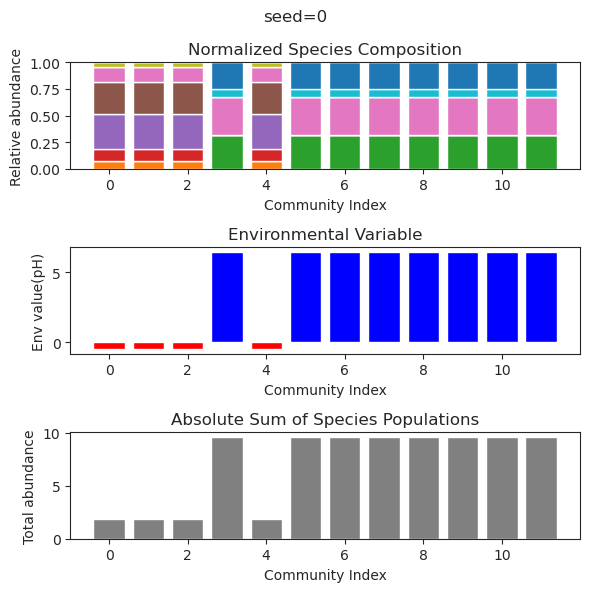

{'species': array([ 2.83582242e-02,  2.61962617e-01,  2.59840303e-43,  1.06313171e-23,
       -2.09942923e-44,  4.54292917e-44, -2.60644049e-62,  6.31974083e-69,
       -5.81530153e-57, -1.64862901e-33,  5.06251065e-01,  4.00125735e-01]), 'env': array([-1.4827603])}
{'species': array([ 2.83582242e-002,  2.61962617e-001, -1.11735058e-050,
        3.35502637e-019, -1.27168643e-097, -5.01447635e-048,
       -7.78929341e-105, -5.36094789e-111, -4.29708245e-102,
       -1.43353966e-028,  5.06251065e-001,  4.00125735e-001]), 'env': array([-1.4827603])}
{'species': array([ 2.83582242e-02,  2.61962617e-01,  1.09635787e-42,  3.72345502e-30,
       -6.47664284e-54,  4.36807947e-45, -1.87220067e-59, -1.60580222e-63,
       -1.65284560e-53, -4.25090612e-33,  5.06251065e-01,  4.00125735e-01]), 'env': array([-1.4827603])}
{'species': array([ 2.83582242e-02,  2.61962617e-01, -2.16060050e-35,  5.18072035e-21,
       -1.31398624e-50,  4.87675909e-34, -2.84608240e-53,  1.85568774e-58,
       -2.61629621

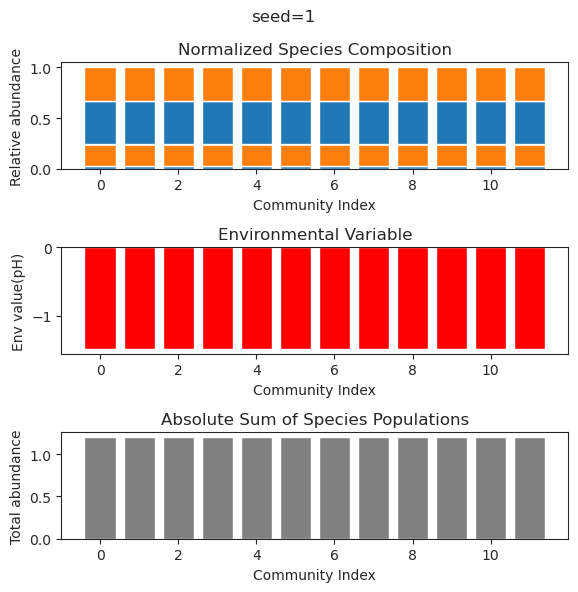

{'species': array([ 2.95356446e-01,  6.44316339e-15, -1.10285776e-48, -7.91260751e-64,
        5.11518568e-01,  2.89991302e-01, -8.92108775e-45,  2.48803744e-61,
       -1.02945497e-56,  2.56139616e-64, -3.73533267e-50,  5.86425475e-31]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-01,  3.16262506e-14,  1.00502180e-51, -2.71297783e-95,
        5.11518568e-01,  2.89991302e-01,  2.94062563e-52, -1.87476402e-83,
        3.46072038e-77, -6.67548101e-85, -7.38860504e-64, -1.03560550e-25]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-001,  8.49993768e-014,  1.13928745e-065,
        7.13900032e-115,  5.11518568e-001,  2.89991302e-001,
       -4.98715306e-055,  3.90582487e-104, -3.63988384e-094,
       -4.94748784e-108,  2.76438437e-069, -6.93447551e-024]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-001,  4.58034133e-014, -1.42961395e-082,
        7.38572441e-128,  5.11518568e-001,  2.89991302e-001,
        1.12927569e-067, -8.40776497e-126, 

{'species': array([ 2.95356446e-01,  4.76190090e-14, -1.52562354e-49, -1.91303216e-81,
        5.11518568e-01,  2.89991302e-01, -8.28669312e-57, -9.97672888e-79,
        2.28852033e-72,  1.04027870e-79, -1.39596001e-62,  1.77637976e-30]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-001, -2.60942004e-014,  6.59523113e-071,
        3.56007893e-124,  5.11518568e-001,  2.89991302e-001,
        6.69321719e-056, -1.20443175e-114, -1.39667200e-105,
        4.73545084e-112,  8.33588764e-078,  2.23296087e-022]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-001,  5.24725641e-014, -2.61190457e-062,
       -1.88485123e-113,  5.11518568e-001,  2.89991302e-001,
        5.31883036e-047, -2.45547144e-097, -3.24598244e-091,
       -2.50717289e-100,  2.51692287e-065,  5.87536645e-018]), 'env': array([-1.96911696])}
{'species': array([ 2.95356446e-01, -3.04569095e-14, -1.69197146e-48,  1.99987855e-89,
        5.11518568e-01,  2.89991302e-01, -4.65013118e-45,  7.00192396e-

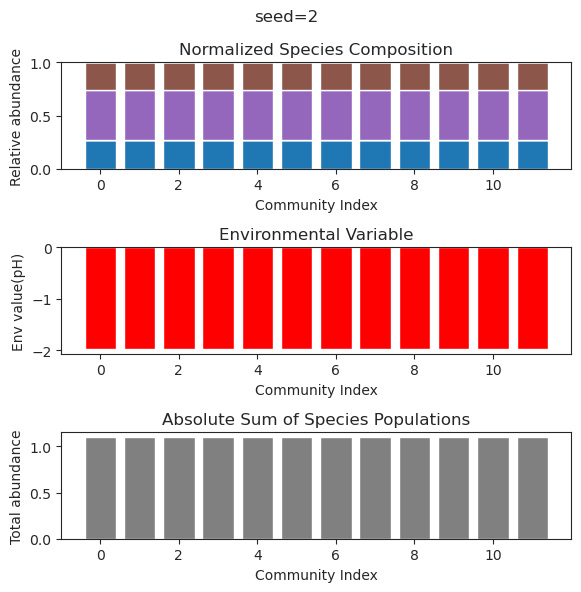

{'species': array([ 2.31564730e-01,  1.11013529e-01,  1.34580679e-35, -3.80093150e-34,
       -9.11852798e-24,  2.12578575e-50, -3.83374699e-67,  4.09074972e-01,
       -3.47179173e-28,  1.37694597e-69,  2.41956029e-53,  1.20624919e-01]), 'env': array([-2.74968968])}
{'species': array([ 2.31564730e-01,  1.11013529e-01,  1.71298473e-36, -4.04663799e-35,
        5.67229584e-24, -1.00404391e-51,  4.61211368e-65,  4.09074972e-01,
        6.22816064e-28, -1.78290664e-72,  1.78145642e-54,  1.20624919e-01]), 'env': array([-2.74968968])}
{'species': array([ 2.31564730e-01,  1.11013529e-01, -5.02872710e-34,  5.60481629e-36,
       -1.28772139e-23,  3.27644417e-67,  8.77630808e-87,  4.09074972e-01,
       -2.54502419e-27,  1.58012275e-86, -5.68332963e-59,  1.20624919e-01]), 'env': array([-2.74968968])}
{'species': array([ 2.31564730e-01,  1.11013529e-01, -4.03908950e-30,  2.39617930e-33,
        1.95922900e-21,  6.22673471e-52,  1.86521684e-67,  4.09074972e-01,
        1.39148903e-23, -1.4045780

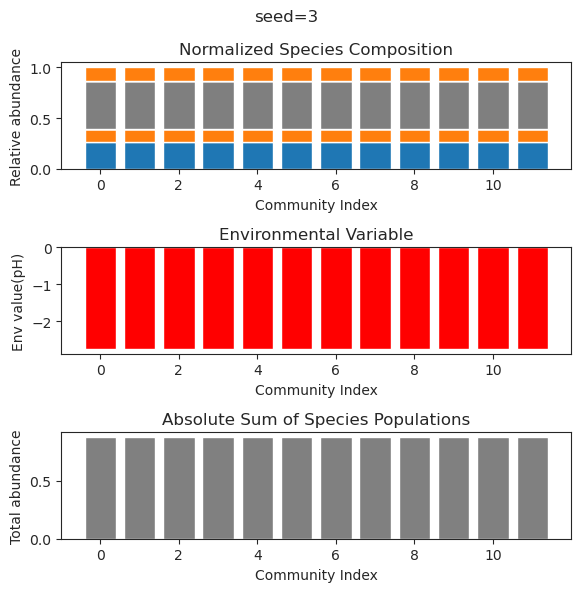

{'species': array([ 3.59996746e-01, -1.28744864e-25,  1.80655689e-61,  2.01260760e-45,
        9.82188846e-44, -7.28694287e-66, -1.11155021e-28,  3.09639609e-01,
       -8.97609145e-19, -3.37580768e-44, -4.50569236e-19, -6.67070778e-26]), 'env': array([-3.1903706])}
{'species': array([ 3.59996746e-01, -1.73530545e-24, -8.91403453e-57,  1.22227349e-52,
       -1.71797410e-51, -7.31212772e-62,  1.33993997e-46,  3.09639609e-01,
        1.57815210e-20,  4.54344891e-41,  4.09767231e-22, -2.68278202e-26]), 'env': array([-3.1903706])}
{'species': array([ 3.59996746e-01,  2.27735492e-24,  4.12562923e-60, -1.44705978e-49,
       -2.91390987e-45,  2.34565780e-61,  2.03893073e-28,  3.09639609e-01,
        5.07124679e-19, -4.58625324e-40,  5.65240620e-20,  1.15933057e-26]), 'env': array([-3.1903706])}
{'species': array([ 3.59996746e-001, -3.01084118e-024,  8.97664539e-085,
        5.68553151e-066, -5.33366664e-054,  1.41435942e-100,
       -1.94236295e-030,  3.09639609e-001,  2.05187413e-020,
    

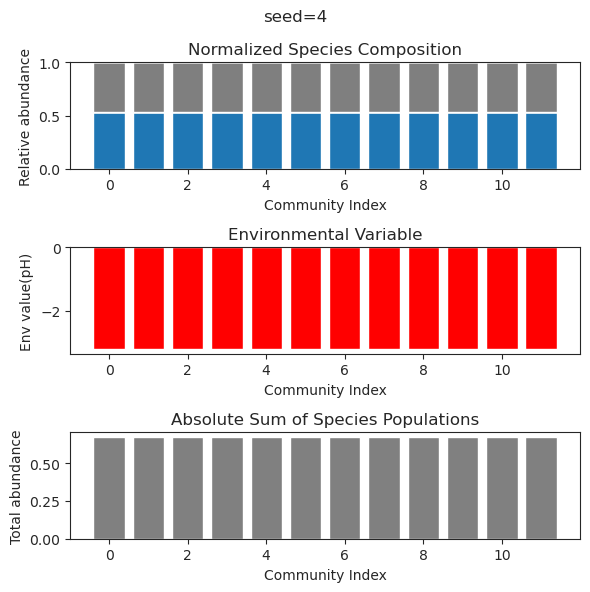

{'species': array([ 5.50135759e-02,  2.84658806e-01, -4.96487547e-59,  1.53587896e-20,
        8.16466786e-02,  4.22954565e-64, -2.19431651e-60, -1.08759025e-46,
       -1.29275988e-54, -3.47154188e-69,  8.28168846e-72,  1.16450690e-05]), 'env': array([-3.28619647])}
{'species': array([ 2.14718481e-14,  3.28270117e-01, -4.04413933e-69, -1.69906063e-30,
        1.02693922e-01, -2.47660976e-72,  2.74140922e-63, -3.19345964e-55,
        6.86402563e-59, -7.95778291e-82, -4.86150509e-84,  1.05650322e-01]), 'env': array([-3.01199394])}
{'species': array([ 3.95144908e-015,  3.28270117e-001,  1.32135140e-091,
       -5.99180978e-020,  1.02693922e-001, -4.28940356e-091,
       -1.39196664e-079, -2.54780684e-059, -3.43034586e-066,
        5.79242319e-109, -7.11403730e-114,  1.05650322e-001]), 'env': array([-3.01199394])}
{'species': array([-3.03046397e-15,  3.28270117e-01,  1.71020815e-67, -2.47612364e-27,
        1.02693922e-01, -8.33792347e-41,  3.47797557e-45,  1.23034557e-42,
       -1.03342

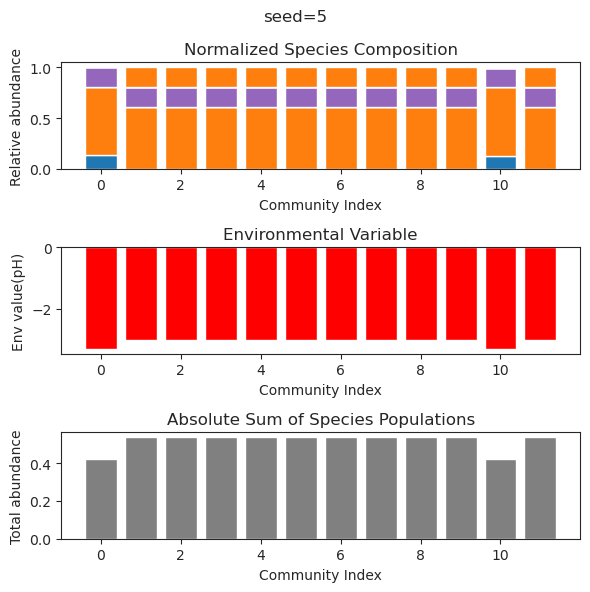

{'species': array([ 3.26441951e-01, -3.95465285e-42,  9.33951648e-67,  3.61515034e-01,
        1.85790125e-43,  2.50462320e-01,  2.92480959e-16,  3.73661795e-90,
       -4.04116912e-41,  4.46538568e-26, -9.36633327e-94, -1.64666990e-82]), 'env': array([-2.54722986])}
{'species': array([ 3.26441951e-01,  3.62577897e-38, -7.38555256e-53,  3.61515034e-01,
       -9.29446215e-36,  2.50462320e-01,  1.89691526e-17,  3.66020906e-62,
       -2.69809806e-37,  3.66338742e-22,  2.45508205e-61, -5.36320032e-55]), 'env': array([-2.54722986])}
{'species': array([ 2.42995557e-46,  4.60427247e-59, -1.18820769e-63, -3.85393178e-62,
        4.62589916e+00, -2.30972189e-64,  7.57710288e-30,  1.31404759e+00,
        3.20109327e-65,  3.67875964e+00,  2.46044052e+00,  2.32493541e-50]), 'env': array([9.12340262])}
{'species': array([ 3.26441951e-01, -7.69818536e-43,  8.98032847e-59,  3.61515034e-01,
        4.47400991e-40,  2.50462320e-01, -1.64958454e-16, -5.60735448e-56,
       -5.73520755e-38, -9.74316067

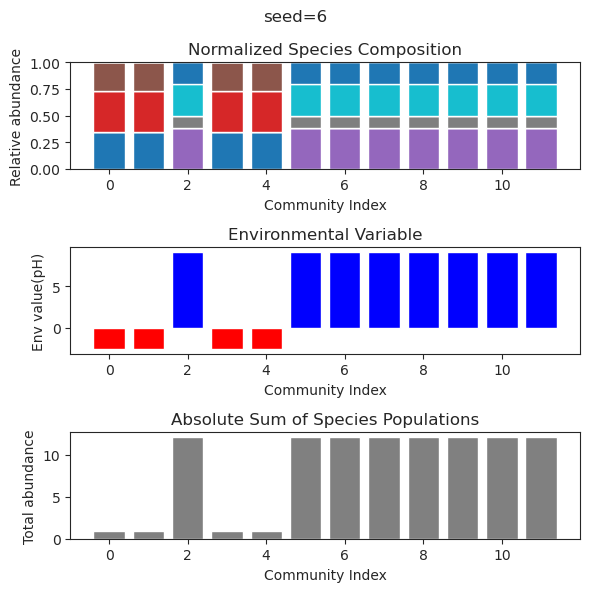

{'species': array([ 1.03054982e-45, -5.83923394e-49, -4.09429773e-57, -2.75483965e-50,
        4.62589916e+00, -7.72341062e-54,  6.82412750e-30,  1.31404759e+00,
       -1.06753762e-52,  3.67875964e+00,  2.46044052e+00,  1.19956697e-48]), 'env': array([9.12340262])}
{'species': array([-5.43021776e-63,  1.22685140e-61,  1.50243439e-48, -8.60531278e-69,
        3.85801574e+00,  1.38683559e-39,  3.72339287e+00, -1.68568886e-58,
        4.10418232e-54,  3.31494525e-40,  7.90160584e-56,  2.33952316e-40]), 'env': array([4.83445063])}
{'species': array([-1.14494756e-45, -4.98024730e-38,  3.68722363e-36,  6.39363598e-51,
        3.85801574e+00,  7.63235372e-33,  3.72339287e+00, -1.02848467e-30,
        1.41548460e-31, -1.37880717e-46,  1.96153411e-50,  2.07661414e-48]), 'env': array([4.83445063])}
{'species': array([-4.18428120e-55,  1.01665849e-39,  7.85488539e-47,  4.46096625e-62,
        3.85801574e+00,  2.11172750e-33,  3.72339287e+00,  1.41079716e-30,
       -1.13362914e-39, -1.27044797e-

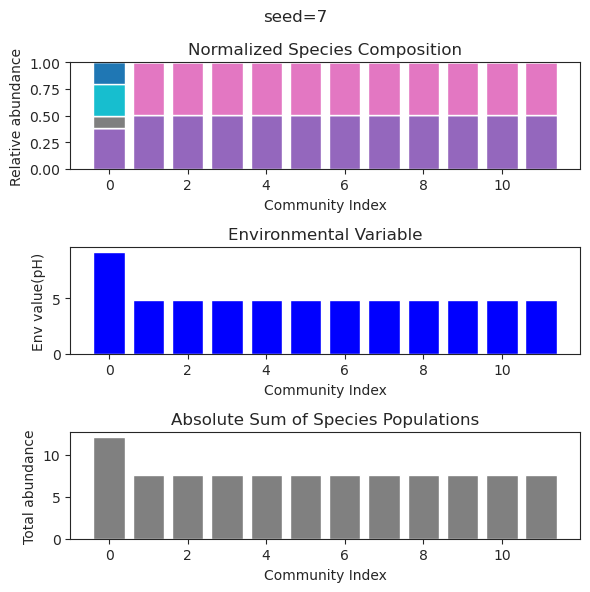

{'species': array([ 1.21254691e-001,  1.49169937e-001,  1.91167160e-050,
        1.82429822e-023,  2.91280256e-124,  1.24737437e-057,
        4.85256092e-001,  7.42514644e-130, -5.14272273e-064,
        1.41178341e-001, -1.99783077e-094,  3.10015471e-032]), 'env': array([-2.28920991])}
{'species': array([ 1.21254691e-001,  1.49169937e-001,  6.23684381e-053,
       -6.25763153e-022,  9.65442815e-131,  5.62355157e-057,
        4.85256092e-001,  3.52704070e-131,  9.43533826e-058,
        1.41178341e-001,  4.09131658e-104,  1.60658751e-033]), 'env': array([-2.28920991])}
{'species': array([-1.47771253e-45,  4.17822000e-50,  7.50902520e+00,  1.00855585e-32,
        6.60648467e-01,  7.02751918e-50, -2.47243456e-35,  5.66987698e-49,
        4.90409293e+00, -2.60613302e-42,  7.07904535e-48,  4.76626053e+00]), 'env': array([10.38356415])}
{'species': array([ 1.21254691e-001,  1.49169937e-001, -6.04133231e-047,
        4.88103698e-024, -8.03838118e-103,  8.19565001e-051,
        4.85256092e-001,

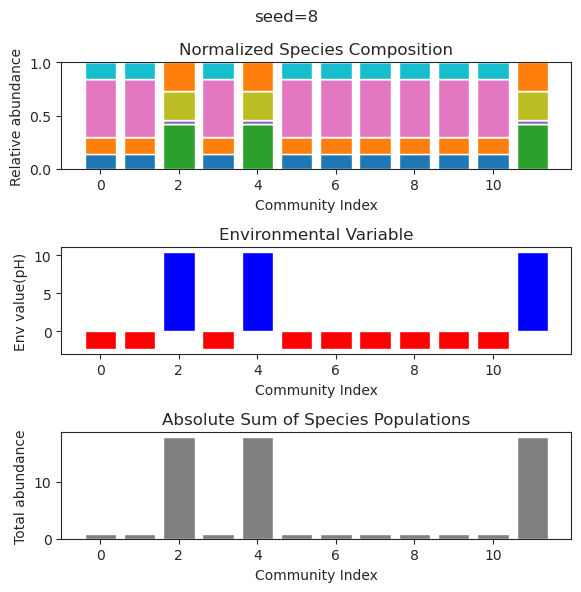

{'species': array([ 3.09770629e-01, -3.15821508e-31,  3.68179927e-51, -1.31756553e-55,
        1.99126123e-47,  4.44648637e-01,  5.56282934e-49, -3.84976892e-64,
       -2.82484238e-68,  1.35586566e-25, -2.52284102e-68,  1.24585394e-16]), 'env': array([-2.96523777])}
{'species': array([ 3.09770629e-01,  9.05539359e-27, -1.34958226e-69, -2.81692523e-76,
       -4.86053041e-52,  4.44648637e-01, -3.01210539e-61, -2.63334184e-88,
        1.60522334e-91, -1.85841995e-26,  5.54511323e-97, -1.13428832e-15]), 'env': array([-2.96523777])}
{'species': array([ 3.09770629e-01, -4.87461673e-31,  2.74001541e-42,  1.75113499e-45,
        1.77213611e-41,  4.44648637e-01, -2.78091532e-43, -1.61602259e-52,
       -1.22547424e-55, -5.40075291e-24,  3.25352129e-55,  7.71193117e-18]), 'env': array([-2.96523777])}
{'species': array([ 3.09770629e-01,  5.81223879e-33, -1.61315759e-54,  2.10478192e-58,
       -7.50996295e-53,  4.44648637e-01,  1.26587576e-56,  7.55007483e-70,
        6.96350072e-74,  1.3044885

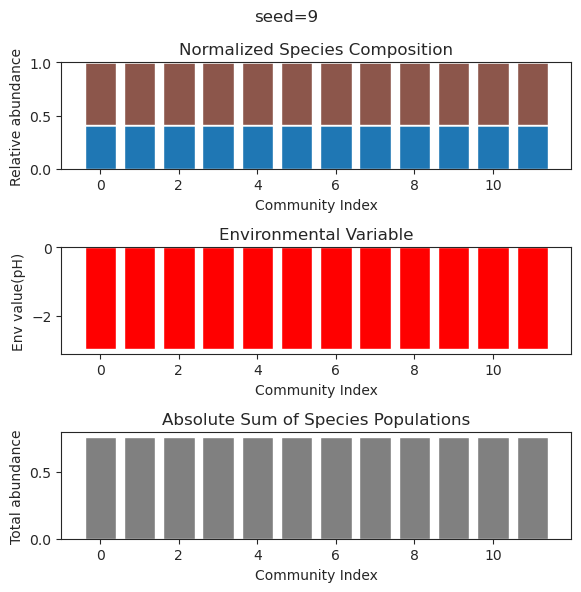

{'species': array([ 1.41222383e-001,  1.53000767e-001, -1.11351333e-110,
        6.90289960e-030, -3.71337553e-125, -2.10920458e-091,
       -1.46488172e-125,  5.88422561e-001,  8.81958517e-091,
        3.32155613e-001,  3.84168068e-037, -7.41748899e-127]), 'env': array([-1.89373279])}
{'species': array([1.41222383e-001, 1.53000767e-001, 3.99408051e-108, 1.55231633e-034,
       1.98918117e-121, 1.03384234e-093, 5.91082573e-132, 5.88422561e-001,
       3.72606561e-093, 3.32155613e-001, 1.68686006e-039, 5.26420145e-124]), 'env': array([-1.89373279])}
{'species': array([-3.52345021e-41, -3.32956659e-68, -1.33693030e-27,  5.53090835e-42,
        2.51360198e+00,  3.55763305e+00, -4.61453236e-76,  5.11780524e-70,
       -8.94564977e-58,  4.68332391e-47,  1.92782184e-50,  2.47123268e-50]), 'env': array([3.40098031])}
{'species': array([ 3.44168045e-41, -4.91711806e-78, -9.84783165e-27,  1.30486526e-43,
        2.51360198e+00,  3.55763305e+00, -1.37702283e-93, -7.87555956e-84,
        1.590524

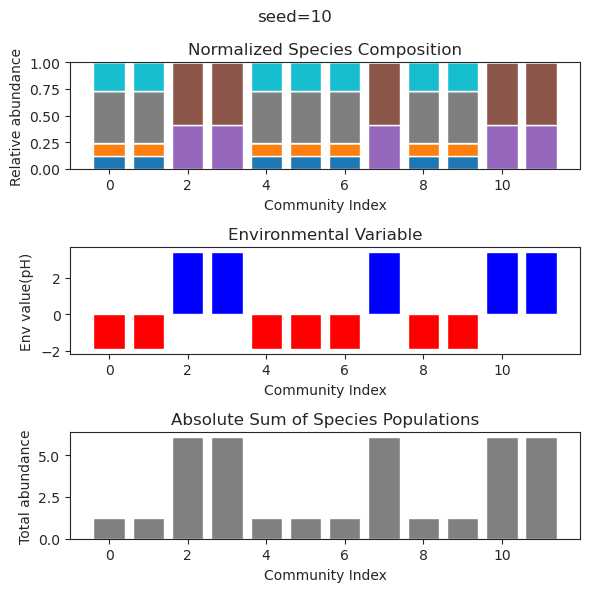

{'species': array([-3.22783301e-014,  2.13361367e-001, -7.45532026e-051,
        4.50075569e-001,  2.77644413e-124, -8.84820575e-022,
        5.76457085e-116, -1.46632316e-023,  2.14866699e-043,
       -1.89200818e-021,  4.92944140e-001, -3.10512407e-086]), 'env': array([-1.66079959])}
{'species': array([ 5.30822535e-16,  2.13361367e-01,  8.09001820e-45,  4.50075569e-01,
        3.22820909e-63, -4.97320648e-26,  1.48855460e-61,  8.37887300e-24,
        3.25310969e-43, -3.90868327e-26,  4.92944140e-01, -1.23352750e-52]), 'env': array([-1.66079959])}
{'species': array([ 1.62740583e-16,  2.13361367e-01,  4.93945450e-39,  4.50075569e-01,
       -3.99241674e-60,  1.13785467e-24, -1.36158109e-60, -6.80328974e-22,
        4.32900691e-40, -1.01150055e-26,  4.92944140e-01, -1.80226527e-54]), 'env': array([-1.66079959])}
{'species': array([ 6.21212260e-20,  2.13361367e-01,  7.87933768e-45,  4.50075569e-01,
       -1.13389743e-67, -2.95773646e-29, -4.10338725e-74,  3.92465311e-31,
        7.71770

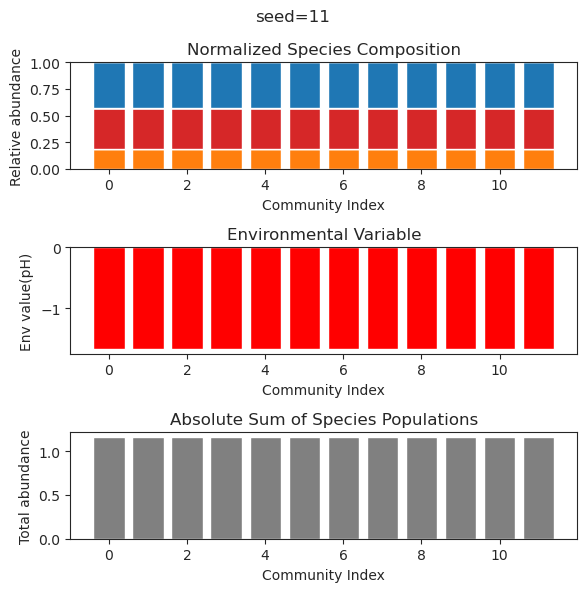

{'species': array([ 3.80359875e-02,  2.61730909e-01,  2.19795106e-33,  3.38359591e-01,
        1.52098320e-33, -9.69484368e-34,  1.91052135e-20,  1.23386222e-44,
        1.13244576e-33,  3.28841590e-79,  4.15033760e-01,  1.37919847e-58]), 'env': array([-2.34937971])}
{'species': array([ 3.80359875e-02,  2.61730909e-01,  1.54678452e-35,  3.38359591e-01,
        1.56704324e-49,  7.49578882e-52, -3.53308889e-24,  5.36687076e-46,
       -1.03106373e-75, -7.72723823e-70,  4.15033760e-01, -3.83208862e-64]), 'env': array([-2.34937971])}
{'species': array([ 3.80359875e-02,  2.61730909e-01,  1.73965309e-95,  3.38359591e-01,
       -2.21430549e-56, -3.77512819e-54, -4.15938493e-21,  6.66713001e-51,
       -1.20873059e-79,  6.68298516e-83,  4.15033760e-01,  3.06587148e-65]), 'env': array([-2.34937971])}
{'species': array([ 3.80359875e-02,  2.61730909e-01, -3.45359070e-76,  3.38359591e-01,
        4.11324842e-55, -2.82548263e-47,  3.18063447e-22,  2.37351928e-35,
        3.80201960e-60, -1.7005378

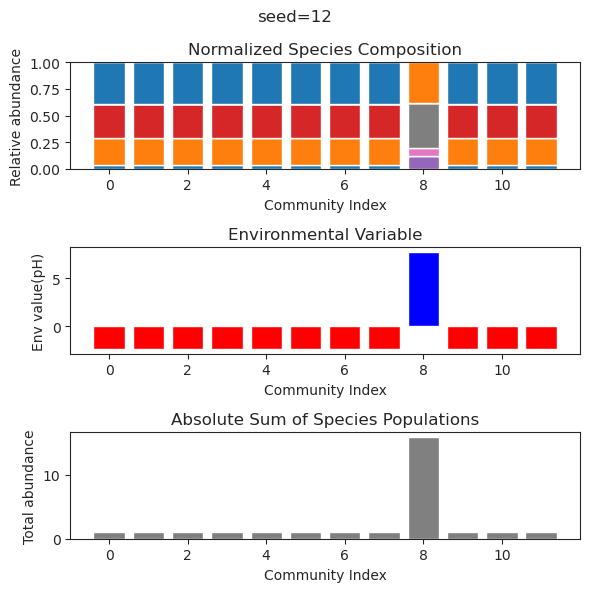

{'species': array([-1.94358067e-39,  2.92789530e-01,  6.20107237e-41, -1.23138677e-53,
        6.07060103e-01, -1.13402795e-28,  3.24236892e-01,  6.18488987e-41,
        4.01961407e-37,  3.98025847e-01, -3.94960509e-22,  5.59830236e-42]), 'env': array([-2.30925866])}
{'species': array([ 7.18326671e-49,  2.92789530e-01,  8.89276902e-46, -3.35967944e-56,
        6.07060103e-01,  9.06247250e-30,  3.24236892e-01, -1.45799897e-46,
        2.16347492e-38,  3.98025847e-01, -2.89436303e-22, -8.97312441e-48]), 'env': array([-2.30925866])}
{'species': array([ 2.34678973e-66,  7.92353149e-55,  9.96178788e+00,  3.33172053e-50,
       -3.71883938e-74,  3.66368740e-01,  3.58678727e-55,  3.92717855e+00,
       -1.13849460e-60,  1.31836410e-68, -9.37573687e-64,  2.42165379e-41]), 'env': array([10.5886108])}
{'species': array([-6.24370237e-66, -2.12030443e-62,  9.96178788e+00,  5.37705907e-51,
        2.39012825e-74,  3.66368740e-01, -1.10275724e-67,  3.92717855e+00,
        5.28335604e-63,  1.92187161

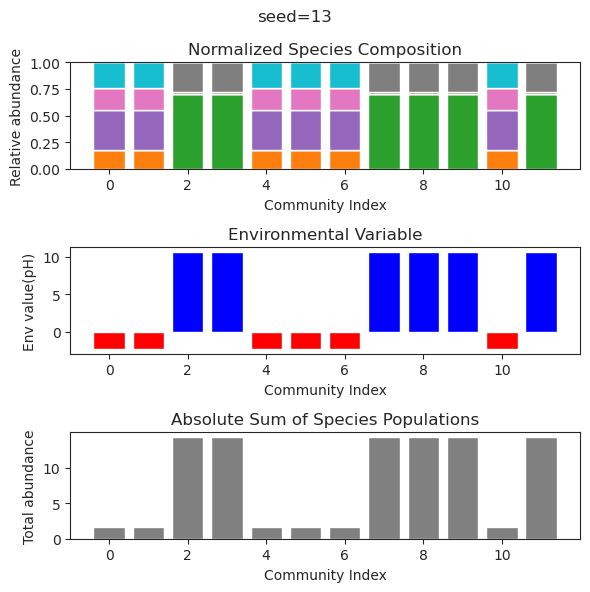

{'species': array([ 1.17795006e-001,  2.39454243e-001, -1.39436296e-109,
       -9.86674318e-084, -1.15938196e-023,  1.75782839e-107,
       -5.50471376e-081, -6.50738007e-107, -1.03393421e-014,
       -6.93980707e-044,  1.60294576e-083,  2.29006592e-061]), 'env': array([-3.48533671])}
{'species': array([ 1.17795006e-01,  2.39454243e-01,  2.65329686e-82, -1.87855542e-75,
       -9.64386844e-27, -4.06364763e-87, -1.81570516e-69, -4.60627996e-87,
        1.68352250e-15,  1.03726039e-53,  4.08677009e-66, -1.48757069e-58]), 'env': array([-3.48533671])}
{'species': array([-1.50046923e-59, -4.97486985e-41,  3.17341322e+00, -7.83715480e-33,
        6.58185571e+00,  4.41326795e+00, -9.94682466e-21,  4.43277057e-01,
        7.67953254e-67,  3.01734453e-78,  8.29639624e-50,  4.20660181e-69]), 'env': array([9.27827516])}
{'species': array([ 1.17795006e-001,  2.39454243e-001, -2.36211145e-131,
        2.80750768e-102,  1.78946278e-032, -1.06995420e-125,
       -5.78587386e-095,  1.07373511e-124,  

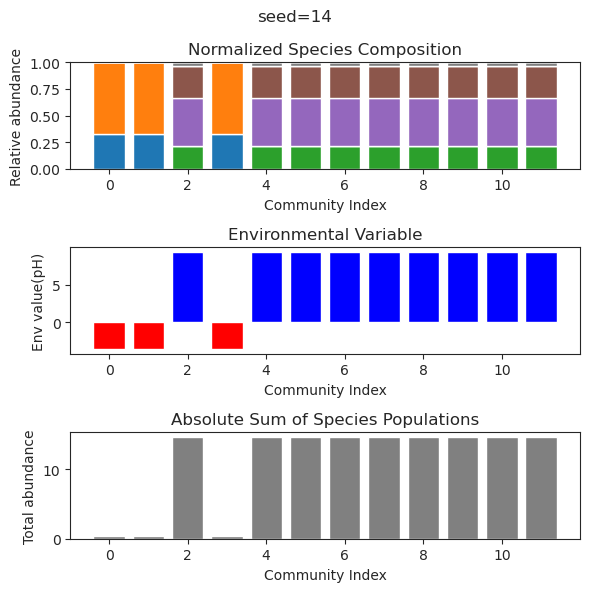

{'species': array([ 2.09173268e-01,  9.94113022e-02, -6.06733906e-22,  4.29909940e-01,
       -9.90103186e-26, -5.08848173e-31,  7.18632674e-60,  4.08757997e-81,
        2.41166174e-49,  3.44365360e-01, -7.84538554e-51, -3.55590685e-32]), 'env': array([-2.6577846])}
{'species': array([ 2.09173268e-01,  9.94113022e-02,  9.44889917e-21,  4.29909940e-01,
        1.63890234e-22,  8.40087554e-27,  1.03980505e-50, -1.96289243e-67,
       -7.74796016e-41,  3.44365360e-01, -1.67367588e-43,  1.53342177e-27]), 'env': array([-2.6577846])}
{'species': array([ 2.09173268e-01,  9.94113022e-02, -6.01084140e-18,  4.29909940e-01,
        5.78212518e-25, -7.35801255e-28, -1.34477277e-54,  9.84575580e-62,
       -3.60919442e-47,  3.44365360e-01,  5.21503152e-46, -2.91295412e-28]), 'env': array([-2.6577846])}
{'species': array([ 2.09173268e-01,  9.94113022e-02,  2.54817292e-19,  4.29909940e-01,
       -2.09094828e-20, -5.29740494e-26, -3.87518507e-43,  3.62000186e-51,
        2.29493728e-34,  3.44365360e-

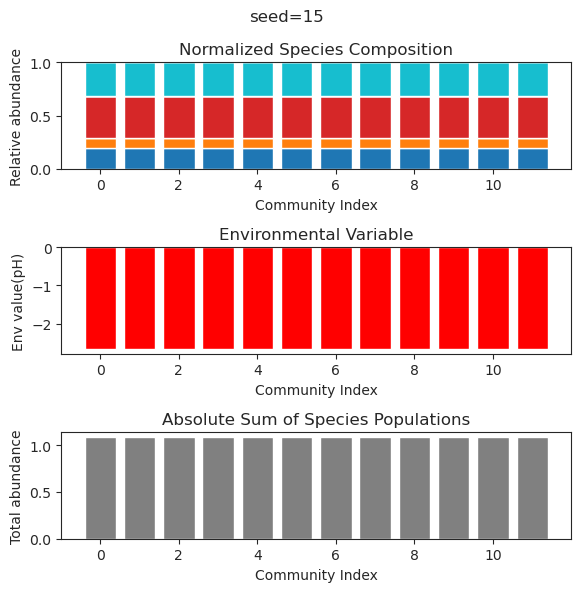

{'species': array([ 4.55639931e-20,  2.20278414e-01,  1.42813308e-01, -2.59601097e-30,
        5.90626446e-24, -7.00382405e-63,  2.75175945e-01,  5.45148604e-42,
        1.96502910e-64, -3.18556698e-45,  7.65296333e-01,  2.20757856e-52]), 'env': array([-1.25649429])}
{'species': array([-6.96413320e-19,  2.20278414e-01,  1.42813308e-01,  5.01340151e-29,
        9.68223116e-25, -3.61613637e-63,  2.75175945e-01, -1.08529814e-36,
        3.71797652e-64,  5.78242794e-42,  7.65296333e-01,  1.24210099e-54]), 'env': array([-1.25649429])}
{'species': array([ 2.75261116e-18,  2.20278414e-01,  1.42813308e-01,  3.48807943e-26,
        6.61359655e-31, -2.40522716e-71,  2.75175945e-01,  3.21856468e-49,
       -1.30560004e-81, -2.84744429e-48,  7.65296333e-01, -1.31873251e-61]), 'env': array([-1.25649429])}
{'species': array([ 1.29126785e-20,  2.20278414e-01,  1.42813308e-01,  1.15836934e-27,
        3.53796579e-29,  1.60667646e-54,  2.75175945e-01,  1.27275482e-35,
       -1.94064786e-57, -1.2049048

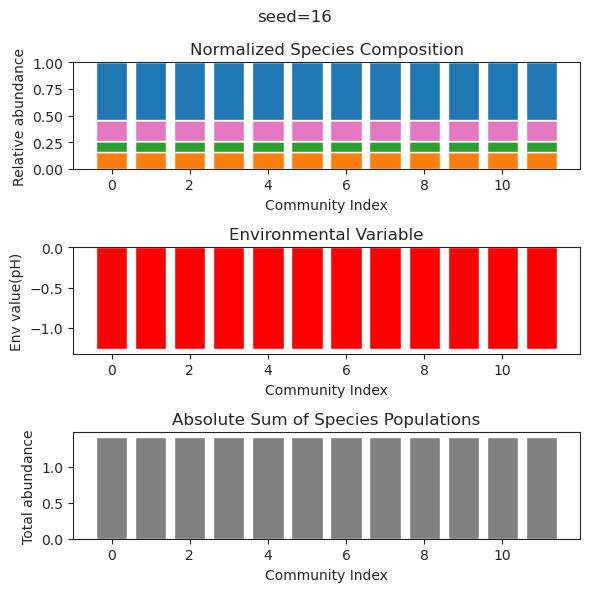

{'species': array([ 2.93120586e-01, -2.45464359e-28,  2.72609043e-26,  3.18671510e-01,
        3.14413549e-01,  1.14755108e-41, -1.99438371e-90, -7.41865581e-26,
        2.10985137e-60,  1.91185364e-93,  2.96283270e-28, -3.72414994e-16]), 'env': array([-2.18901307])}
{'species': array([ 2.93120586e-01, -2.37112700e-20,  6.78716292e-18,  3.18671510e-01,
        3.14413549e-01, -3.74788295e-32, -5.29144887e-58, -9.86726863e-27,
       -1.13014287e-41, -2.58806758e-61, -3.17975388e-24,  3.18842163e-15]), 'env': array([-2.18901307])}
{'species': array([ 2.93120586e-001,  8.07415028e-026,  1.69428227e-020,
        3.18671510e-001,  3.14413549e-001,  4.97718797e-041,
        5.28322872e-098, -9.38562307e-029, -1.48351171e-067,
       -1.21766208e-102,  1.43695583e-027,  7.99664786e-017]), 'env': array([-2.18901307])}
{'species': array([ 2.93120586e-01,  1.12419175e-20, -4.00122558e-17,  3.18671510e-01,
        3.14413549e-01,  3.88814714e-34, -1.03939919e-78,  1.71405565e-23,
       -4.96910

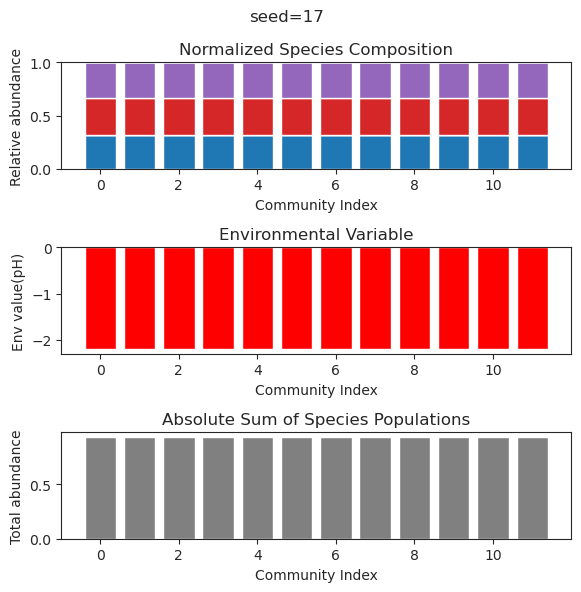

{'species': array([ 2.34713331e-01,  1.25212324e-01, -2.31576447e-59, -5.04036755e-44,
       -4.05083721e-31,  1.08301121e-58, -5.65548035e-49, -2.57848392e-45,
       -1.89251623e-37,  3.72897252e-28, -1.28987401e-62, -1.80343460e-36]), 'env': array([-3.50998838])}
{'species': array([ 2.34713331e-01,  1.25212324e-01, -6.17540166e-86, -3.00479110e-55,
        1.27018326e-26, -1.85626182e-86, -4.22916883e-54,  5.79315704e-60,
        2.27619711e-33,  1.95148813e-28,  1.12299074e-92, -7.30930789e-41]), 'env': array([-3.50998838])}
{'species': array([-1.26657146e-54,  4.74517125e-55,  5.98445799e-52,  6.43482168e+00,
        3.29852578e-61,  3.68161792e-66,  1.04706449e-58,  4.03346988e+00,
       -5.05893905e-55,  4.15406878e+00,  9.49978164e-56,  1.17298260e-57]), 'env': array([8.09462122])}
{'species': array([ 2.34713331e-01,  1.25212324e-01, -1.78538506e-66,  1.88350941e-42,
       -4.20081069e-28, -4.28192097e-60,  6.84657668e-43,  1.49647798e-46,
        4.42350737e-31,  1.84092574

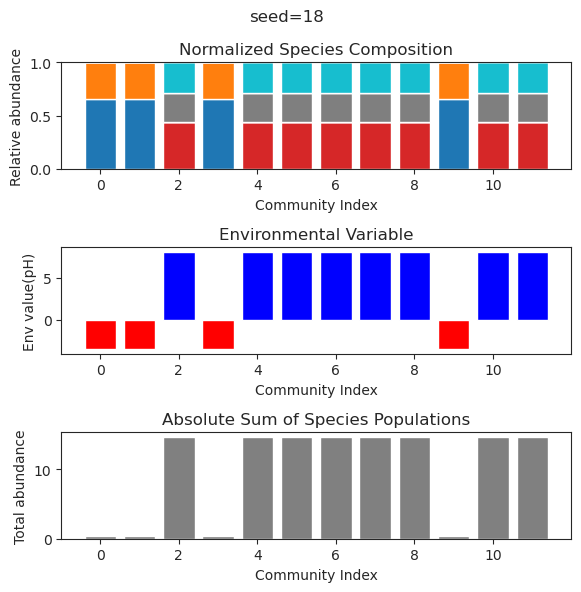

{'species': array([ 8.80930141e-002,  6.53954756e-002, -6.38129749e-193,
        5.43528894e-001, -1.90194066e-020, -1.24735970e-182,
        5.74814426e-001,  8.89666632e-084,  2.04524657e-001,
       -1.64851497e-206,  2.07408499e-001,  2.78225452e-077]), 'env': array([-0.77502372])}
{'species': array([ 8.80930141e-002,  6.53954756e-002, -8.17075593e-143,
        5.43528894e-001,  4.96828316e-023, -1.17451091e-133,
        5.74814426e-001, -4.25067999e-064,  2.04524657e-001,
        6.62126424e-151,  2.07408499e-001, -4.83359904e-058]), 'env': array([-0.77502372])}
{'species': array([ 8.80930141e-002,  6.53954756e-002, -2.18714851e-152,
        5.43528894e-001,  2.20071054e-069,  3.24104994e-216,
        5.74814426e-001,  3.23425437e-099,  2.04524657e-001,
        2.90266147e-206,  2.07408499e-001, -2.73759107e-089]), 'env': array([-0.77502372])}
{'species': array([ 4.88467226e-57, -1.30431640e-51,  4.49144619e+00, -7.14285805e-66,
        8.31125927e+00,  1.74509085e-64,  3.28171761

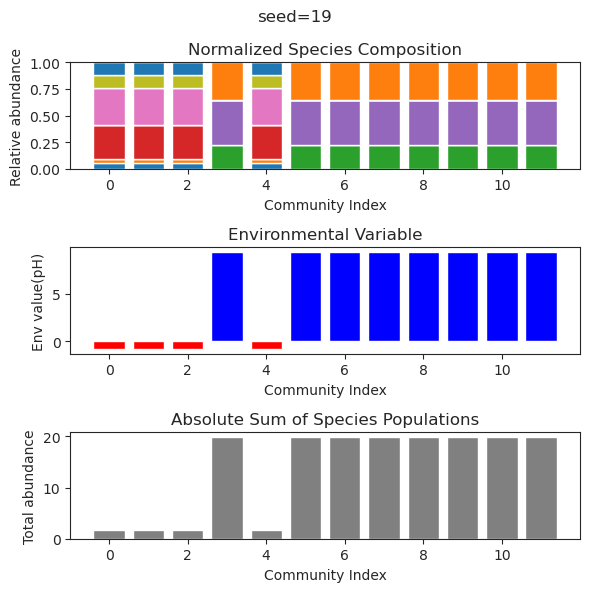

{'species': array([ 1.11053653e-001,  2.35596052e-001,  3.89095549e-046,
       -3.90329057e-025,  1.29119372e-024,  4.62642445e-096,
        1.93905211e-087, -1.86682563e-107, -5.12302112e-090,
       -5.01688274e-075,  1.52004581e-082, -2.15686428e-024]), 'env': array([-3.38724268])}
{'species': array([ 1.11053653e-001,  2.35596052e-001, -9.50306759e-047,
        6.34669026e-031, -5.93729959e-022,  1.17824420e-093,
        1.47945954e-089,  1.22578448e-107, -7.29650474e-093,
       -1.73495164e-078,  2.42760554e-074,  6.24277822e-020]), 'env': array([-3.38724268])}
{'species': array([ 1.11053653e-001,  2.35596052e-001, -9.50306759e-047,
        6.34669026e-031, -5.93729959e-022,  1.17824420e-093,
        1.47945954e-089,  1.22578448e-107, -7.29650474e-093,
       -1.73495164e-078,  2.42760554e-074,  6.24277822e-020]), 'env': array([-3.38724268])}
{'species': array([ 1.11053653e-01,  2.35596052e-01,  8.29588900e-46,  3.84064588e-29,
       -5.20480518e-28, -3.83342867e-66,  7.05273436

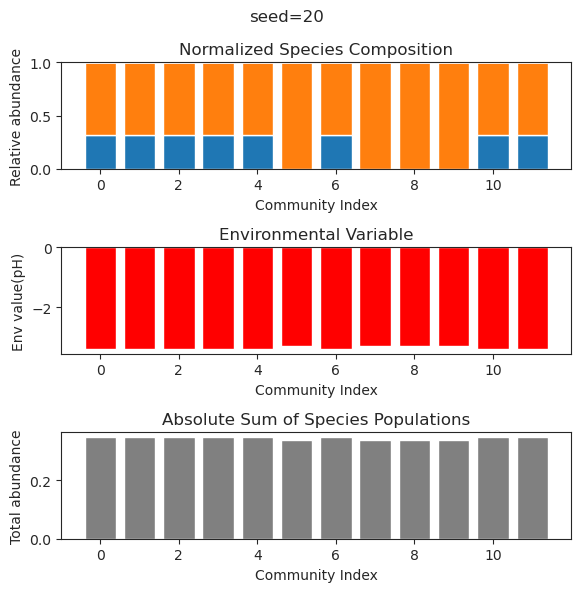

{'species': array([ 8.11354553e-03,  2.83257129e-01,  2.89805849e-28, -6.93690660e-76,
        2.30516670e-41,  2.61795907e-31,  2.97418924e-71,  7.43144319e-01,
        1.34146547e-01,  1.03038079e-20, -8.21300571e-76,  1.13872740e-74]), 'env': array([-1.87640218])}
{'species': array([ 8.11354553e-003,  2.83257129e-001, -2.79879528e-021,
        2.15401989e-067, -5.31198853e-112, -4.69938309e-032,
        4.31045576e-062,  7.43144319e-001,  1.34146547e-001,
       -6.67340673e-017,  1.86290737e-077,  6.35567816e-070]), 'env': array([-1.87640218])}
{'species': array([-2.94368619e-44,  4.45829999e-45,  3.19254447e+00, -8.46662798e-57,
        1.54327777e+00, -3.37962443e-45,  4.22702362e+00, -3.81336183e-56,
       -6.36419112e-44, -9.07875122e-55, -7.28861695e-57,  3.83821002e+00]), 'env': array([7.09650739])}
{'species': array([ 8.11354553e-03,  2.83257129e-01, -3.73438473e-23, -2.99667876e-47,
        1.53821313e-37,  1.95375835e-29,  5.92211122e-43,  7.43144319e-01,
        1.341465

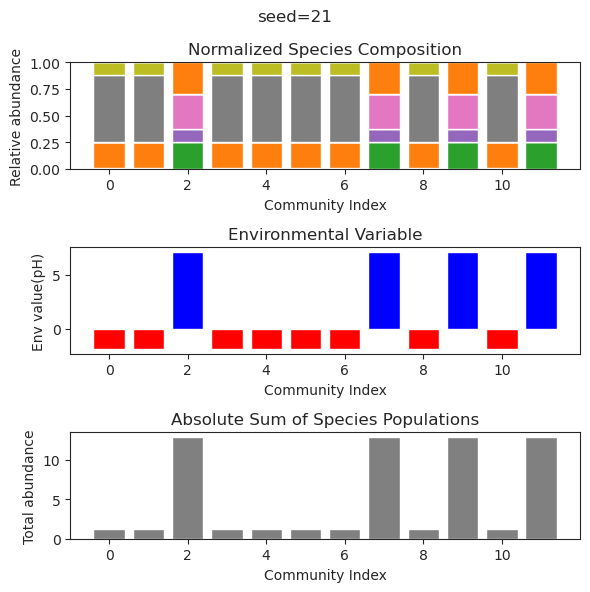

{'species': array([1.65356004e-001, 7.19253387e-019, 1.18727738e-124, 4.68367924e-002,
       1.08350353e-221, 3.84088237e-144, 2.36557386e-001, 0.00000000e+000,
       5.79117321e-108, 3.68100298e-001, 4.95744541e-002, 4.72975534e-001]), 'env': array([-0.9252861])}
{'species': array([1.09217479e-001, 9.10925474e-021, 6.68747193e-131, 2.39435341e-001,
       4.32232250e-230, 8.79785754e-146, 4.20906915e-001, 0.00000000e+000,
       7.53272412e-116, 2.55092041e-001, 1.00259546e-001, 4.94233572e-001]), 'env': array([-0.39830862])}
{'species': array([-7.44822602e-77, -2.28272807e-64,  5.22341766e-01,  2.47092265e+00,
        1.47467931e+00,  4.57018486e-50, -2.52350151e-63,  2.02269821e+00,
        2.01868908e+00, -7.12152089e-67, -5.80454508e-69,  1.65237660e-72]), 'env': array([5.10281919])}
{'species': array([1.91828697e-001, 1.11811053e-019, 1.41732431e-127, 1.01711968e-001,
       9.51817833e-226, 3.21761333e-143, 2.79801267e-001, 0.00000000e+000,
       1.50287367e-112, 2.94376701e-

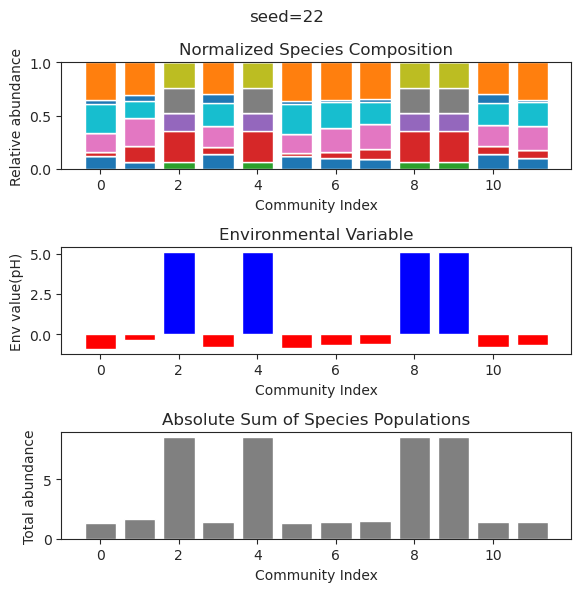

{'species': array([ 2.63986290e-17,  2.47146029e-01,  4.34243167e-01,  1.04475123e-01,
       -6.88707850e-51,  1.39511083e-61,  5.10215054e-01, -1.97048839e-40,
       -1.48193311e-63,  2.31816938e-27,  2.15044767e-29,  1.36201177e-01]), 'env': array([-1.22077857])}
{'species': array([ 1.12630471e-17,  2.47146029e-01,  4.34243167e-01,  1.04475123e-01,
       -2.11869276e-60, -6.78414809e-60,  5.10215054e-01, -7.81841957e-47,
       -1.84634669e-60, -1.77944945e-25, -3.21548947e-32,  1.36201177e-01]), 'env': array([-1.22077857])}
{'species': array([ 1.12126364e-67,  2.44085785e-72,  1.42107356e-71, -3.94239239e-35,
       -4.15012097e-30,  7.80287070e-49, -7.32634853e-48,  4.49724945e+00,
        3.67631868e+00,  2.58168233e+00,  6.37733163e-73,  3.87638469e-64]), 'env': array([7.02957947])}
{'species': array([ 9.16738479e-71, -5.24938303e-81,  2.24891430e-81, -8.25028166e-47,
       -2.17914233e-43,  7.76229028e-58, -1.35152825e-50,  4.49724945e+00,
        3.67631868e+00,  2.58168233

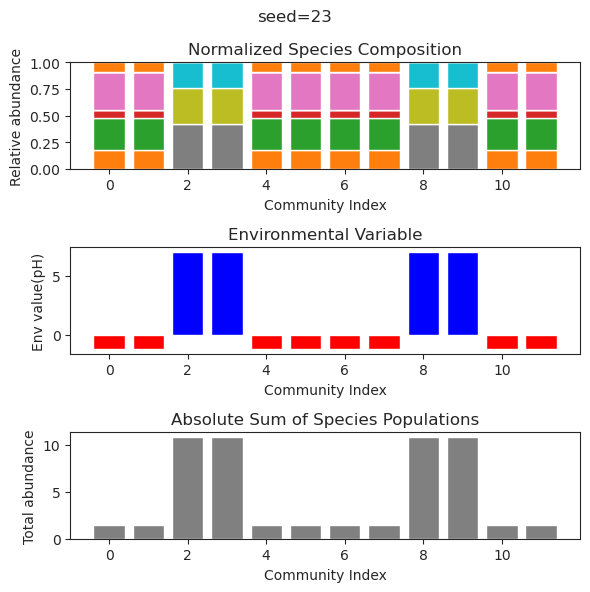

{'species': array([ 8.17206811e-002,  2.36310416e-001,  1.37911983e-001,
        3.06687378e-100,  5.46685690e-106, -6.60715312e-068,
        1.27885287e-137, -8.85527564e-118,  2.40030651e-002,
        1.75755151e-091, -2.08853580e-139, -2.46960459e-109]), 'env': array([-3.05903082])}
{'species': array([ 8.17206859e-002,  2.36310413e-001,  1.37911980e-001,
        3.31746151e-081, -7.42785165e-087, -7.79010630e-052,
        2.41216435e-112,  7.81498237e-097,  2.40030622e-002,
       -1.16713610e-072,  1.30543470e-112,  5.22725260e-094]), 'env': array([-3.05903083])}
{'species': array([-1.70057965e-38,  7.45449513e-45,  2.57057410e-56,  4.86731508e-01,
        1.67354917e-01,  8.30069710e-01,  5.05365929e-46,  8.46097000e-01,
        2.34379047e-57,  5.81218106e-01, -5.99779873e-17, -8.22991587e-70]), 'env': array([0.6842991])}
{'species': array([ 8.17206727e-002,  2.36310424e-001,  1.37911989e-001,
       -3.69454867e-105,  4.48081356e-116, -2.83280803e-059,
        4.68680464e-178, -

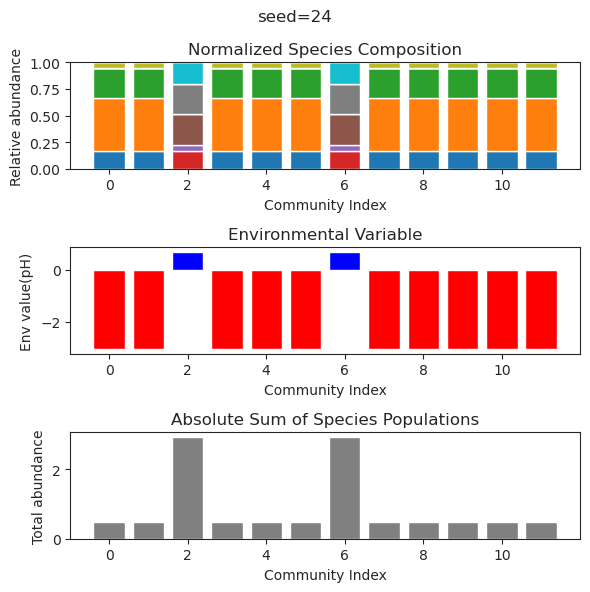

{'species': array([ 1.29380293e-01,  2.59866000e-01,  5.07169604e-01,  2.52026771e-54,
        6.63664465e-52,  3.82529953e-02, -1.61613196e-86, -1.00821240e-60,
        7.06279185e-41, -3.81631435e-76,  4.51816737e-62, -1.70292015e-24]), 'env': array([-2.86698565])}
{'species': array([ 1.29380293e-01,  2.59866000e-01,  5.07169604e-01,  8.71471689e-46,
       -4.39549854e-48,  3.82529953e-02, -2.86259394e-95,  1.59438017e-68,
       -3.27340031e-39, -1.00838246e-92,  1.04086109e-60,  3.56888077e-24]), 'env': array([-2.86698565])}
{'species': array([ 1.29380293e-01,  2.59866000e-01,  5.07169604e-01, -1.53152739e-38,
       -1.28265961e-37,  3.82529953e-02, -1.29014688e-55, -7.71145604e-42,
       -1.62186907e-36,  9.22898086e-50,  5.69276789e-43, -6.60304255e-21]), 'env': array([-2.86698565])}
{'species': array([ 1.29380293e-01,  2.59866000e-01,  5.07169604e-01, -3.10627035e-59,
        1.42666815e-43,  3.82529953e-02, -7.07262473e-88,  3.80366656e-45,
       -5.20225983e-43,  4.6714107

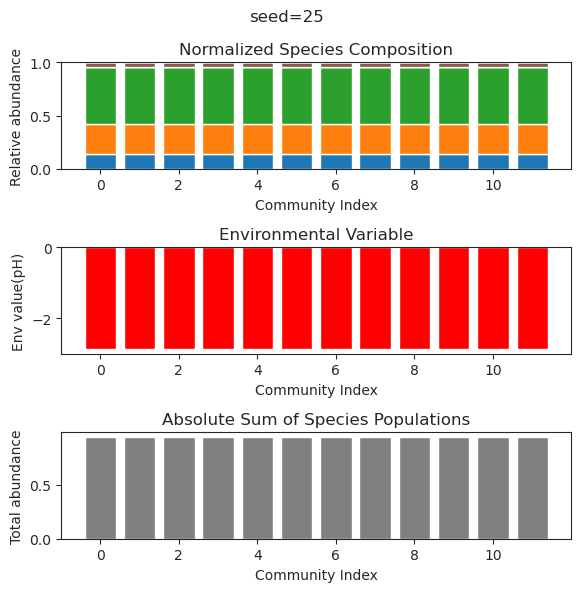

{'species': array([ 1.69545541e-11,  3.55239841e-01, -8.52932686e-31, -6.52238254e-30,
        3.44598539e-76,  1.77113250e-36,  1.22000312e-70,  2.84279816e-27,
       -3.05633911e-15, -8.89968108e-70, -5.34298860e-43,  4.56972062e-01]), 'env': array([-2.8993907])}
{'species': array([ 8.96895531e-12,  3.55239841e-01,  3.14671013e-48,  2.85223752e-29,
       -1.78179738e-38, -3.40659811e-39,  3.06961413e-53, -3.63836615e-26,
        2.98016318e-22,  1.35483208e-49,  3.80872594e-48,  4.56972062e-01]), 'env': array([-2.8993907])}
{'species': array([ 1.92336176e-61, -2.13972832e-60,  1.66484184e-46,  8.65539211e+00,
       -5.04224645e-46, -3.39343598e-61,  3.07615087e+00,  5.68664521e+00,
        1.57108361e-28, -1.68552393e-63,  1.01405703e-51,  4.50990972e-29]), 'env': array([10.36209192])}
{'species': array([-6.19070915e-62, -5.00444343e-49,  4.47267626e-38,  8.65539211e+00,
        3.25200776e-44, -5.11547122e-52,  3.07615087e+00,  5.68664521e+00,
       -2.94509781e-36, -4.92030135e

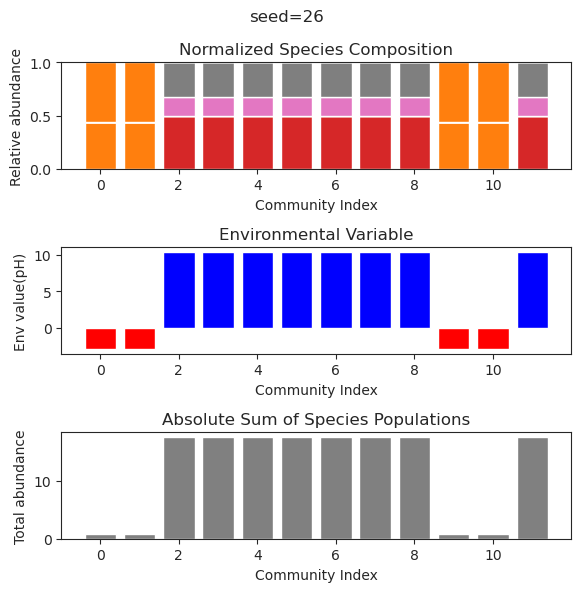

{'species': array([ 7.63132879e-039,  2.12745023e-001,  5.82776541e-017,
        9.37360811e-046,  1.58245659e-002,  4.71887955e-001,
        2.26083677e-043,  5.18389897e-001, -3.79949558e-105,
       -3.90575398e-082, -3.22204356e-070,  5.01825633e-043]), 'env': array([-1.59356605])}
{'species': array([-7.71217663e-36,  2.12745023e-01, -3.02365229e-13, -1.09376439e-36,
        1.58245646e-02,  4.71887957e-01, -8.06644655e-72,  5.18389897e-01,
        7.05995390e-78,  1.37482410e-65,  5.68515613e-52, -4.69052959e-35]), 'env': array([-1.59356605])}
{'species': array([-3.19672452e-38,  2.12745023e-01, -1.03440098e-20,  7.66260046e-50,
        1.58245654e-02,  4.71887956e-01,  2.24254425e-40,  5.18389897e-01,
        1.25688155e-98, -4.01384638e-83,  7.35930949e-72, -1.05775251e-43]), 'env': array([-1.59356605])}
{'species': array([ 3.97501122e-30,  2.12745019e-01, -1.34056404e-15, -4.78550571e-33,
        1.58245499e-02,  4.71887972e-01, -3.90211249e-53,  5.18389895e-01,
       -1.55058

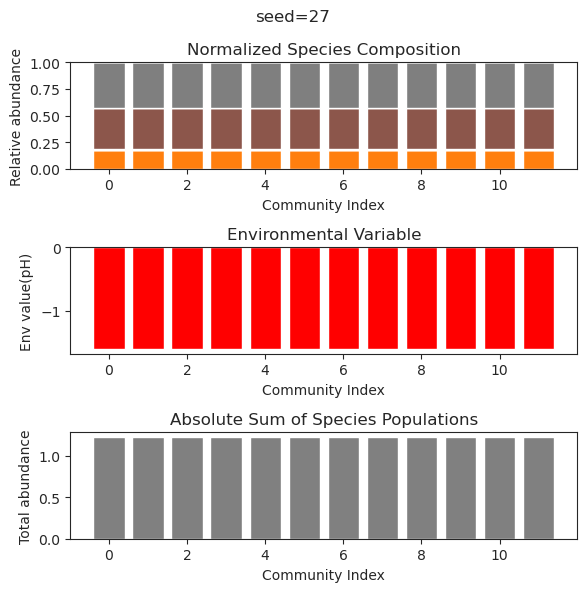

{'species': array([ 1.90858479e-001,  1.03462145e-002,  5.48006269e-001,
        5.10840404e-106, -2.03256920e-087, -2.10830184e-020,
        2.52511388e-001,  1.07027252e-101,  5.59489676e-001,
       -4.75004279e-088,  7.07758461e-070,  7.38892877e-029]), 'env': array([-0.77099601])}
{'species': array([ 1.90858479e-01,  1.03462145e-02,  5.48006269e-01, -1.01490644e-41,
       -1.42075626e-83,  1.33470629e-37,  2.52511388e-01, -1.82244129e-92,
        5.59489676e-01,  1.15311311e-85,  2.17720779e-75,  1.96701973e-31]), 'env': array([-0.77099601])}
{'species': array([ 1.90858479e-01,  1.03462145e-02,  5.48006269e-01, -1.92612176e-84,
        1.36522202e-76, -2.05730465e-25,  2.52511388e-01, -2.40456011e-82,
        5.59489676e-01,  2.94915465e-82, -5.79882989e-64,  5.71281088e-20]), 'env': array([-0.77099601])}
{'species': array([ 2.47264766e-112, -2.70194079e-062, -4.85313981e-089,
        4.69748511e+000,  2.58369064e+000,  4.00784838e-001,
        8.64222025e-001, -8.15618586e-106, 

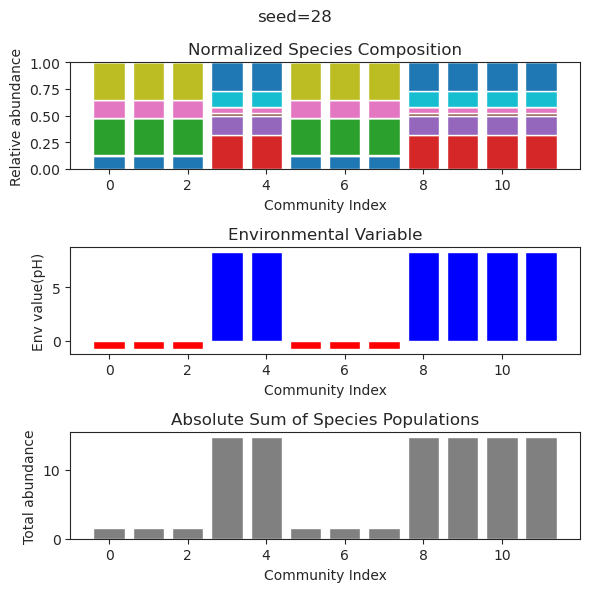

{'species': array([ 1.18033657e-001,  1.39310743e-001, -6.76573687e-135,
        7.39040244e-066, -1.89237752e-135,  1.21977187e-014,
        7.56132286e-001, -7.08721772e-066,  9.74968632e-002,
       -1.32967336e-086, -6.35205582e-127, -7.26831361e-113]), 'env': array([-1.08973009])}
{'species': array([ 1.18033657e-001,  1.39310743e-001,  1.35986141e-094,
       -1.08719476e-056,  2.98589585e-110, -1.68828367e-014,
        7.56132286e-001, -8.15645308e-056,  9.74968632e-002,
        1.48486679e-067,  5.41514829e-104,  2.12050525e-094]), 'env': array([-1.08973009])}
{'species': array([ 5.03610847e-53, -1.61752647e-27,  5.47097806e+00,  5.24745612e-74,
       -6.88975840e-63, -6.77057415e-69,  2.02545873e-68, -6.67392938e-40,
        2.09472069e-55,  3.42785715e-21,  6.15962027e+00,  5.95982629e+00]), 'env': array([9.31171914])}
{'species': array([ 2.97650472e-52,  7.24072780e-29,  5.47097806e+00,  7.35988467e-70,
       -6.88272283e-60,  5.06582157e-65,  1.60066516e-66,  3.83049240e-4

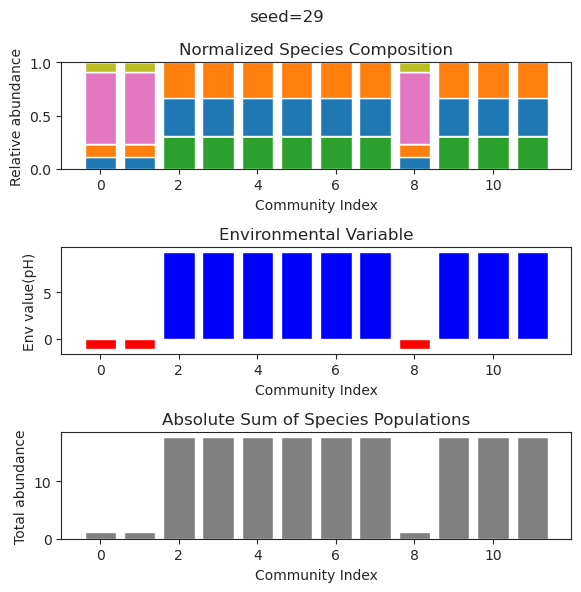

{'species': array([ 1.79918161e-01,  1.15482263e-01,  7.88938936e-61, -5.35104074e-42,
        1.99087549e-26,  5.01800495e-53, -7.74834903e-14,  1.81218768e-41,
        3.49638597e-01,  3.15795138e-59,  1.01101082e-59, -2.97623225e-54]), 'env': array([-2.8566541])}
{'species': array([ 1.79918161e-01,  1.15482263e-01, -2.18314870e-76, -1.77666516e-56,
        6.28399028e-26,  3.77226891e-60,  7.89227217e-11, -2.76388122e-43,
        3.49638597e-01,  9.24707058e-75,  3.23521582e-75, -9.29572589e-56]), 'env': array([-2.8566541])}
{'species': array([ 2.74716894e-65, -7.85227876e-78,  2.34403073e+00,  2.63305357e-39,
        3.04975668e+00, -1.58292544e-36,  4.19476251e-71,  2.04283754e+00,
        1.19853434e-64,  3.47087293e+00,  2.59987580e-23, -2.87687211e-41]), 'env': array([7.09262792])}
{'species': array([ 1.79918161e-01,  1.15482263e-01,  8.68526423e-69,  6.93067876e-35,
        4.75919926e-22, -8.01536238e-33,  2.10062559e-14,  6.74741238e-40,
        3.49638597e-01, -1.36931264e-

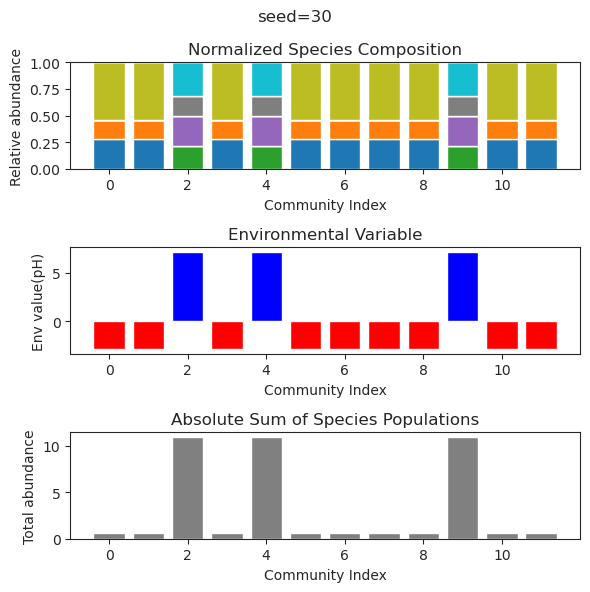

{'species': array([ 6.34284949e-037,  1.97771459e-001,  9.60937310e-034,
        4.44453576e-001,  1.44132451e-037,  6.88077812e-024,
        3.04323957e-116, -1.30406432e-066,  8.67195750e-002,
        3.89392128e-001,  2.50507658e-002,  2.97739291e-001]), 'env': array([-1.65491739])}
{'species': array([-1.70623775e-64,  1.97771459e-01,  1.68543531e-22,  4.44453576e-01,
        6.76525206e-43, -2.00719620e-21,  3.54719544e-84,  5.38474718e-43,
        8.67195750e-02,  3.89392128e-01,  2.50507658e-02,  2.97739291e-01]), 'env': array([-1.65491739])}
{'species': array([ 1.24740560e-62,  1.97771459e-01, -1.20658078e-23,  4.44453576e-01,
        3.55012100e-57, -1.63433498e-16, -8.81994773e-94, -1.70717836e-46,
        8.67195750e-02,  3.89392128e-01,  2.50507658e-02,  2.97739291e-01]), 'env': array([-1.65491739])}
{'species': array([ 2.27556260e-074,  1.97771459e-001,  2.12741771e-025,
        4.44453576e-001,  4.43436634e-068, -2.47535878e-017,
        3.61738616e-115,  7.40057953e-052, 

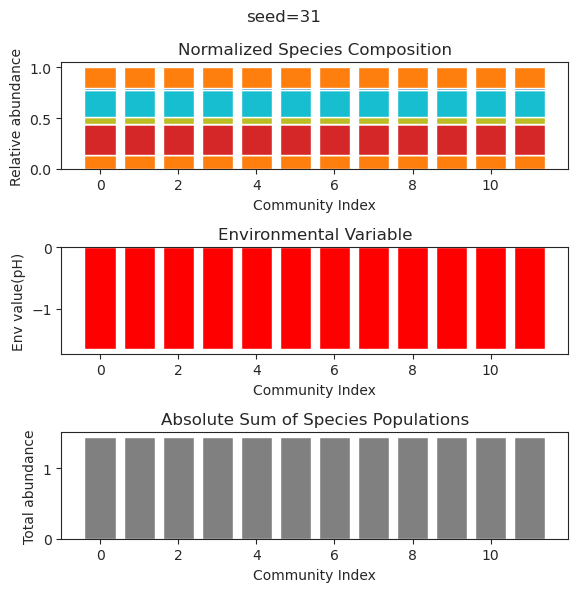

{'species': array([ 1.49757381e-37,  1.97771459e-01,  4.92474734e-18,  4.44453576e-01,
        9.91828793e-56, -7.42024999e-19,  4.27107851e-78, -3.20744578e-45,
        8.67195750e-02,  3.89392128e-01,  2.50507658e-02,  2.97739291e-01]), 'env': array([-1.65491739])}
{'species': array([-8.58939329e-105, -4.21469661e-084, -2.71904933e-072,
        2.86456691e+000, -1.57973356e-104,  1.65458197e-001,
       -1.87251671e-109, -4.85246119e-073,  4.38839509e-001,
        2.21465125e+000,  2.39961115e-021,  2.98723277e-087]), 'env': array([3.80345504])}
{'species': array([ 1.90531315e-68,  5.59425727e-60,  1.03773540e-61,  2.86456691e+00,
       -1.01866095e-74,  1.65458197e-01, -3.94011772e-78,  2.30407699e-56,
        4.38839509e-01,  2.21465125e+00,  1.22537234e-19, -3.12271896e-70]), 'env': array([3.80345504])}
{'species': array([-1.42249246e-75,  6.30906286e-57, -1.89800907e-60,  2.86456691e+00,
        1.10763938e-62,  1.65458197e-01,  5.69763914e-68,  2.67327178e-56,
        4.3883950

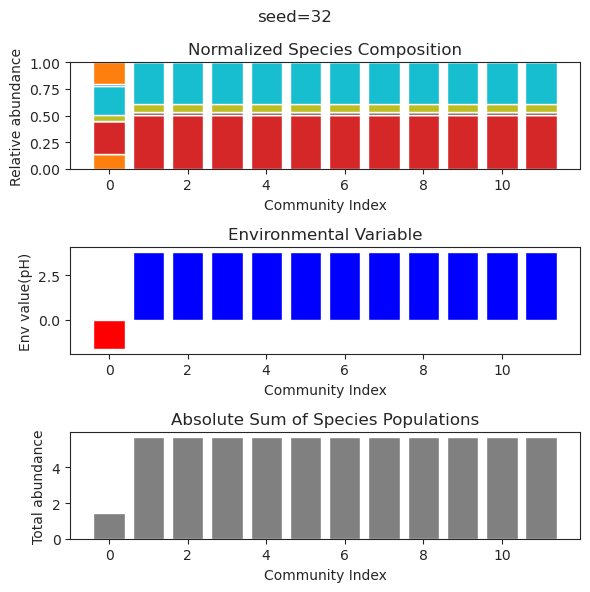

{'species': array([ 2.09246854e-02,  3.30624188e-01,  2.39655198e-01,  3.47013384e-54,
       -5.59813416e-48,  5.68087461e-57,  4.49452359e-56, -7.49175806e-62,
        7.10138784e-26,  4.32641519e-01, -7.93694122e-45, -8.70098014e-68]), 'env': array([-2.60650115])}
{'species': array([ 2.09246854e-02,  3.30624188e-01,  2.39655198e-01,  1.37367715e-46,
        1.12481636e-38,  2.23972450e-51,  1.58994814e-51, -2.40134607e-64,
        2.20846146e-24,  4.32641519e-01,  7.20563405e-38, -1.27450950e-71]), 'env': array([-2.60650115])}
{'species': array([ 2.09246854e-002,  3.30624188e-001,  2.39655198e-001,
        2.81462234e-062, -3.36538420e-052,  5.20463410e-070,
        1.10394745e-072,  3.19169414e-089,  2.69078985e-023,
        4.32641519e-001, -1.57605343e-053, -6.50701178e-101]), 'env': array([-2.60650115])}
{'species': array([ 9.02842365e-108, -1.62539621e-103,  2.16259882e-001,
        5.14973297e-001,  7.91659227e-001,  9.29140100e-090,
       -1.41150525e-130,  3.39459955e-121, 

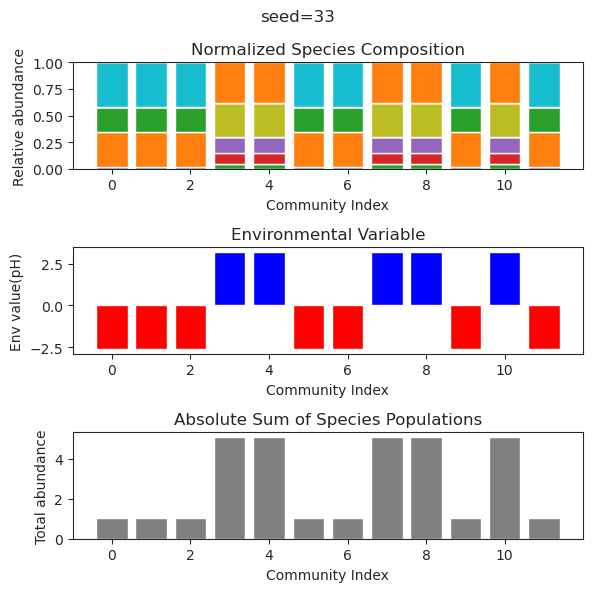

{'species': array([ 4.49678689e-01,  5.51619587e-43, -1.98254506e-27, -2.38190171e-44,
       -9.87121394e-56,  2.89281453e-41, -3.33064226e-57,  3.36494281e-18,
        5.34947796e-40,  7.49421953e-58,  9.38204803e-01,  1.44901642e-47]), 'env': array([-2.68865015])}
{'species': array([ 4.49678689e-01, -8.57089664e-46,  2.53523941e-24,  1.72979390e-52,
       -3.05888994e-66, -1.87104776e-48,  1.93709206e-72, -1.65438889e-17,
       -8.26548174e-41, -1.10128643e-70,  9.38204803e-01,  1.57742943e-55]), 'env': array([-2.68865015])}
{'species': array([ 4.49678689e-01,  9.05390635e-43, -1.18351125e-23,  1.09327793e-45,
        1.04557072e-55,  7.27152361e-42, -4.50824281e-60,  1.67752247e-14,
       -4.09755923e-39, -4.06599400e-60,  9.38204803e-01, -3.16161398e-47]), 'env': array([-2.68865015])}
{'species': array([ 4.49678689e-01,  1.36909513e-37, -4.51989432e-27,  1.19858672e-37,
        3.40341792e-43,  7.57398535e-36,  7.64196101e-52,  1.54559194e-18,
       -4.14158135e-34,  3.5519359

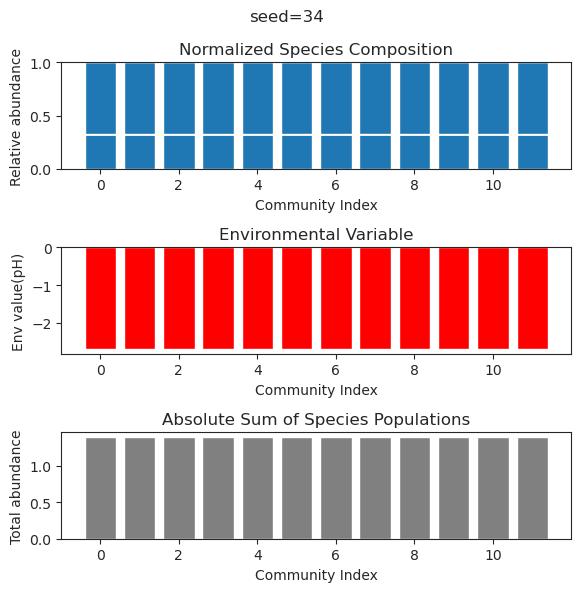

{'species': array([ 2.99741372e-01,  4.38891138e-02,  6.47480138e-51, -5.77853935e-49,
       -2.91068759e-54,  1.31667656e-25,  3.13399654e-22,  7.64314131e-02,
        5.53273990e-22,  2.96771422e-59, -9.37658639e-40,  8.22960634e-59]), 'env': array([-3.32785074])}
{'species': array([ 2.99741372e-01,  4.38891138e-02, -2.29402507e-67,  1.25666155e-57,
        2.65558809e-78, -7.12569603e-36, -1.52549166e-31,  7.64314131e-02,
       -6.88509597e-29, -1.75377921e-80, -2.36166578e-35, -1.60319692e-80]), 'env': array([-3.32785074])}
{'species': array([ 2.99741372e-01,  4.38891138e-02, -6.20799570e-54,  5.75639171e-50,
       -9.34950924e-62,  5.23231838e-28, -2.07073729e-27,  7.64314131e-02,
        2.99741940e-24,  1.79085301e-66, -1.26427463e-34, -3.19507905e-65]), 'env': array([-3.32785074])}
{'species': array([ 2.99741372e-01,  4.38891138e-02,  5.09120196e-61, -6.53014085e-59,
        1.45253778e-63,  1.64087630e-31,  6.72158294e-28,  7.64314131e-02,
        8.22730406e-28, -1.0682176

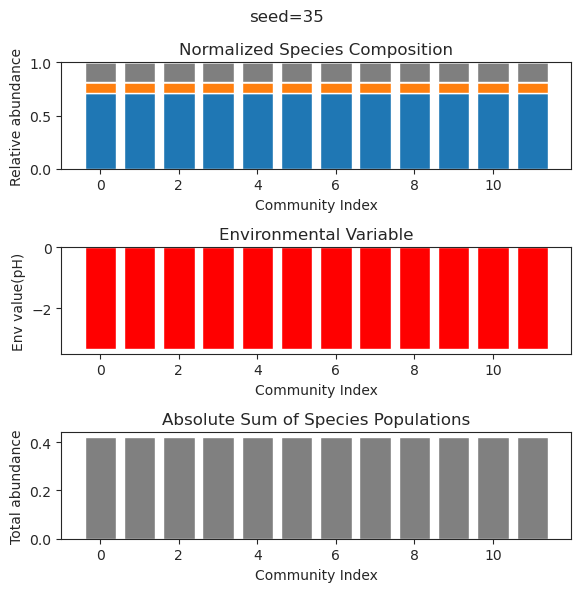

{'species': array([ 1.63118813e-01,  1.95450968e-01, -1.11598420e-69, -1.01912507e-67,
        1.30782383e-38, -6.25607964e-37, -3.15005061e-33,  3.42918913e-01,
       -4.42715991e-59, -3.96373067e-54,  6.48971242e-63,  1.34313734e-26]), 'env': array([-3.15213623])}
{'species': array([ 1.63118813e-01,  1.95450968e-01, -3.95090041e-71,  4.64655270e-67,
        3.87306323e-46,  4.22720259e-43,  1.04525249e-37,  3.42918913e-01,
       -6.80071745e-64, -3.29008588e-57,  1.43889566e-66,  3.36496342e-29]), 'env': array([-3.15213623])}
{'species': array([ 1.63118813e-01,  1.95450968e-01, -5.35089651e-84, -4.48472940e-85,
       -3.13090204e-44, -3.06804306e-41, -3.89462500e-33,  3.42918913e-01,
        9.17252008e-88,  6.15558818e-64,  1.12599733e-77, -1.46095268e-22]), 'env': array([-3.15213623])}
{'species': array([ 1.63118813e-01,  1.95450968e-01,  5.35351107e-51, -3.86709261e-48,
       -1.32518089e-33,  2.05553034e-30, -1.50340711e-30,  3.42918913e-01,
        1.67086405e-46,  1.9464994

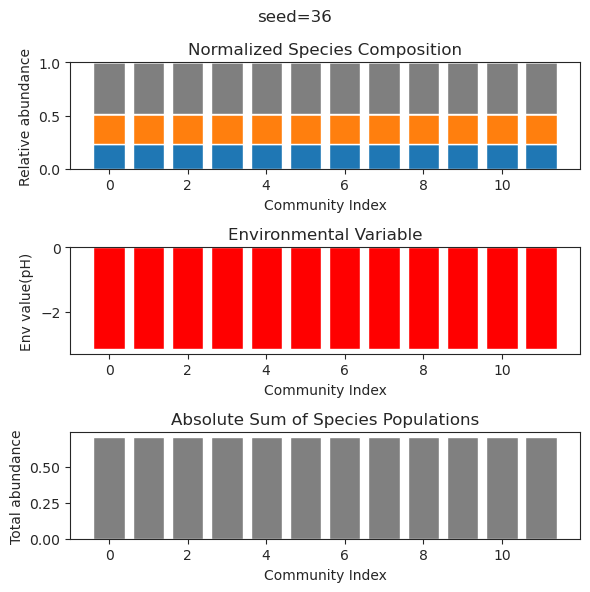

{'species': array([ 1.73338732e-27,  3.36985975e-01, -3.99109845e-46, -1.38120560e-79,
        1.18786560e-39, -2.39180916e-23,  1.69445284e-74,  3.12371958e-80,
       -5.00457563e-83,  2.40626842e-01,  2.82955565e-01, -5.04399039e-15]), 'env': array([-2.98730387])}
{'species': array([-3.70591595e-30,  3.36985975e-01,  2.29339732e-52, -1.85993171e-83,
        4.93414235e-38,  4.06478641e-24, -1.31568241e-79,  2.81653430e-84,
        3.81197709e-85,  2.40626842e-01,  2.82955565e-01,  1.17344172e-16]), 'env': array([-2.98730387])}
{'species': array([-1.02744248e-32,  3.36985975e-01,  1.89511684e-55, -1.45825936e-85,
        8.32862158e-43,  3.43155717e-31,  5.94350352e-80,  5.76206658e-86,
       -2.44261837e-86,  2.40626842e-01,  2.82955565e-01, -4.53711637e-18]), 'env': array([-2.98730387])}
{'species': array([ 2.29229070e-32,  3.36985975e-01,  6.85614197e-51, -6.07818024e-81,
        2.90573947e-40, -1.50894404e-26,  1.80162530e-76, -4.59150683e-83,
       -4.98706394e-87,  2.4062684

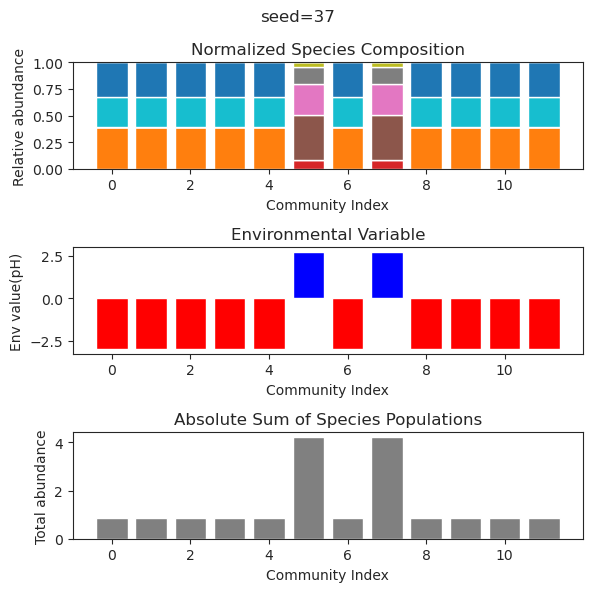

{'species': array([ 2.59506714e-01,  1.01410597e-55,  2.97123019e-51,  9.88646626e-70,
       -8.73914137e-17, -8.91929557e-71,  4.63247837e-01, -7.57416338e-32,
        7.55668342e-01,  8.46826078e-53,  3.75427789e-23,  2.95619803e-64]), 'env': array([-2.2603979])}
{'species': array([ 2.59506714e-01, -4.63674118e-56, -3.89725687e-52, -1.35242232e-70,
       -4.05663445e-14,  5.80191183e-70,  4.63247837e-01,  9.67613784e-35,
        7.55668342e-01, -7.11282750e-52, -1.40641332e-21,  8.48891551e-65]), 'env': array([-2.2603979])}
{'species': array([ 6.79283761e-51,  4.96739975e-53, -3.97003881e-44,  3.56713013e+00,
        2.23233670e-36,  1.16615141e-53,  1.56787163e-49,  1.11125317e+00,
        9.62407119e-61,  9.38702899e-37,  3.16707612e+00,  5.93607644e-52]), 'env': array([5.62328112])}
{'species': array([ 3.75502637e-45,  4.89029964e-46, -1.84679502e-42,  3.56713013e+00,
        2.93790933e-36, -4.64352254e-47,  1.36962850e-44,  1.11125317e+00,
       -4.50257696e-52,  1.14497472e-

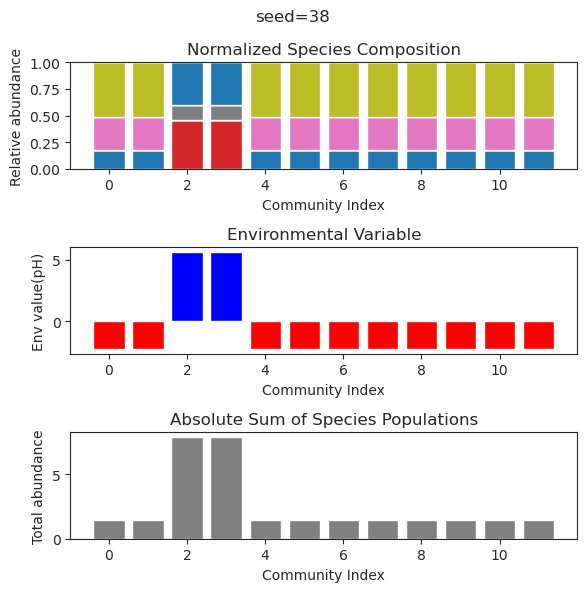

{'species': array([ 7.96468682e-02,  2.00590788e-01, -1.39230090e-15, -2.69740128e-61,
        2.15403392e-65, -2.38810935e-80,  1.98859961e-25, -1.02559796e-41,
        5.69280789e-71,  1.77057027e-66,  3.58224343e-01, -1.03002545e-60]), 'env': array([-2.34084471])}
{'species': array([ 7.96468678e-02,  2.00590788e-01, -3.07866985e-18,  1.95592893e-67,
        5.79009963e-43,  7.02671142e-82,  1.22413497e-30,  1.33970705e-57,
        3.31669150e-81,  1.14021344e-55,  3.58224344e-01,  1.88161821e-68]), 'env': array([-2.34084471])}
{'species': array([-9.44931902e-64, -6.44822118e-36,  4.08743481e+00,  6.03059652e+00,
        1.67879148e-76,  2.34409607e-01,  8.88783242e-01,  2.03200849e-80,
        1.08610115e-54,  2.27366170e-65,  1.05084105e-29,  4.24239086e+00]), 'env': array([8.81678958])}
{'species': array([-1.85838095e-075,  4.18604785e-034,  4.08743481e+000,
        6.03059652e+000, -8.88108181e-038,  2.34409607e-001,
        8.88783242e-001, -6.28235148e-114,  6.51525235e-045,
  

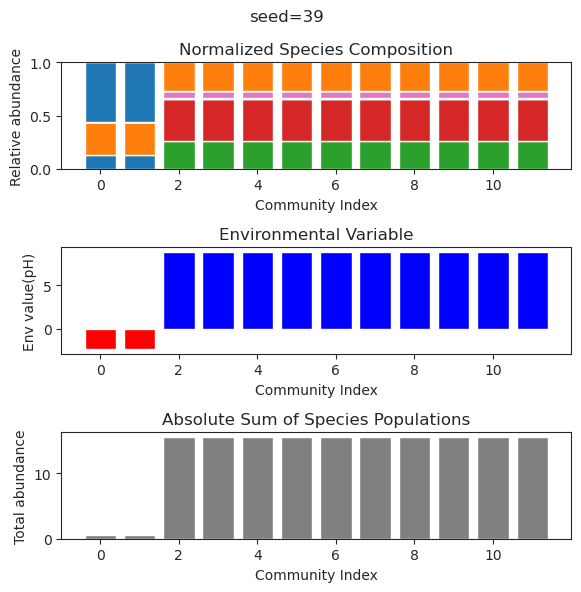

{'species': array([ 6.77447921e-02,  1.96020826e-01,  7.49672320e-20,  2.85136247e-01,
       -6.41810412e-44, -7.40221962e-45, -1.36301365e-57,  4.11959418e-25,
        5.78325991e-01, -5.34598429e-18, -6.48549759e-49,  1.52058608e-42]), 'env': array([-1.95125876])}
{'species': array([ 6.77447921e-002,  1.96020826e-001, -3.36109688e-021,
        2.85136247e-001, -8.65576618e-095, -7.48610975e-117,
       -9.44600040e-081, -4.55142489e-025,  5.78325991e-001,
       -3.07455265e-018, -4.00778247e-088,  1.22445891e-053]), 'env': array([-1.95125876])}
{'species': array([ 1.89678281e-125,  5.34881942e-117,  1.53492180e-089,
        5.21031528e-107,  3.49417963e+000,  1.68479211e+000,
        2.21370612e+000,  4.23239857e+000,  8.96739897e-102,
       -1.01353276e-054,  1.33175977e-001,  2.15807155e+000]), 'env': array([8.94474457])}
{'species': array([-1.80741362e-72,  3.37564070e-73, -4.99317170e-54, -1.32185819e-60,
        3.49417963e+00,  1.68479211e+00,  2.21370612e+00,  4.23239857e+0

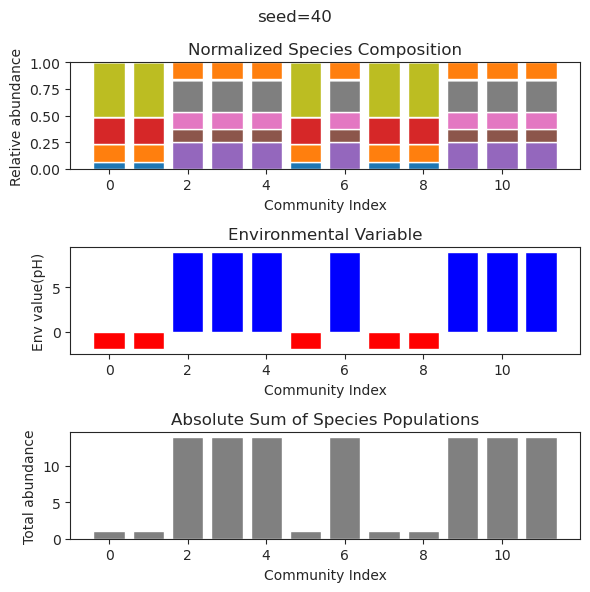

{'species': array([ 2.87738710e-002,  9.61600176e-002,  5.28343080e-001,
        1.01356022e-197,  4.38196562e-003,  6.65462576e-149,
        2.63311081e-002,  2.27956406e-074,  3.53704693e-001,
        1.50739150e-001, -1.22324922e-098,  7.26693493e-001]), 'env': array([-0.05177211])}
{'species': array([ 2.87497897e-002,  9.61668280e-002,  5.28283433e-001,
        1.53977715e-206,  4.26215372e-003,  4.07918260e-154,
        2.63603453e-002,  2.94022785e-073,  3.53738676e-001,
        1.50817127e-001, -2.49579911e-100,  7.26741715e-001]), 'env': array([-0.05173599])}
{'species': array([ 2.87725267e-002,  9.61603939e-002,  5.28339738e-001,
        3.52251973e-148,  4.37525854e-003, -1.74657258e-036,
        2.63327508e-002,  1.79323155e-044,  3.53706586e-001,
        1.50743524e-001,  1.53368623e-077,  7.26696196e-001]), 'env': array([-0.05177009])}
{'species': array([ 2.87683283e-002,  9.61615721e-002,  5.28329310e-001,
       -4.31853355e-199,  4.35432647e-003, -7.54243302e-152,
     

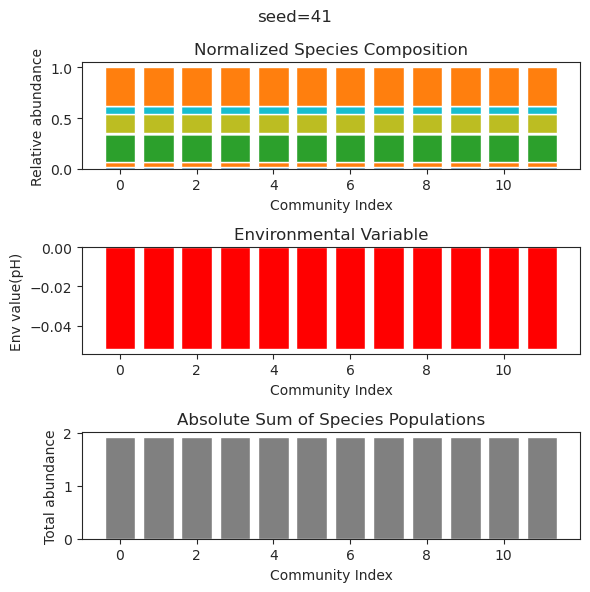

{'species': array([ 6.44759700e-51,  2.75044655e-01, -3.27488858e-38,  7.14629151e-01,
        3.18911536e-65,  1.49114603e-01,  5.49695067e-49, -1.13434562e-21,
        2.29640559e-63, -1.70097191e-31,  4.55619778e-30,  2.89783372e-01]), 'env': array([-2.04737359])}
{'species': array([-3.22310539e-45,  2.75044655e-01, -1.74515220e-34,  7.14629151e-01,
       -1.18937575e-57,  1.49114603e-01, -2.18593312e-42, -2.26636888e-19,
        2.11501863e-56,  1.18214869e-28, -9.87249595e-21,  2.89783372e-01]), 'env': array([-2.04737359])}
{'species': array([-3.63652144e-58,  2.75044655e-01, -2.36593715e-42,  7.14629151e-01,
        2.49183721e-73,  1.49114603e-01,  9.32240638e-53, -5.72292528e-26,
       -1.81377956e-68,  4.35219522e-34, -8.90958443e-28,  2.89783372e-01]), 'env': array([-2.04737359])}
{'species': array([ 2.06710799e-50,  2.75044655e-01, -1.53830925e-35,  7.14629151e-01,
        1.02887103e-56,  1.49114603e-01,  5.40423617e-44, -2.77171104e-21,
        8.13365767e-53, -2.6143931

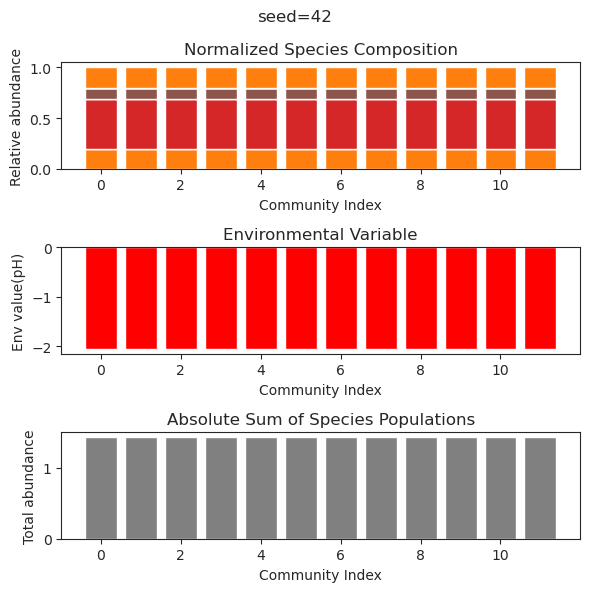

{'species': array([ 2.79636037e-01,  3.27004146e-21,  5.88042996e-68, -5.71760652e-66,
        9.88079268e-36, -1.61993626e-39,  2.56041513e-11,  8.01254973e-01,
        5.53916337e-45, -7.84045367e-78, -4.40920650e-69,  1.86344818e-64]), 'env': array([-1.43377525])}
{'species': array([ 2.79636037e-01,  1.53967920e-29, -1.73083026e-49, -1.50399908e-47,
        2.87070872e-34,  1.68563779e-33,  6.39937521e-09,  8.01254967e-01,
       -2.61458549e-43, -2.22271379e-53, -4.75304054e-47, -1.77677519e-43]), 'env': array([-1.43377524])}
{'species': array([ 2.79636037e-01,  3.16445986e-32, -1.61450022e-44, -1.53601661e-44,
       -3.69887639e-19, -5.91643263e-21,  8.58713551e-09,  8.01254966e-01,
        7.52910083e-42,  6.62299219e-47,  8.82640558e-39,  2.40546283e-34]), 'env': array([-1.43377524])}
{'species': array([ 2.79636037e-01,  5.67983228e-31,  1.13971654e-69,  1.43095759e-66,
       -2.44382545e-43, -1.42135773e-39,  5.85411419e-09,  8.01254968e-01,
       -1.28587020e-50, -3.2331662

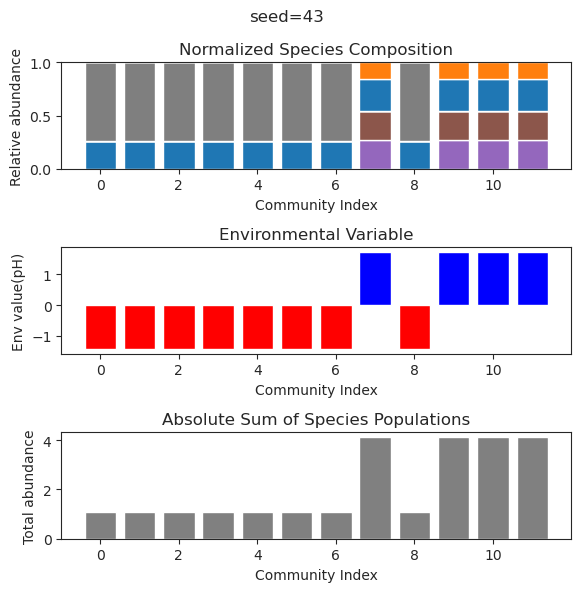

{'species': array([ 3.60000904e-64, -2.19143956e-46, -1.35218817e-46,  1.45084809e-66,
        1.12587085e+00,  1.10451448e+00,  2.63223062e-65,  1.65193478e-22,
        5.78831047e-46,  7.05181598e-38,  1.22947815e+00,  6.54416282e-01]), 'env': array([1.72887708])}
{'species': array([ 3.60000904e-64, -2.19143956e-46, -1.35218817e-46,  1.45084809e-66,
        1.12587085e+00,  1.10451448e+00,  2.63223062e-65,  1.65193478e-22,
        5.78831047e-46,  7.05181598e-38,  1.22947815e+00,  6.54416282e-01]), 'env': array([1.72887708])}
{'species': array([ 8.64939096e-59, -3.18635525e-57,  3.08024580e+00, -7.74898761e-95,
       -1.04885054e-63,  1.54056300e+00,  1.07518000e-20,  7.46179004e-69,
        5.26706949e+00,  5.62204380e+00,  2.85519010e-64, -8.17539468e-83]), 'env': array([8.42895592])}
{'species': array([ 7.08799446e-48, -2.82849004e-52,  3.08024580e+00, -3.78328723e-70,
        3.61155045e-56,  1.54056300e+00, -1.55423590e-19, -1.48220443e-65,
        5.26706949e+00,  5.62204380e+

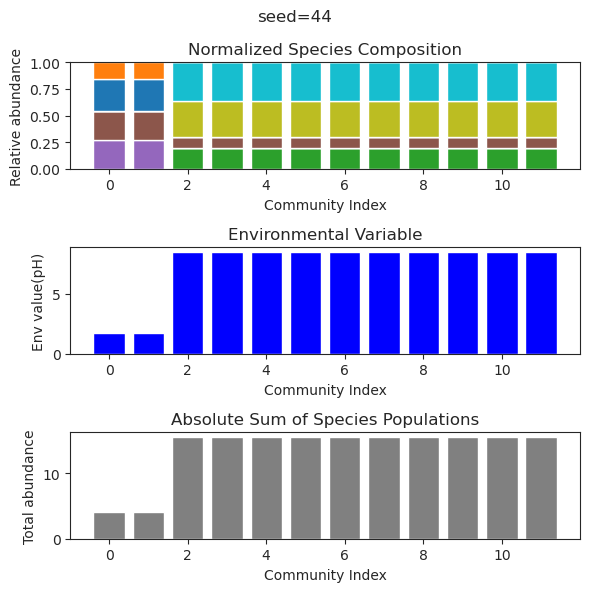

{'species': array([ 3.32026178e-01,  4.98899732e-20, -5.38041415e-49,  2.80096409e-51,
        7.82158989e-52, -6.50357315e-45,  1.01540739e-28, -2.81024065e-36,
        3.25577560e-01, -2.41651391e-46,  8.27736015e-42,  1.18463553e-52]), 'env': array([-3.15111436])}
{'species': array([ 3.32026178e-01, -9.63601939e-20,  2.52806372e-87, -1.05021345e-83,
       -3.83893663e-91, -4.82522036e-76,  6.51783019e-33, -6.42184140e-55,
        3.25577560e-01,  6.09208515e-67, -2.80034940e-54, -6.67536133e-95]), 'env': array([-3.15111436])}
{'species': array([ 3.32026178e-01,  1.94752461e-19,  9.25682621e-46,  1.14059820e-50,
        1.21162887e-50, -6.73885560e-45, -1.71395497e-31,  7.71715227e-38,
        3.25577560e-01, -2.31401877e-47,  2.22523065e-39, -1.97136130e-52]), 'env': array([-3.15111436])}
{'species': array([ 3.32026178e-01,  4.25475040e-19, -5.10174691e-70,  5.58604963e-69,
        6.31481617e-74, -8.17765252e-63, -1.90280792e-26,  6.57473704e-47,
        3.25577560e-01, -6.7645829

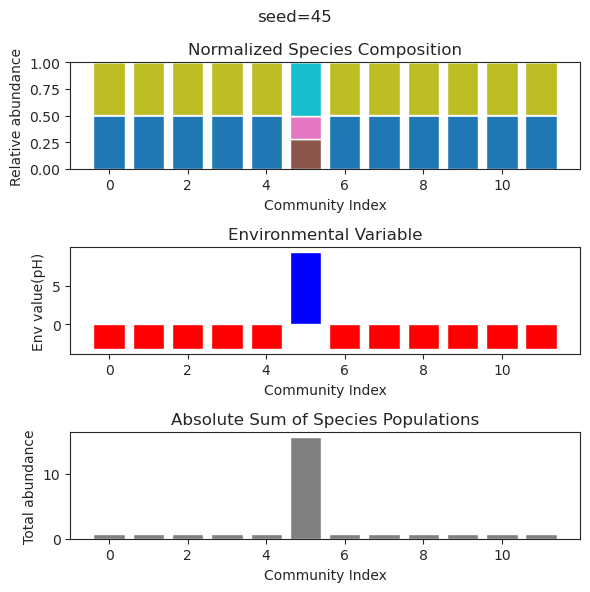

{'species': array([-7.34540592e-47,  2.68846092e-01,  2.76540570e-88,  9.00199223e-01,
        1.28750660e-16, -7.02424917e-33,  7.05804663e-25, -2.09189614e-53,
        1.40288895e-73,  5.87340965e-35, -1.93831321e-46,  6.33242071e-02]), 'env': array([-2.08110105])}
{'species': array([-6.50720056e-54,  2.68846092e-01,  9.83433156e-99,  9.00199223e-01,
        1.60297468e-18,  3.53180731e-41, -8.65875044e-26,  2.05166648e-64,
       -9.39763983e-79,  3.13563846e-38, -2.69137223e-54,  6.33242071e-02]), 'env': array([-2.08110105])}
{'species': array([-2.83751931e-39,  2.68846092e-01,  1.40487634e-61,  9.00199223e-01,
       -2.72371813e-15, -1.23203232e-31, -7.47901714e-22, -6.13209510e-41,
       -1.67426749e-36,  3.86755468e-26, -8.47229080e-37,  6.33242071e-02]), 'env': array([-2.08110105])}
{'species': array([ 1.01850240e-41,  2.68846092e-01,  1.33454982e-53,  9.00199223e-01,
        3.86968117e-16, -1.77373967e-36, -3.22990589e-22,  2.77448398e-33,
        5.96047343e-43,  1.4039815

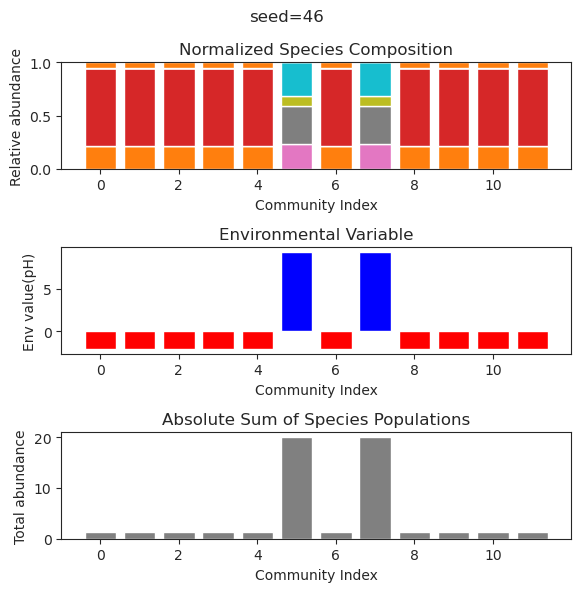

{'species': array([-1.02945354e-13,  2.58479525e-01,  3.01503024e-31,  7.86989768e-01,
        2.22946819e-43, -5.17281519e-73, -1.65827734e-35,  2.35352903e-21,
        5.38661098e-30, -7.28167909e-68,  1.63489161e-46, -4.40179791e-63]), 'env': array([-2.43973058])}
{'species': array([-4.90043560e-15,  2.58479525e-01, -4.43915926e-36,  7.86989768e-01,
        1.48429376e-54,  2.28553118e-79,  2.38803452e-34,  3.93933514e-27,
       -4.24434169e-32, -7.63511833e-82, -1.51696231e-63, -1.63004197e-80]), 'env': array([-2.43973058])}
{'species': array([-2.62335041e-15,  2.58479525e-01, -1.84912154e-30,  7.86989768e-01,
       -1.36046502e-39,  1.13648108e-39,  8.97041575e-41,  7.75429138e-25,
       -1.73112518e-36,  5.91082735e-76,  4.87981197e-53, -5.23111850e-73]), 'env': array([-2.43973058])}
{'species': array([ 8.39733611e-14,  2.58479525e-01,  8.91871212e-30,  7.86989768e-01,
        8.42933602e-41,  6.59807370e-67, -1.24629870e-34,  6.24171662e-22,
       -7.54525051e-30,  6.3946295

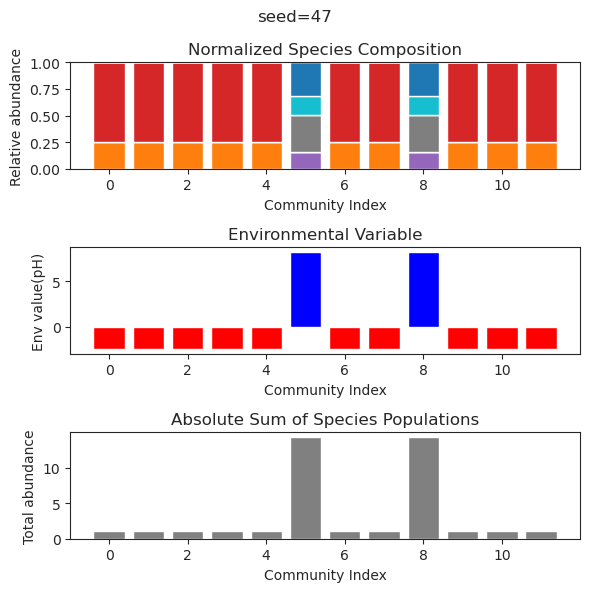

{'species': array([ 7.28426336e-002,  2.51324847e-001,  2.59236597e-033,
        2.31688203e-032, -3.19469059e-141,  1.69563956e-001,
        5.77548788e-087,  9.89366093e-120, -1.05319931e-148,
        1.06185456e-001, -2.52396508e-095,  3.51260314e-001]), 'env': array([-2.80147511])}
{'species': array([ 7.28426336e-002,  2.51324847e-001, -1.81723237e-031,
        6.47256930e-027,  8.13278698e-101,  1.69563956e-001,
       -7.86670603e-068, -2.87515936e-084,  7.96701802e-105,
        1.06185456e-001, -3.23151393e-070,  3.51260314e-001]), 'env': array([-2.80147511])}
{'species': array([ 7.28426336e-02,  2.51324847e-01,  2.39216125e-30,  4.38250704e-29,
        5.94113378e-69,  1.69563956e-01,  2.56026466e-48, -1.35481566e-63,
        1.10025986e-72,  1.06185456e-01, -3.55188665e-53,  3.51260314e-01]), 'env': array([-2.80147511])}
{'species': array([ 7.28426336e-002,  2.51324847e-001, -1.78116570e-032,
       -3.18392900e-028,  1.31674154e-117,  1.69563956e-001,
        1.47541589e-074,

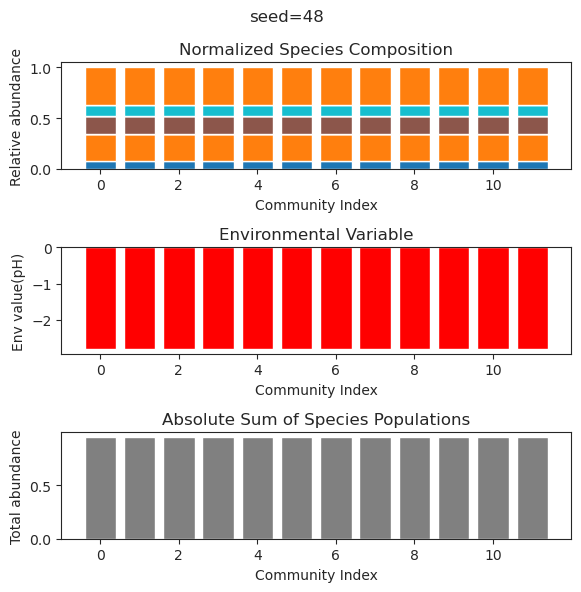

{'species': array([-1.07361967e-057,  1.06413737e-001,  2.06320117e-001,
        3.31029513e-001,  3.60222366e-017, -9.31690493e-083,
       -1.21014432e-044, -1.94048739e-056,  7.88518058e-001,
       -9.11880029e-046, -4.26949279e-058,  6.58450184e-100]), 'env': array([-0.44981647])}
{'species': array([-8.43917501e-057,  1.06413737e-001,  2.06320117e-001,
        3.31029513e-001, -1.81198554e-018,  1.66220643e-092,
        1.09270841e-045, -4.29906901e-063,  7.88518058e-001,
        5.59948987e-048, -1.01610211e-060, -1.25928000e-110]), 'env': array([-0.44981647])}
{'species': array([-2.46622647e-56, -2.95355854e-50,  1.79806821e-30, -1.34098304e-46,
        9.26963857e-47, -1.49448601e-48,  1.60973435e+00,  2.26459624e+00,
        3.76089279e-56,  4.71544169e-01,  2.11110501e-54,  4.23736541e+00]), 'env': array([4.60443867])}
{'species': array([-1.59144471e-54,  1.06413737e-01,  2.06320117e-01,  3.31029513e-01,
        8.24616358e-19,  2.05881612e-81, -6.97531669e-44, -2.28281117e-5

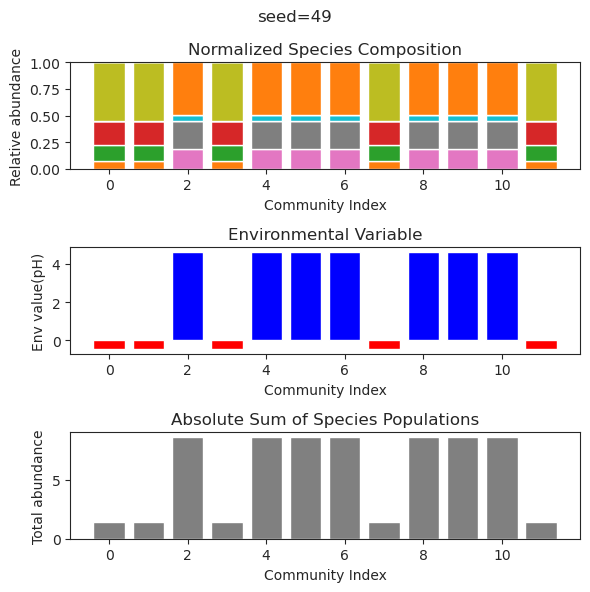

{'species': array([ 1.24608490e-001, -2.98689208e-040, -1.16417992e-201,
       -3.59522939e-205,  2.01512667e-141,  4.05952378e-189,
        9.12312921e-001,  3.19248915e-147,  3.83684245e-001,
        5.31932995e-147,  1.01492208e-002,  3.76062226e-001]), 'env': array([-0.37688837])}
{'species': array([ 1.24608549e-001, -2.03669385e-056,  4.16636070e-192,
        2.80558707e-197,  1.18258419e-101,  5.98738567e-050,
        9.12313834e-001, -1.84170141e-150,  3.83670845e-001,
        2.10285264e-035,  1.01429331e-002,  3.76064716e-001]), 'env': array([-0.37695215])}
{'species': array([ 1.24609101e-001,  2.00765161e-056,  5.59149995e-197,
       -4.50244869e-200,  1.52325042e-068, -1.02994823e-187,
        9.12313429e-001, -2.80469304e-146,  3.83667290e-001,
        3.54836060e-048,  1.01431375e-002,  3.76064692e-001]), 'env': array([-0.3769644])}
{'species': array([ 1.24608696e-001, -5.62697192e-049,  2.23818442e-176,
       -3.35108906e-174,  4.02255881e-070, -2.32589845e-052,
      

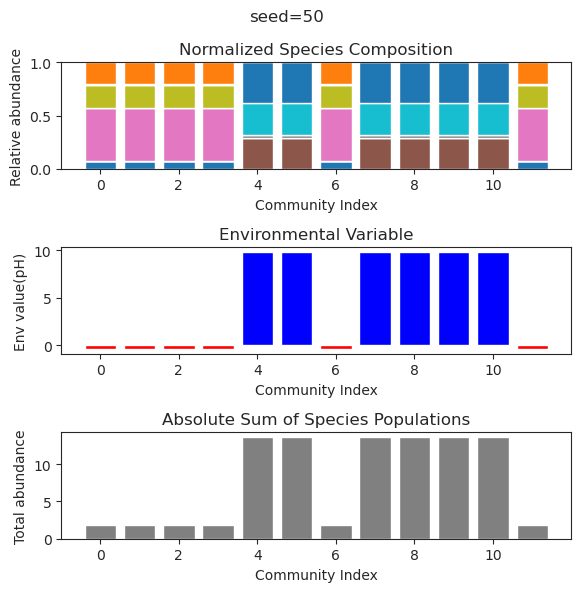

{'species': array([ 2.63814755e-01, -2.00669851e-26, -3.88372135e-61,  8.81526350e-40,
       -6.60253730e-27,  2.25150032e-01,  5.62199911e-01, -9.14031860e-60,
        9.10418700e-37, -8.68957499e-60,  6.01602592e-01,  1.20130478e-28]), 'env': array([-1.6445711])}
{'species': array([ 2.63814755e-01, -1.82123876e-26, -5.69145229e-59, -4.37453522e-38,
        6.93383963e-28,  2.25150032e-01,  5.62199911e-01, -5.61309745e-59,
        1.00691549e-32, -6.01388424e-58,  6.01602592e-01,  8.89087603e-25]), 'env': array([-1.6445711])}
{'species': array([ 2.63814755e-01,  3.08285638e-25, -2.02361031e-56,  5.60224795e-39,
        4.45726285e-25,  2.25150032e-01,  5.62199911e-01, -6.46465040e-56,
       -8.16029807e-34,  1.27473758e-55,  6.01602592e-01, -5.67054372e-28]), 'env': array([-1.6445711])}
{'species': array([ 2.63814755e-01, -8.00278670e-24,  3.75020172e-63,  5.98988647e-36,
       -8.47225891e-24,  2.25150032e-01,  5.62199911e-01,  3.96043935e-62,
       -1.11911015e-31, -4.46281948e-

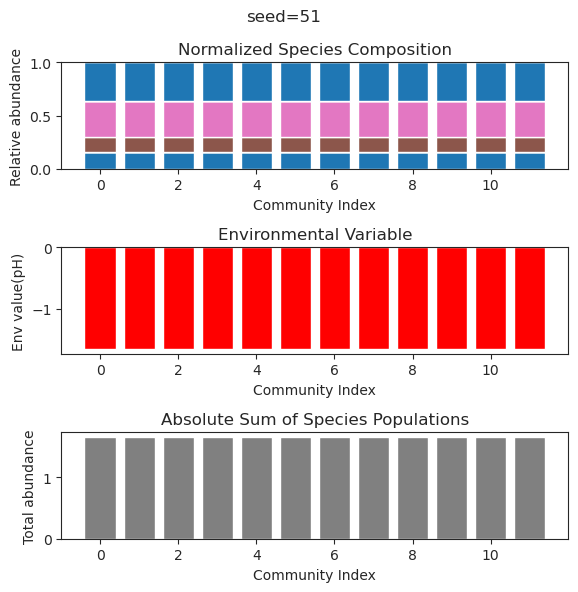

{'species': array([ 2.12836976e-01, -4.23709551e-32, -1.48779102e-21,  1.24427200e-01,
        4.85401371e-01,  9.69339705e-71,  1.94780349e-53,  2.66209549e-33,
        3.65573038e-01,  5.67316208e-73, -9.55245722e-36, -2.37587468e-15]), 'env': array([-1.52044288])}
{'species': array([ 2.12836976e-01, -4.76852649e-28,  1.10808724e-28,  1.24427200e-01,
        4.85401371e-01, -3.39147633e-82, -2.18105772e-62,  4.88575395e-39,
        3.65573038e-01,  2.86123555e-89,  7.60503890e-35,  1.40375716e-16]), 'env': array([-1.52044288])}
{'species': array([ 2.12836976e-01, -9.47452306e-34, -1.64992102e-24,  1.24427200e-01,
        4.85401371e-01,  4.53809561e-96, -1.57953994e-68,  2.96285949e-40,
        3.65573038e-01,  2.21835735e-97, -1.04856639e-38, -2.26918240e-16]), 'env': array([-1.52044288])}
{'species': array([ 2.12836976e-01,  2.23141137e-34,  3.22948495e-26,  1.24427200e-01,
        4.85401371e-01,  5.31810223e-80, -8.50287930e-58, -1.78874732e-35,
        3.65573038e-01,  3.2994592

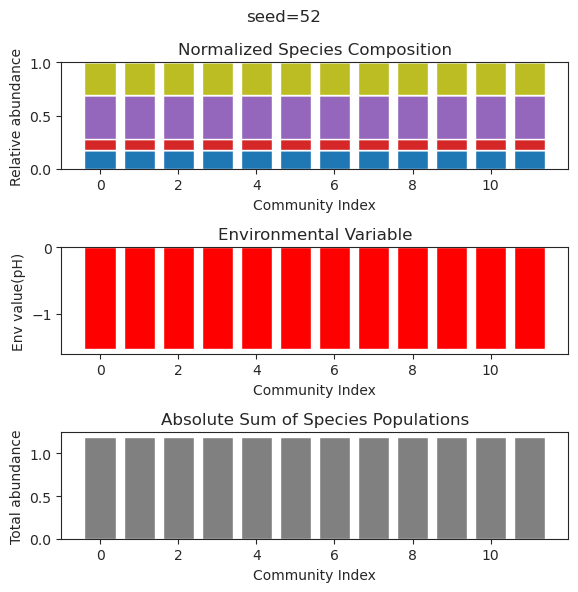

{'species': array([-7.12249507e-21,  3.70693384e-01,  7.11546722e-82, -7.43342682e-56,
       -1.41016061e-59,  7.70047187e-01,  9.34962021e-59, -3.69836968e-43,
       -3.28101387e-29, -2.62360340e-20, -1.63016354e-33,  1.83178643e-35]), 'env': array([-2.50221193])}
{'species': array([ 9.74403232e-22,  3.70693384e-01,  1.42117851e-75,  2.12167272e-52,
        5.58885321e-52,  7.70047187e-01, -3.33279986e-54,  6.10485895e-41,
       -1.84402074e-30,  1.42252248e-20, -6.54292825e-30, -2.18525872e-31]), 'env': array([-2.50221193])}
{'species': array([ 5.69103734e-20,  3.70693384e-01,  1.71007649e-77, -1.32256133e-58,
        3.80858463e-54,  7.70047187e-01, -7.32785351e-55, -1.17465610e-39,
       -6.33218440e-33,  2.54063462e-20,  2.28252350e-32, -7.87819500e-37]), 'env': array([-2.50221193])}
{'species': array([-1.20603013e-20,  3.70693384e-01,  5.26374792e-78,  2.70478143e-51,
       -2.66016478e-55,  7.70047187e-01, -4.80537329e-57, -4.00172007e-43,
       -5.04751428e-30, -1.2541156

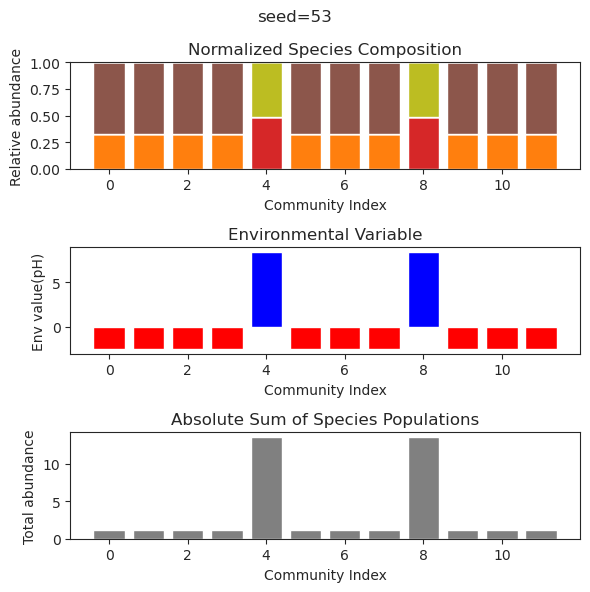

{'species': array([-2.08965775e-17,  3.70693384e-01, -5.58353991e-56, -1.62026929e-42,
       -1.76077965e-42,  7.70047187e-01,  5.25711829e-41,  8.25555362e-33,
        1.90545924e-26, -7.16453909e-18,  6.28203945e-27, -4.03156343e-28]), 'env': array([-2.50221193])}
{'species': array([-2.08965775e-17,  3.70693384e-01, -5.58353991e-56, -1.62026929e-42,
       -1.76077965e-42,  7.70047187e-01,  5.25711829e-41,  8.25555362e-33,
        1.90545924e-26, -7.16453909e-18,  6.28203945e-27, -4.03156343e-28]), 'env': array([-2.50221193])}
{'species': array([-7.10677387e-43,  8.48054789e-47,  3.90364591e-45,  1.80047843e+00,
        5.05875319e+00,  3.16036084e+00, -7.69566221e-63,  6.75331167e-41,
       -2.18882725e-36,  5.37570847e-51,  9.18043954e-35, -4.02740612e-61]), 'env': array([7.05516597])}
{'species': array([-1.28484109e-48,  1.52593719e-47,  8.91306723e-41,  1.80047843e+00,
        5.05875319e+00,  3.16036084e+00, -2.90004428e-57, -4.59440313e-32,
       -4.52095861e-33,  1.50654030

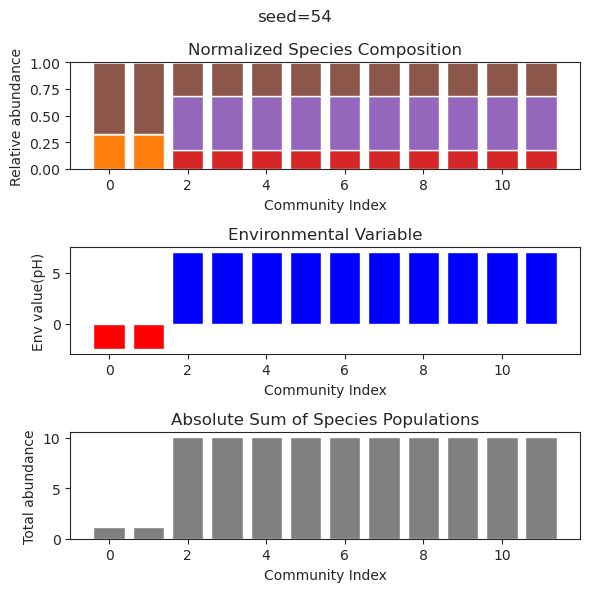

{'species': array([ 6.57598680e-002,  2.13722506e-001,  1.91587221e-001,
        1.73842585e-023, -6.45052782e-044,  1.14947917e-057,
        1.39658955e-156, -5.43568256e-105,  8.74038550e-057,
       -1.16252144e-063,  5.61327780e-001,  3.81105292e-001]), 'env': array([-1.54687982])}
{'species': array([ 6.57598680e-002,  2.13722506e-001,  1.91587221e-001,
        3.75384113e-031, -5.70608691e-049, -2.00940061e-055,
        8.28925627e-166, -8.00126954e-110, -1.89918546e-057,
        7.66636768e-072,  5.61327780e-001,  3.81105292e-001]), 'env': array([-1.54687982])}
{'species': array([ 6.57598680e-002,  2.13722506e-001,  1.91587221e-001,
       -1.71552420e-027, -5.93665129e-047, -2.39416083e-052,
       -9.70493894e-151, -1.74270473e-101, -8.47665530e-051,
       -1.64094979e-062,  5.61327780e-001,  3.81105292e-001]), 'env': array([-1.54687982])}
{'species': array([ 6.57598680e-002,  2.13722506e-001,  1.91587221e-001,
        4.42429050e-023,  9.46988799e-042,  4.90107596e-053,
     

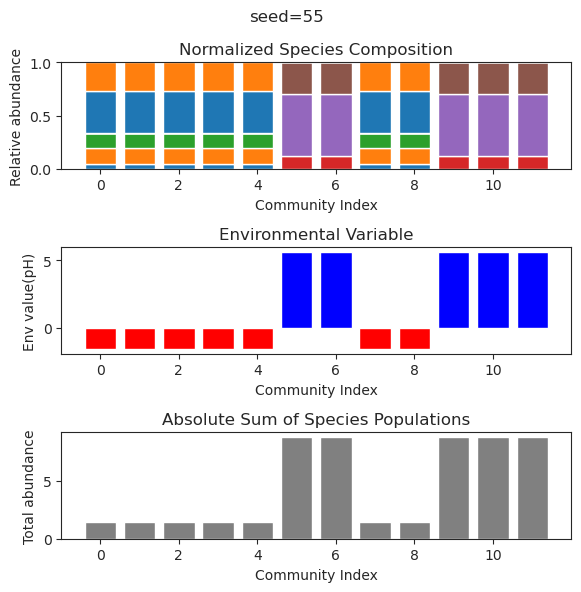

{'species': array([ 2.40833295e-01, -1.21822982e-45,  5.02368466e-01,  4.27409557e-01,
        4.44506563e-23,  7.92541110e-03, -8.97518357e-55,  4.70290001e-29,
        8.10054382e-58,  8.64659859e-35,  4.80279568e-52, -3.50547076e-48]), 'env': array([-1.65167427])}
{'species': array([ 2.40833287e-01,  3.21662671e-40,  5.02368413e-01,  4.27409561e-01,
        3.11644005e-23,  7.92546533e-03,  2.83918484e-49, -2.26976157e-29,
       -1.48284094e-62, -2.32501419e-32,  4.93669159e-48, -3.12534505e-46]), 'env': array([-1.65167426])}
{'species': array([-3.60973415e-52, -1.49969941e-51,  7.29188943e-55,  5.58205276e-48,
        2.20291704e+00,  4.22595772e-51,  2.87866770e-53, -6.41390921e-52,
        7.29025586e+00, -1.29162725e-35,  1.50936216e-37,  6.65154071e+00]), 'env': array([10.43038581])}
{'species': array([ 2.40956823e-01,  7.56386752e-26,  5.03175786e-01,  4.27348352e-01,
        2.16264860e-25,  7.09298251e-03, -3.88010453e-90,  1.69740013e-29,
       -1.24522038e-41,  3.7583130

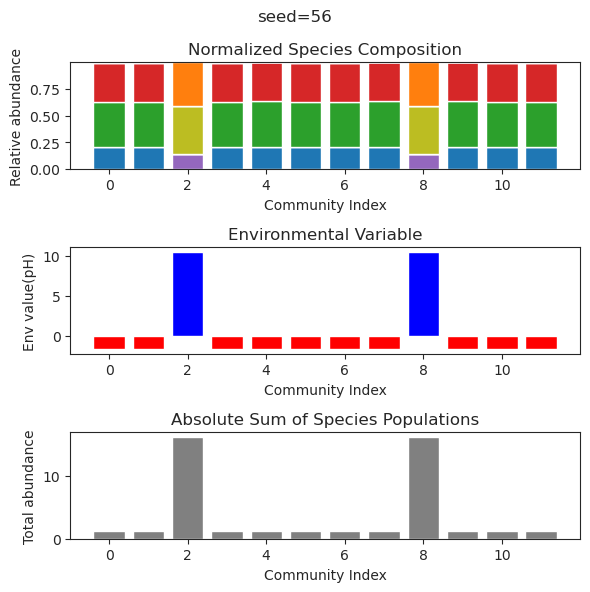

{'species': array([ 1.12792067e-73,  1.03092270e-01,  5.02476565e-01,  5.72787452e-02,
       -9.32978960e-32, -2.93465578e-26,  7.04561305e-01, -1.75880887e-90,
       -1.07087943e-45, -4.31147624e-99,  2.63101717e-24,  5.28048564e-01]), 'env': array([-0.2740756])}
{'species': array([ 2.10279711e-72,  1.03092270e-01,  5.02476565e-01,  5.72787452e-02,
        5.82708457e-33,  9.56990621e-28,  7.04561305e-01, -1.70449328e-88,
        1.23336218e-47,  2.40409702e-91, -5.81414163e-28,  5.28048564e-01]), 'env': array([-0.2740756])}
{'species': array([ 4.36171072e-68,  1.03092270e-01,  5.02476565e-01,  5.72787452e-02,
        7.43878462e-32,  5.65868823e-26,  7.04561305e-01, -1.32809407e-79,
       -6.23931224e-41, -1.74982276e-88,  1.00465631e-24,  5.28048564e-01]), 'env': array([-0.2740756])}
{'species': array([-3.28386375e-68,  1.03092270e-01,  5.02476565e-01,  5.72787452e-02,
        3.24128602e-34,  4.07965973e-27,  7.04561305e-01,  2.05522574e-78,
        4.38400335e-47,  7.29232045e-

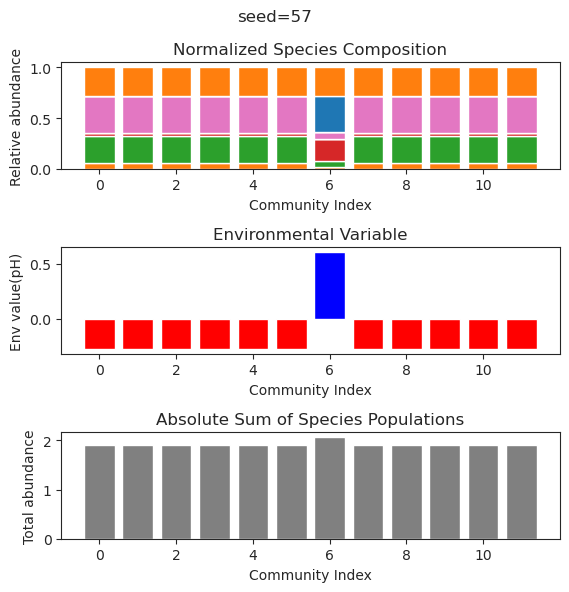

{'species': array([ 7.51829973e-084,  1.52306915e-001,  3.40801439e-001,
        8.09884066e-002,  7.79005536e-293, -9.19569698e-232,
        1.17585856e-001, -3.94396765e-293,  3.58994132e-002,
        1.74535272e-001,  5.59247191e-001,  3.54500429e-007]), 'env': array([-0.89150161])}
{'species': array([-1.27964300e-068,  1.52307022e-001,  3.40800878e-001,
        8.09881434e-002,  4.38052277e-060, -2.03620824e-060,
        1.17586013e-001, -1.32911866e-188,  3.58994586e-002,
        1.74534525e-001,  5.59247899e-001,  9.53867078e-008]), 'env': array([-0.89150345])}
{'species': array([-1.28411652e-77, -4.04607557e-79,  3.04779063e-01, -7.28249609e-56,
        1.00141967e+00, -1.28894161e-55, -6.27162647e-73,  1.41293078e+00,
        1.03070400e+00,  5.75758364e-54, -2.14864857e-74,  1.36977072e-36]), 'env': array([1.74059276])}
{'species': array([ 2.82341614e-085,  1.52306939e-001,  3.40801240e-001,
        8.09884329e-002,  3.09089979e-289, -1.41901797e-233,
        1.17585834e-001, 

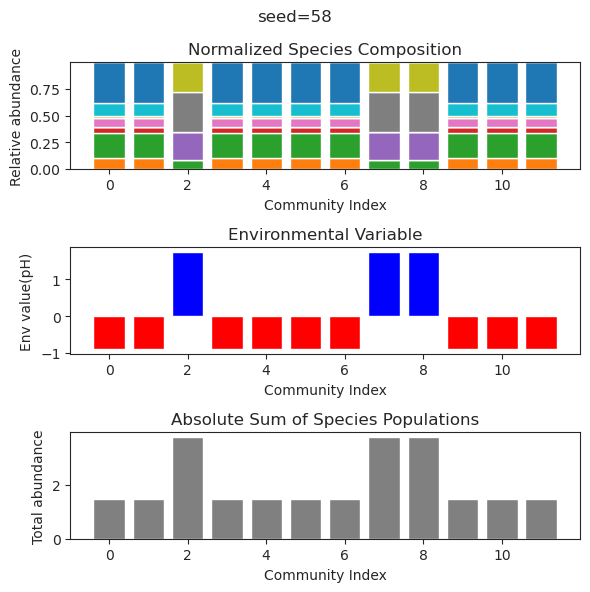

{'species': array([ 7.45926598e-002,  2.74865675e-001, -4.89481119e-030,
        2.09633024e-001,  4.21073436e-001, -8.01744950e-041,
        3.53892982e-036,  9.08037340e-089,  5.54484098e-015,
       -2.36458338e-100, -1.07554406e-037,  3.21286907e-062]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-02,  2.74865675e-01,  3.08581149e-31,  2.09633024e-01,
        4.21073436e-01, -6.86995826e-28,  6.12462872e-38,  1.74754055e-78,
        2.11667537e-19,  7.25762935e-81, -2.77793825e-32,  2.47182405e-54]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-002,  2.74865675e-001, -2.54321011e-025,
        2.09633024e-001,  4.21073436e-001,  1.56718415e-028,
        1.35708027e-033, -9.62005413e-111, -6.24700116e-019,
       -1.11724739e-105, -4.34915224e-033,  3.07980640e-064]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-02,  2.74865675e-01,  1.12600646e-25,  2.09633024e-01,
        4.21073436e-01, -8.49353368e-28, -3.91551674e-33,  3.53596443e-70,

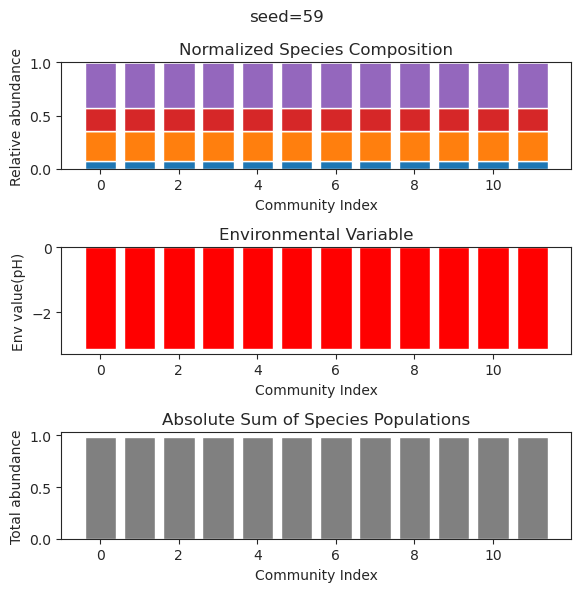

{'species': array([ 7.45926598e-002,  2.74865675e-001, -4.08128983e-035,
        2.09633024e-001,  4.21073436e-001, -2.19789919e-055,
        8.70259097e-038, -1.85733412e-119,  1.20877470e-016,
       -1.04208717e-131, -2.23876485e-050, -4.06263470e-073]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-002,  2.74865675e-001, -4.08128983e-035,
        2.09633024e-001,  4.21073436e-001, -2.19789919e-055,
        8.70259097e-038, -1.85733412e-119,  1.20877470e-016,
       -1.04208717e-131, -2.23876485e-050, -4.06263470e-073]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-002,  2.74865675e-001, -4.08128983e-035,
        2.09633024e-001,  4.21073436e-001, -2.19789919e-055,
        8.70259097e-038, -1.85733412e-119,  1.20877470e-016,
       -1.04208717e-131, -2.23876485e-050, -4.06263470e-073]), 'env': array([-3.1142771])}
{'species': array([ 7.45926598e-002,  2.74865675e-001, -4.08128983e-035,
        2.09633024e-001,  4.21073436e-001, -2.19789919e-055,
        

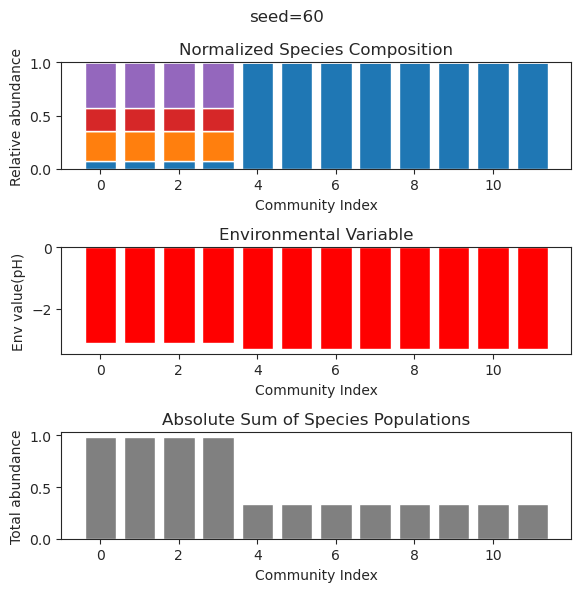

{'species': array([ 1.41997816e-01,  2.06034244e-01,  6.48801391e-39,  7.45484566e-27,
       -3.36351588e-55,  2.17416890e-45,  4.76123808e-50, -5.36851430e-55,
       -9.48451266e-35,  5.04161838e-01,  2.09594322e-57,  5.33034837e-59]), 'env': array([-3.24378256])}
{'species': array([ 1.41997816e-01,  2.06034244e-01, -3.26978549e-38, -6.52980205e-28,
        8.93203132e-56,  1.58320602e-50, -3.27883736e-51,  3.09538790e-55,
       -1.50831278e-35,  5.04161838e-01,  2.35398142e-59, -2.74099283e-60]), 'env': array([-3.24378256])}
{'species': array([-2.29510468e-84,  8.97909586e-84,  1.59951619e+00,  2.02057775e+00,
        1.82226248e+00,  7.48539747e-52,  5.43874534e-45, -7.89530442e-39,
        6.28534689e-01, -1.53580312e-82, -3.44211177e-86, -1.72561270e-75]), 'env': array([3.48185263])}
{'species': array([ 1.41997816e-01,  2.06034244e-01,  4.42537989e-35,  1.09475560e-27,
       -1.82722720e-60,  5.63009726e-63,  8.24280260e-57,  8.03591048e-61,
        2.04312020e-34,  5.04161838

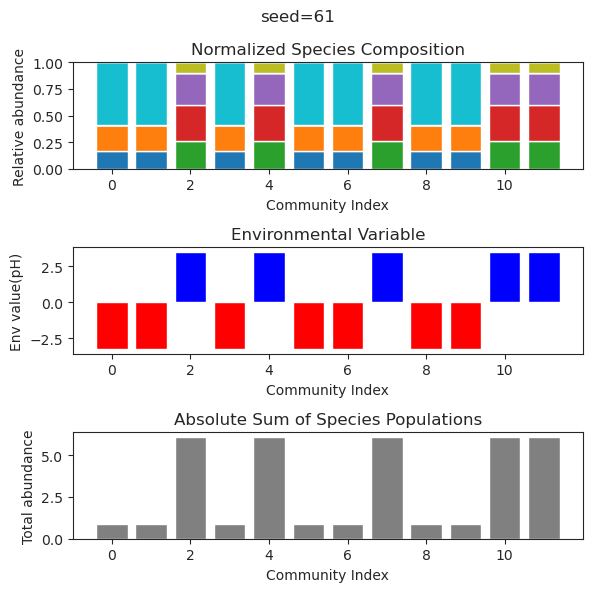

{'species': array([ 4.66215206e-002,  2.98859156e-001, -1.22799720e-101,
        2.25964806e-001,  3.56143919e-001, -1.36390655e-022,
       -4.34486992e-115,  9.74068868e-063, -1.23542326e-125,
        3.05025340e-144, -1.52013973e-091,  3.58105830e-043]), 'env': array([-2.44683552])}
{'species': array([ 4.66215206e-02,  2.98859156e-01,  1.16369407e-68,  2.25964806e-01,
        3.56143919e-01,  1.73771849e-22, -1.67295845e-78,  5.35459265e-44,
        2.55359182e-60,  1.83005791e-77,  1.18712365e-55, -2.20119328e-42]), 'env': array([-2.44683552])}
{'species': array([ 4.71804356e-68, -3.99357145e-34,  3.77425423e+00, -1.17772981e-48,
        4.02438844e-60,  6.19751168e+00, -4.25329541e-46,  7.52544437e-70,
        1.41083122e-39,  1.00270390e-45,  3.31193933e+00,  5.44225537e-61]), 'env': array([7.90858418])}
{'species': array([-1.26254159e-92, -1.26992215e-37,  3.77425423e+00,  4.89903445e-62,
        4.46828524e-67,  6.19751168e+00, -1.02020295e-53,  9.84207756e-87,
        3.481327

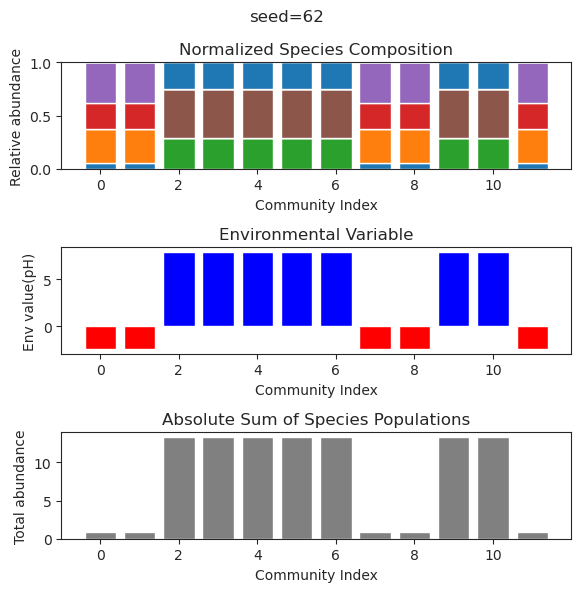

{'species': array([ 1.07745609e-01,  1.48968677e-01, -1.21129204e-68,  9.12230961e-01,
       -3.25488381e-27,  1.52491178e-69,  8.67419391e-75, -1.13344035e-52,
        1.74200740e-88, -1.73925797e-84,  1.49686796e-30,  1.96852131e-37]), 'env': array([-1.76845541])}
{'species': array([ 1.07745609e-01,  1.48968677e-01, -8.61522649e-60,  9.12230961e-01,
        3.59713551e-26,  9.57009940e-62,  2.77003383e-74, -2.51700227e-42,
       -6.12738100e-79, -8.62715112e-83, -7.11888670e-29,  1.69163894e-41]), 'env': array([-1.76845541])}
{'species': array([ 1.07745609e-01,  1.48968677e-01,  5.86347893e-57,  9.12230961e-01,
        4.26514759e-25, -1.41752428e-60, -1.69185405e-65,  2.44357398e-45,
        3.11842619e-75, -9.29388097e-74,  1.12631529e-28,  1.58608906e-35]), 'env': array([-1.76845541])}
{'species': array([ 1.07745609e-001,  1.48968677e-001,  5.54748996e-112,
        9.12230961e-001, -2.73622573e-024, -1.35193306e-091,
        8.93438188e-119, -5.13287220e-074, -4.55500912e-134,
 

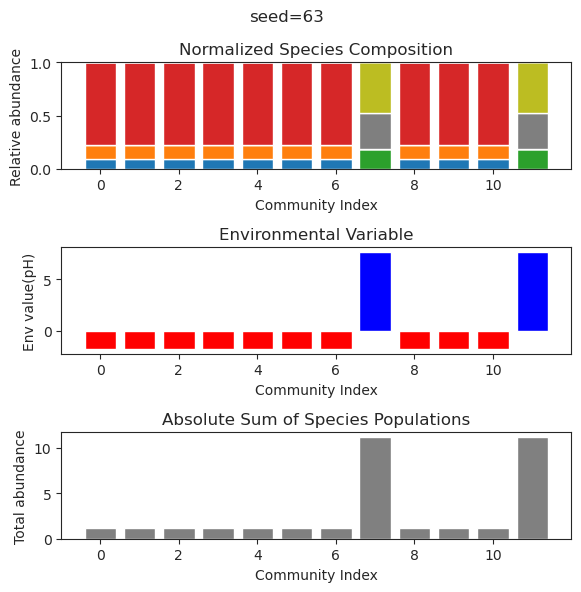

{'species': array([-8.17344847e-22,  3.19332888e-01, -1.30272052e-22,  1.17912917e-86,
        3.39338244e-34,  1.99336539e-42, -4.23174216e-35,  1.25722920e-82,
        2.35098503e-01,  7.59177302e-01, -3.10726812e-74,  9.25842116e-27]), 'env': array([-2.66772073])}
{'species': array([ 1.07190472e-23,  3.19332888e-01,  1.08946253e-23, -2.37595528e-77,
        8.16174995e-33,  2.51234354e-37, -1.18411478e-36, -1.11049017e-74,
        2.35098503e-01,  7.59177302e-01,  6.91458331e-71,  1.70122947e-28]), 'env': array([-2.66772073])}
{'species': array([-1.36638368e-23,  3.19332888e-01, -9.45988231e-23, -4.75263128e-95,
        3.24442401e-35,  2.96186260e-44, -4.16124420e-36, -7.02083169e-91,
        2.35098503e-01,  7.59177302e-01,  9.57165332e-80, -3.21928351e-28]), 'env': array([-2.66772073])}
{'species': array([ 1.61461731e-20,  3.19332888e-01,  2.67350832e-22,  9.32777600e-50,
       -6.91420848e-30,  2.84386047e-30, -2.73961559e-27,  9.71548235e-51,
        2.35098503e-01,  7.5917730

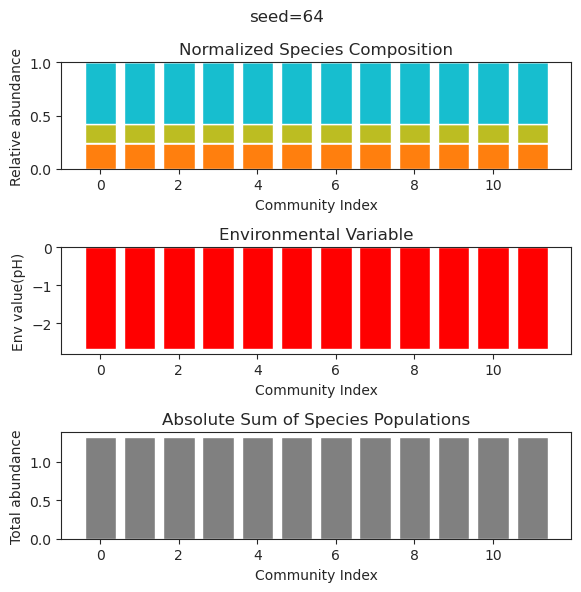

{'species': array([ 5.40994146e-002,  5.12953612e-002,  4.73804553e-003,
       -2.06534161e-263,  1.41947921e-001,  3.37546117e-103,
        2.39830439e-001,  1.74230395e-001,  6.12771654e-253,
       -2.84977533e-299,  9.19679632e-001,  9.12583803e-003]), 'env': array([0.26738751])}
{'species': array([ 8.93580966e-003,  1.59077794e-001,  1.41258853e-004,
        1.67891946e-248,  5.49012189e-002, -9.99964672e-089,
        6.14128769e-001,  5.43049546e-001,  5.23385800e-253,
       -8.24154943e-303,  4.52672985e-003,  3.67915448e-005]), 'env': array([-1.23796344])}
{'species': array([ 3.06566586e-001,  6.64797636e-002,  9.35812031e-002,
        6.37785798e-312,  1.00733778e-001, -6.05673959e-143,
        2.41320989e-001,  9.19535266e-002,  1.16768536e-250,
        5.87336967e-293,  5.55530310e-001,  1.67298214e-001]), 'env': array([-0.36478143])}
{'species': array([ 9.16209762e-003,  1.59623992e-001,  1.47175130e-004,
        1.30873590e-303,  5.40207387e-002, -8.73160693e-147,
      

KeyboardInterrupt: 

In [ ]:
session_path='Results_ptailed/Session_Test4'
to_save={}
description=''
simulated_result={}

for seed_num in range(100):
    if not os.path.isdir(session_path):
        os.mkdir(session_path)
    # functions for uniform 

    f_I = lambda : uniform_distribution(0.5,0.5)
    f_g = lambda : np.ones(1)
    f_k = lambda : np.ones(1)
    f_p = lambda : custom_distribution(3,1)
    f_q = lambda : uniform_distribution(0,1)
    f_beta = lambda : np.ones(1)
    seed_num=seed_num
    to_plot=True

    N=12
    N_env=1


    I = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            I[i,j] = f_I()
    for i in range(N):
        I[i,i] =1

    g = np.zeros((N))
    for i in range(N):
        g[i] = f_g()

    k = np.zeros((N))
    for i in range(N):
        k[i] = f_k()   

    p = np.zeros((N_env, N))
    for i in range(N_env):
        for j in range(N):
            p[i,j] = f_p()


    q = np.zeros((N, N_env))
    for i in range(N):
        for j in range(N_env):
            q[i,j] = f_q()




    beta = np.zeros(N_env)
    for i in range(N_env):
        beta[i]=f_beta()

    delta = 0.1 ## ln(100000)/24 ~= 0.5 per hour
    migration_rate=0#1e-7
    system_config = {
        'I': I,
        'g': g,
        'k': k,
        'p': p,
        'q': q,
        'beta': beta,
        'delta': delta,
        'migration_rate' : migration_rate,
        'N': N,
        'N_env': N_env,
        'seed_num':seed_num,
    } 

    file_path = f'{session_path}/system_config.json'

    label="test"
    sys
    ##

    y_out_list=[]
    system_config['beta'] = np.array([0.99])*delta

    for i in range(N):

        species_index=np.arange(0,N)
        env_index=np.array([0])
        y0_species=one_hot_vector(N,i)
        y0_env=[0]
        t=np.linspace(0, 2000, 10000)

        y_out = run_gLV_env_dynamics(y0_species, y0_env, t, system_config, species_index, env_index, to_plot=False)

        y_out_list.append(y_out)

    num_datasets = len(y_out_list)

    # Prepare subplots
    fig, axs = plt.subplots(3, 1, figsize=(6, 6))

    # Data for plots
    species_matrix = np.array([y_out['species'] for y_out in y_out_list])
    env_data = np.array([y_out['env'][0] for y_out in y_out_list])  # Assuming env is a single-element array

    # Normalize species data
    species_matrix = np.maximum(species_matrix, 0)  # Removing negative values for normalization
    species_sums = np.sum(species_matrix, axis=1, keepdims=True)
    normalized_species = species_matrix / species_sums

    # Absolute sums of species data (sum across all species for each dataset)
    absolute_sums = np.sum(species_matrix, axis=1)
    simulated_result[seed_num]={'species':species_matrix, 'env' : env_data}

    if to_plot:
        plt.suptitle(f'seed={seed_num}')

        # Plotting species composition as stacked bars
        bottom_values = np.zeros(num_datasets)  # Initial bottom values are zeros
        for i in range(normalized_species.shape[1]):  # Loop through each species
            axs[0].bar(np.arange(num_datasets), normalized_species[:, i], bottom=bottom_values, label=f'Species {i+1}')
            bottom_values += normalized_species[:, i]  # Update bottom values for stacking

        axs[0].set_title('Normalized Species Composition')
        axs[0].set_xlabel('Community Index')
        axs[0].set_ylabel('Relative abundance')
        #axs[0].legend()

        # Plotting environmental factors
        colors = ['blue' if x > 0 else 'red' for x in env_data]  # Determine color based on sign of value
        axs[1].bar(np.arange(num_datasets), env_data, color=colors, width=0.8)
        axs[1].set_title('Environmental Variable')
        axs[1].set_xlabel('Community Index')
        axs[1].set_ylabel('Env value(pH)')

        # Plotting absolute sums of species data
        axs[2].bar(np.arange(num_datasets), absolute_sums, color='gray', width=0.8)
        axs[2].set_title('Absolute Sum of Species Populations')
        axs[2].set_xlabel('Community Index')
        axs[2].set_ylabel('Total abundance')

        plt.tight_layout()
        plt.savefig(session_path+f'/diagram_{seed_num}.png')

        #if to_plot:
        #    plt.savefig()


        #plt.show()
#simulated_result = {'a': 1, 'b': 2, 'c': 3}  # Your existing dictionary
#description = "This is a description of the simulated result."

# Combine both into a new dictionary
data_to_save = {
    'result': simulated_result,
    'description': description
}
# Serialize the combined data to a pickle file
with open(session_path+'/result_and_description.pkl', 'wb') as file:
    pickle.dump(data_to_save, file)